# Proyecto Fundamentos de Analítica I

## Universidad ICESIS

### *Integrantes*

Andrea Estefania Timaran Buchely

Laura Daniela Espinosa Maca

Carlos Enrique Jaramillo Aros

INTRODUCCION

En el presente proyecto se presentará el desarrollo y análisis de una base de datos de segmentos de clientes que contiene información personal y datos como la puntuación de gasto, así como el segmento al que pertenece cada cliente. Se realizará una verificación de la de calidad de los datos, un análisis de la relación entre las variables predictivas con el Segmento, y una evaluación de la calidad de los modelos predictivos a partir de una base de train y test. Se utilizarán 5 modelos predictivos (Regresión logística, K - vecinos más cercanos (KNN) y Arboles de Decisión, Bagging Decition Tree, Bagging KNeighbots) que permitirán clasificar el segmento de los clientes a partir de los valores de las demás variables, y escoger el mejor modelo con base en el acurracy y el kappa. Posteriormente, se realizará un análisis de componentes principales (PCA), escogiendo el número de componentes necesarios para conservar el 90% de la representación original.
Por último, se realizará la caracterización de los clientes: Con los datos en su nueva representación de PCs, realizando una segmentación, estableciendo el mejor número de clusters, con lo cual se caracterizará los clusters con respecto a las variables originales.


Diccionario de datos

**1. ID:** ID único

**2. Gender:** Género del cliente

**3. Ever_Married:** Estado civil del cliente

**4. Age:** Edad del cliente

**5. Graduated:** ¿El cliente es un graduado?

**6. Professión:** Profesión del cliente

**7. Work_Experience:** Experiencia laboral en años

**8. Spending_Score:** Puntuación de gasto del cliente

**9. Family_Size:** Número de miembros de la familia del cliente (incluido el cliente)

**10. Var_1:** Categoría anónima para el cliente

**11. Segmentation (objetivo):** Segmento del cliente

In [ ]:
! git clone https://github.com/laurita1605/Proyecto_Fundamentos_I.git

fatal: destination path 'Proyecto_Fundamentos_I' already exists and is not an empty directory.


Creación de carpetas pkl

In [ ]:
!mkdir models

mkdir: cannot create directory ‘models’: File exists


In [ ]:
!mkdir metrics

mkdir: cannot create directory ‘metrics’: File exists


In [ ]:
!ls

metrics  models  Proyecto_Fundamentos_I  sample_data


In [ ]:
!pwd

/content


Librerias

In [ ]:
import pandas as  pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("darkgrid")
import scipy.stats
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.stattools import durbin_watson
from statsmodels.stats.diagnostic import het_breuschpagan
import statsmodels.api as sms
from sklearn.linear_model import Ridge, Lasso, ElasticNet, RidgeCV, LassoCV, ElasticNetCV, LogisticRegression ,LogisticRegressionCV, LinearRegression
from sklearn.model_selection import cross_val_score, RepeatedKFold, KFold,cross_validate,StratifiedKFold, LeaveOneOut, GridSearchCV, train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score, cohen_kappa_score, precision_score, recall_score, confusion_matrix,classification_report, silhouette_samples, silhouette_score, calinski_harabasz_score
from scipy.stats import skew, kurtosis, shapiro, kstest, chi2, levene, ttest_1samp, spearmanr
from sklearn.preprocessing import StandardScaler, LabelEncoder
from scipy.spatial import distance
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
from sklearn.dummy import DummyClassifier
import itertools
from yellowbrick.classifier import ROCAUC
from sklearn.feature_selection import SelectKBest, f_classif, RFECV, VarianceThreshold
import pickle
from sklearn import tree
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.cluster import KMeans
from collections import Counter
from sklearn.neighbors import KNeighborsClassifier

from sklearn.inspection import permutation_importance
import math
import warnings
!pip install dython
warnings.filterwarnings("ignore")
from dython.nominal import identify_nominal_columns
from dython.nominal import associations

# 1. Limpieza y EDA:

##Carga de los datos

In [ ]:
data_train = pd.read_csv("/content/Proyecto_Fundamentos_I/Train.csv")
print(data_train.shape)
data_train.head(10)

(8068, 11)


,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,462809,Male,No,22,No,Healthcare,1.0,Low,4.0,Cat_4,D
1,462643,Female,Yes,38,Yes,Engineer,NaN,Average,3.0,Cat_4,A
2,466315,Female,Yes,67,Yes,Engineer,1.0,Low,1.0,Cat_6,B
3,461735,Male,Yes,67,Yes,Lawyer,0.0,High,2.0,Cat_6,B
4,462669,Female,Yes,40,Yes,Entertainment,NaN,High,6.0,Cat_6,A
5,461319,Male,Yes,56,No,Artist,0.0,Average,2.0,Cat_6,C
6,460156,Male,No,32,Yes,Healthcare,1.0,Low,3.0,Cat_6,C
7,464347,Female,No,33,Yes,Healthcare,1.0,Low,3.0,Cat_6,D
8,465015,Female,Yes,61,Yes,Engineer,0.0,Low,3.0,Cat_7,D
9,465176,Female,Yes,55,Yes,Artist,1.0,Average,4.0,Cat_6,C


Para los datos de entrenamiento en total hay 8.068 registros de clientes y 11 atributos que se les fueron medidos.

In [ ]:
data_test = pd.read_csv("/content/Proyecto_Fundamentos_I/Test.csv")
print(data_test.shape)
data_test.head(10)

(2627, 11)


,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,458989,Female,Yes,36,Yes,Engineer,0.0,Low,1.0,Cat_6,B
1,458994,Male,Yes,37,Yes,Healthcare,8.0,Average,4.0,Cat_6,A
2,458996,Female,Yes,69,No,NaN,0.0,Low,1.0,Cat_6,A
3,459000,Male,Yes,59,No,Executive,11.0,High,2.0,Cat_6,B
4,459001,Female,No,19,No,Marketing,NaN,Low,4.0,Cat_6,A
5,459003,Male,Yes,47,Yes,Doctor,0.0,High,5.0,Cat_4,C
6,459005,Male,Yes,61,Yes,Doctor,5.0,Low,3.0,Cat_6,D
7,459008,Female,Yes,47,Yes,Artist,1.0,Average,3.0,Cat_6,D
8,459013,Male,Yes,50,Yes,Artist,2.0,Average,4.0,Cat_6,B
9,459014,Male,No,19,No,Healthcare,0.0,Low,4.0,Cat_6,B


Para los datos de prueba en total hay 2.627 registros de clientes e igualmente los 11 atributos que se les fueron medidos.

In [ ]:
# Antes de realizar los cambios podemos darnos cuenta del baseline para los modelos que
# vamos a implementar
# Al estar trabajando con una tarea de clasificación, utilizamos la clase mayoritaria
# En este caso es el segmento del cliente tipo D
# 28.11% es nuestro baseline

print(pd.crosstab(index=data_train["Segmentation"], columns="count"))
baseline = data_train['Segmentation'][data_train['Segmentation'] == 'D'].count()/data_train.shape[0]*100
print(f"Baseline: {baseline}")

col_0         count
Segmentation       
A              1972
B              1858
C              1970
D              2268
Baseline: 28.11105602379772


In [ ]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8068 entries, 0 to 8067
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ID               8068 non-null   int64  
 1   Gender           8068 non-null   object 
 2   Ever_Married     7928 non-null   object 
 3   Age              8068 non-null   int64  
 4   Graduated        7990 non-null   object 
 5   Profession       7944 non-null   object 
 6   Work_Experience  7239 non-null   float64
 7   Spending_Score   8068 non-null   object 
 8   Family_Size      7733 non-null   float64
 9   Var_1            7992 non-null   object 
 10  Segmentation     8068 non-null   object 
dtypes: float64(2), int64(2), object(7)
memory usage: 693.5+ KB


In [ ]:
### Revisión de datos faltantes

for var in data_train.columns:
  cant = data_train[var].isna().sum()
  print(f"Existen {cant} datos faltantes en {var}")

Existen 0 datos faltantes en ID
Existen 0 datos faltantes en Gender
Existen 140 datos faltantes en Ever_Married
Existen 0 datos faltantes en Age
Existen 78 datos faltantes en Graduated
Existen 124 datos faltantes en Profession
Existen 829 datos faltantes en Work_Experience
Existen 0 datos faltantes en Spending_Score
Existen 335 datos faltantes en Family_Size
Existen 76 datos faltantes en Var_1
Existen 0 datos faltantes en Segmentation


De un total de 11 variables, 6 de ellas presentan valores faltantes

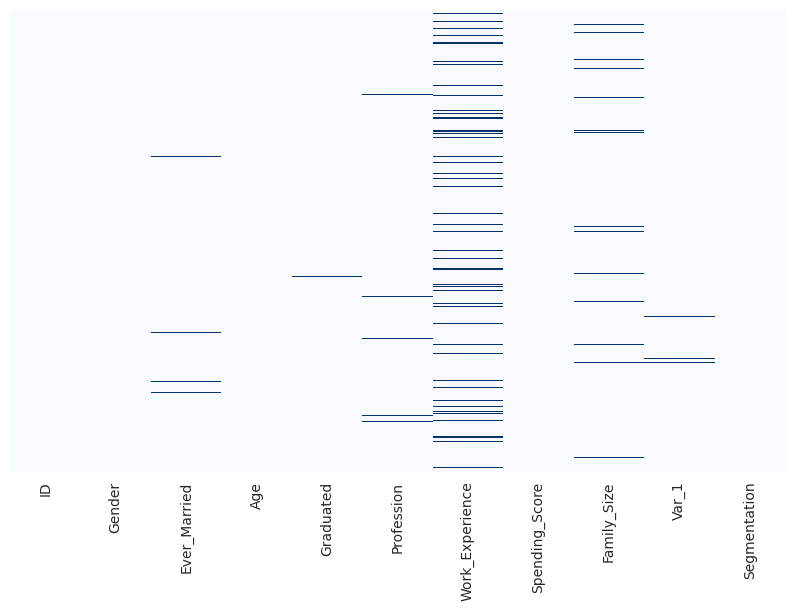

In [ ]:
# Dibujamos un mapa de calor para vislumbrar la ubicación de los valores faltantes

plt.figure(figsize=(10,6))
sns.heatmap(data_train.isnull(), yticklabels = False, cbar = False, cmap="Blues")
plt.show()

Gráficamente se puede observar que la variable Work_Experience es la que mayor cantidad de datos faltantes presenta, seguida de Family_size. Además no se detalla un patrón en los datos faltantes, es decir que en un individuo presente información faltante en cada una de las características que se están midiendo.

In [ ]:
data_train.describe(include="all")

,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
count,8068.000000,8068,7928,8068.000000,7990,7944,7239.000000,8068,7733.000000,7992,8068
unique,NaN,2,2,NaN,2,9,NaN,3,NaN,7,4
top,NaN,Male,Yes,NaN,Yes,Artist,NaN,Low,NaN,Cat_6,D
freq,NaN,4417,4643,NaN,4968,2516,NaN,4878,NaN,5238,2268
mean,463479.214551,NaN,NaN,43.466906,NaN,NaN,2.641663,NaN,2.850123,NaN,NaN
std,2595.381232,NaN,NaN,16.711696,NaN,NaN,3.406763,NaN,1.531413,NaN,NaN
min,458982.000000,NaN,NaN,18.000000,NaN,NaN,0.000000,NaN,1.000000,NaN,NaN
25%,461240.750000,NaN,NaN,30.000000,NaN,NaN,0.000000,NaN,2.000000,NaN,NaN
50%,463472.500000,NaN,NaN,40.000000,NaN,NaN,1.000000,NaN,3.000000,NaN,NaN
75%,465744.250000,NaN,NaN,53.000000,NaN,NaN,4.000000,NaN,4.000000,NaN,NaN


In [ ]:
### Validación de los diferentes valores en los datos

for var in data_train.columns:
  cant = data_train[var].nunique()
  print(f"El atributo {var} cuenta con {cant} valores distintos")

El atributo ID cuenta con 8068 valores distintos
El atributo Gender cuenta con 2 valores distintos
El atributo Ever_Married cuenta con 2 valores distintos
El atributo Age cuenta con 67 valores distintos
El atributo Graduated cuenta con 2 valores distintos
El atributo Profession cuenta con 9 valores distintos
El atributo Work_Experience cuenta con 15 valores distintos
El atributo Spending_Score cuenta con 3 valores distintos
El atributo Family_Size cuenta con 9 valores distintos
El atributo Var_1 cuenta con 7 valores distintos
El atributo Segmentation cuenta con 4 valores distintos


## Análisis de variables

In [ ]:
# Utilizamos la librería dython para identificar las variables categóricas

categorical_features=identify_nominal_columns(data_train)
categorical_features

['Gender',
 'Ever_Married',
 'Graduated',
 'Profession',
 'Spending_Score',
 'Var_1',
 'Segmentation']

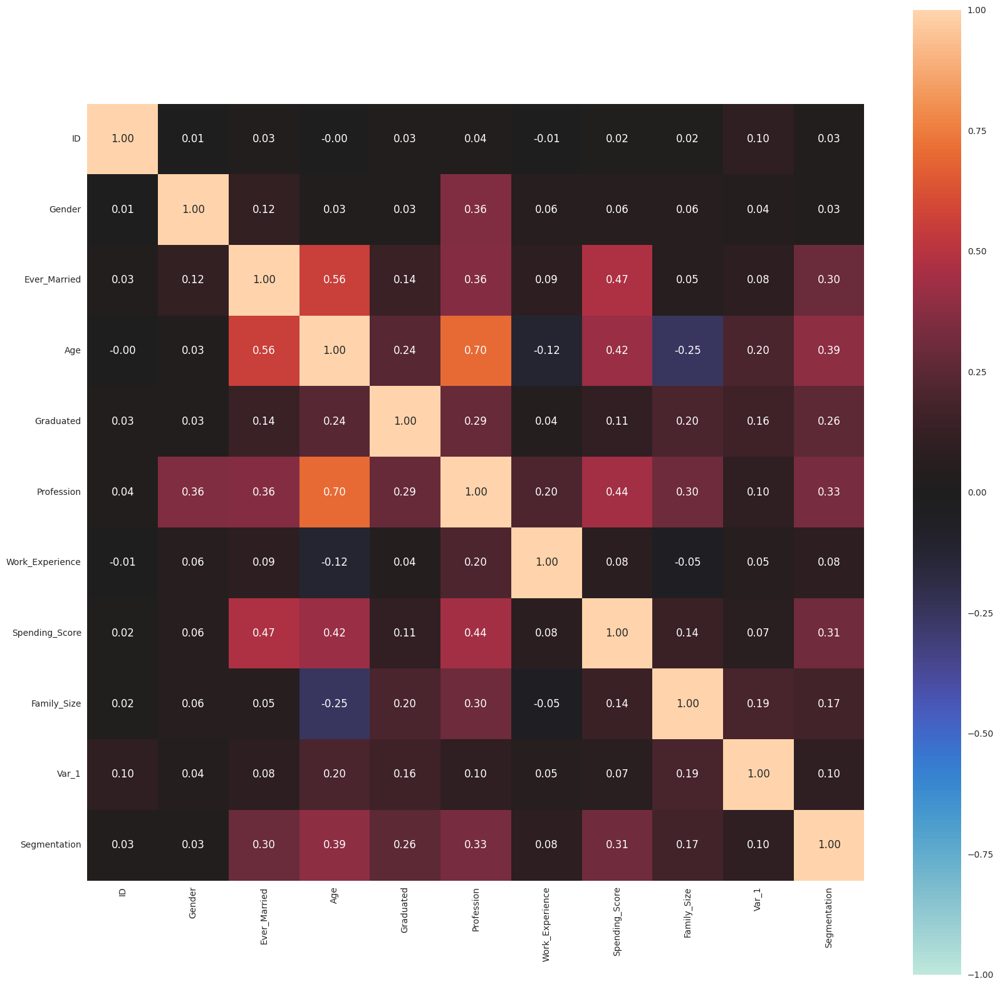

In [ ]:
# Matriz de correlacion para todas las variable

complete_correlation= associations(data_train, num_num_assoc='spearman', figsize=(20,20))

De acuerdo con el grafico de correlación presentado anteriormente, podemos detallar que las variables que están más correlacionadas son la edad del cliente con su profesión, si el cliente está casado o no con la edad que tiene y con su puntuación de gasto. Para las demás variables son correlaciones por debajo de 0.4.

 ### Variables númericas

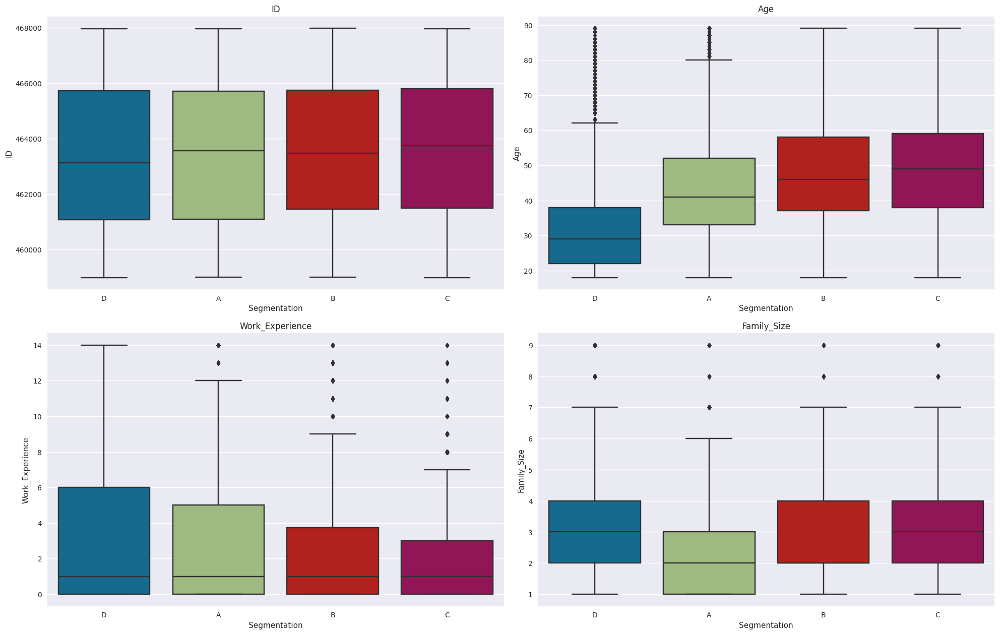

In [ ]:
# Mediante el diagrama de cajas y bigotes vemos un resumen visual de la distribución de cada
# una de las variables independientes con respecto a la dependiente
# Podemos observar la distribución de los distintos grupos

fig = plt.figure(figsize=(20,50))
i=1

for var_num in data_train.select_dtypes(include=['int64','float64']).columns[0:5]:
    ax = fig.add_subplot(8, 2, i)
    sns.boxplot(x=data_train.columns[10], y=var_num, data=data_train)
    plt.title(var_num)
    i+=1
fig.tight_layout()

En el grafico anterior, se puede detallar como se ve distribuido el segmento del cliente, con respecto a las variables numéricas.
Con el ID podemos ver que la distribución de los segmentos de los clientes está muy uniforme, esto por el hecho de que es un identificador único y no se repite.

Para la edad, se observa que está muy bien distribuida para cada uno de los segmentos y que en particular en el segmento D pareciera que están en promedio los clientes más jóvenes, alrededor de los 30 años; los clientes con más edad alrededor de los 45 en adelante se ubican en los segmentos B y C.  

Con respecto a los años de experiencia laboral del cliente, se puede detallar que los clientes con pocos años se encuentran ubicados en el segmento C y que los que mas experiencia laboral tienen se encuentran ubicados en el segmento D.
Y, por último, para el número de miembros de la familia del cliente (incluido el), los clientes con pocos miembros usualmente están ubicados en el segmento A y para clientes con familias más grandes están igualmente repartidos en los segmentos B, C y D.

A grandes rasgos se puede comentar que los clientes del segmento D son clientes jóvenes, con varios años de experiencia y con una familia de mas de dos integrantes. Los clientes del segmento A, se caracterizan por tener en promedio 40 años, con una familia pequeña y con años de experiencia laboral entre los 0 y 5. Los clientes del segmento B, se caracterizan por tener en promedio 45 años, con un número de integrantes familiar promedio y con años de experiencia laboral entre los 0 y 4. Y los clientes del segmento C, son clientes que se están iniciando en el mundo laboral, tienen una familia con el número de integrantes promedio y son los clientes con mas edad, en promedio 50 años.


* Valores atípicos

In [ ]:
# Buscamos datos atípicos a partir de los diagramas previos y lo suministrado en el diccionario de datos
# Establecemos unos límites superiores e inferiores para ver si hay datos que se salen de lo normal
# Para estos límites establecemos aquellos valores para cada variable a una distancia de más o menos 4 desviaciones estándar

upper_bounds={}
lower_bounds={}
for col in data_train.select_dtypes(include=['int64','float64']).columns:
    values=data_train[col]
    upper_bounds[col]=values.mean()+4*values.std()
    lower_bounds[col]=values.mean()-4*values.std()

In [ ]:
# Localizamos aquellos valores que se pasen de estos límites

for col in data_train.select_dtypes(include=['int64','float64']).columns:
    values=data_train[col]
    if(data_train[values>upper_bounds[col]][col].count() > 0):
        print("Por encima")
        print(data_train[values>upper_bounds[col]][col])
    if(data_train[values<lower_bounds[col]][col].count() > 0):
        print("Por debajo")
        print(data_train[values<lower_bounds[col]][col])

Por encima
150     9.0
940     9.0
1447    9.0
1509    9.0
1546    9.0
1902    9.0
1942    9.0
2401    9.0
2511    9.0
2568    9.0
2609    9.0
2647    9.0
2710    9.0
2716    9.0
3035    9.0
3235    9.0
3361    9.0
3705    9.0
4249    9.0
4633    9.0
4698    9.0
4948    9.0
4956    9.0
5078    9.0
5418    9.0
5581    9.0
6061    9.0
6303    9.0
6370    9.0
6392    9.0
6879    9.0
6894    9.0
6909    9.0
7047    9.0
7270    9.0
7347    9.0
7497    9.0
7542    9.0
7579    9.0
7745    9.0
7776    9.0
7897    9.0
7900    9.0
7995    9.0
Name: Family_Size, dtype: float64


In [ ]:
# Revisamos la información de aquellos clientes con valores atípicos

data_outlier = data_train[data_train['Family_Size'] > upper_bounds['Family_Size']]
print(data_outlier.shape)
data_outlier.head()

(44, 11)


,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
150,464972,Male,Yes,67,No,Lawyer,0.0,High,9.0,Cat_4,A
940,466441,Male,No,22,No,Healthcare,0.0,Low,9.0,Cat_6,D
1447,466534,Male,No,28,No,Healthcare,0.0,Low,9.0,Cat_6,D
1509,464634,Female,No,32,Yes,Engineer,NaN,Low,9.0,Cat_4,D
1546,467749,Male,No,19,No,Healthcare,1.0,Low,9.0,Cat_7,D


In [ ]:
data_outlier.describe()

,ID,Age,Work_Experience,Family_Size
count,44.000000,44.000000,40.000000,44.0
mean,463812.159091,36.931818,2.625000,9.0
std,2207.334349,14.254167,3.446942,0.0
min,459330.000000,18.000000,0.000000,9.0
25%,462063.250000,26.750000,0.000000,9.0
50%,464678.500000,31.500000,1.000000,9.0
75%,464969.750000,46.250000,4.000000,9.0
max,467749.000000,69.000000,11.000000,9.0


In [ ]:
cols_to_mode = data_outlier.select_dtypes(include=['object']).columns[0:6]

for col in cols_to_mode:
    mode_val = data_train[col].mode()[0]
    print(f"La moda del atributo '{col}' es {mode_val}.")

La moda del atributo 'Gender' es Male.
La moda del atributo 'Ever_Married' es Yes.
La moda del atributo 'Graduated' es Yes.
La moda del atributo 'Profession' es Artist.
La moda del atributo 'Spending_Score' es Low.
La moda del atributo 'Var_1' es Cat_6.


In [ ]:
for var in data_outlier.columns[1:]:
  print(pd.crosstab(index=data_outlier[var],columns="count").reset_index(),"\n")

col_0  Gender  count
0      Female     21
1        Male     23 

col_0 Ever_Married  count
0               No     22
1              Yes     22 

col_0  Age  count
0       18      1
1       19      1
2       22      3
3       23      2
4       25      2
5       26      2
6       27      2
7       28      3
8       29      1
9       30      3
10      31      2
11      32      2
12      33      3
13      37      1
14      40      1
15      41      1
16      43      1
17      45      2
18      50      2
19      51      1
20      55      1
21      56      2
22      60      1
23      62      1
24      65      1
25      67      1
26      69      1 

col_0 Graduated  count
0            No     27
1           Yes     15 

col_0     Profession  count
0             Artist      6
1             Doctor      5
2           Engineer      5
3      Entertainment      2
4          Executive      8
5         Healthcare      9
6          Homemaker      1
7             Lawyer      4
8          Marketing      

Se identificaron datos atípicos en la variable que indica el número de integrantes en la familia, especialmente aquellos con 9 integrantes. Tras observar que la mayoría correspondían a hombres jóvenes recién graduados con menos de 1 año de experiencia laboral, se optó por excluirlos de la base de datos de entrenamiento. Esta decisión se tomó para evitar posibles sesgos en modelos o análisis, ya que representaban una situación inusual en comparación con el resto de los clientes.

In [ ]:
# Eliminamos los registros que tenían atípicos en la variable Family_Size

data_train = data_train.drop(data_outlier.index).reset_index(drop=True)
print(data_train.shape)
pd.crosstab(index=data_train['Family_Size'],columns="count").reset_index()

(8024, 11)


col_0,Family_Size,count
0,1.0,1453
1,2.0,2390
2,3.0,1497
3,4.0,1379
4,5.0,612
5,6.0,212
6,7.0,96
7,8.0,50


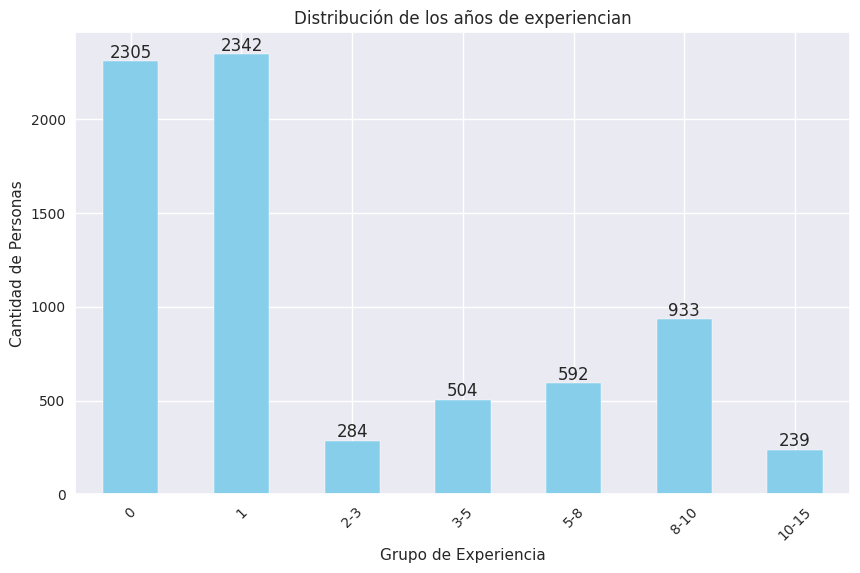

In [ ]:
# Grafico de Grupos de Edad

df = data_train.copy()

bins = [0, 1, 2, 3, 5,8, 10, 15]
labels = ['0', '1', '2-3', '3-5', '5-8', '8-10', '10-15']

df['Work_Experience'] = pd.cut(df['Work_Experience'], bins=bins, labels=labels, right=False)

# Contar la cantidad de observaciones en cada grupo de edad
experience_count = df['Work_Experience'].value_counts().sort_index()

# Generar un gráfico de barras
plt.figure(figsize=(10, 6))
experience_count.plot(kind='bar', color='skyblue')
plt.title('Distribución de los años de experiencian')
plt.xlabel('Grupo de Experiencia')
plt.ylabel('Cantidad de Personas')
plt.xticks(rotation=45)
# Agregar etiquetas encima de cada barra
for idx, value in enumerate(experience_count):
    plt.text(idx, value + 0.1, str(value), ha='center', va='bottom')

plt.show()

Con relación a los años de experiencia laboral, se puede detallar que la mayoría de los clientes son personas con menos de 1 año de experiencia; los clientes que siguen son aquellos que tienen entre 8 y 10 años y por último son muy pocos los clientes que tienen entre 10 y 15 años de experiencia laboral.

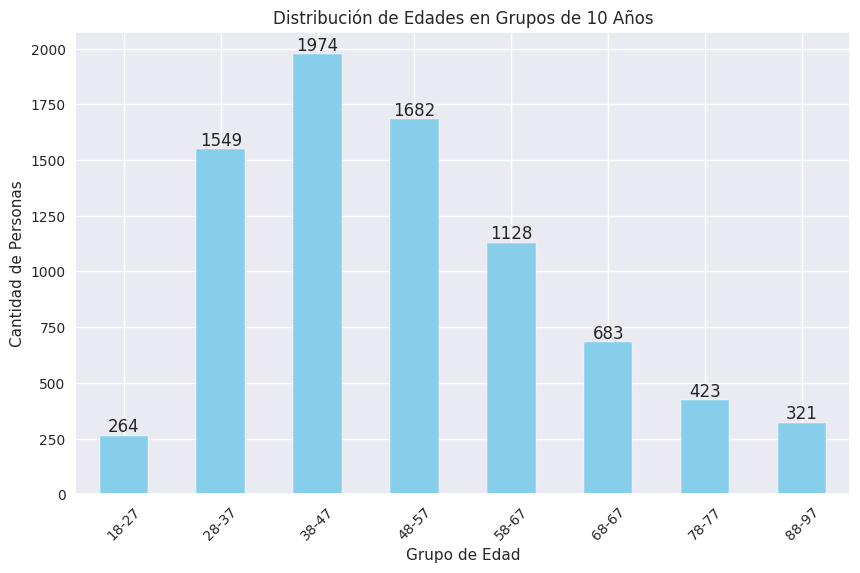

In [ ]:
# Gráfico de los grupos de edad

bins = [10, 20, 30, 40, 50, 60, 70, 80, 90 ]
labels = ['18-27', '28-37', '38-47', '48-57', '58-67', '68-67', '78-77', '88-97' ]
df['AgeGroup'] = pd.cut(df['Age'], bins=bins, labels=labels, right=False)

# Contar la cantidad de observaciones en cada grupo de edad
edad_counts = df['AgeGroup'].value_counts().sort_index()

# Generar un gráfico de barras
plt.figure(figsize=(10, 6))
edad_counts.plot(kind='bar', color='skyblue')
plt.title('Distribución de Edades en Grupos de 10 Años')
plt.xlabel('Grupo de Edad')
plt.ylabel('Cantidad de Personas')
plt.xticks(rotation=45)
# Agregar etiquetas encima de cada barra
for idx, value in enumerate(edad_counts):
    plt.text(idx, value + 0.1, str(value), ha='center', va='bottom')

plt.show()

En el gráfico se presentan las edades de los clientes organizadas en grupos de 10 años. Se puede detallar que la mayoría de los clientes se encuentran en el rango de edades de 38 y 47 años. Además, se nota una baja representación de clientes con edadesentre 18 y 27 años, así como aquellos que superan los 78 años.

 ### Variables categóricas

In [ ]:
## Fórmula para calcular frecuencia absoluta y relativa

def frequency(df_freq,column):
  table_freq=(pd.crosstab(index=df_freq[column],columns="count")).reset_index()
  table_freq['Freq. Rel.']=table_freq['count']/sum(table_freq['count'])
  table_freq.rename(columns={'count':'Freq. Abs.'},inplace=True)
  table_freq=table_freq.sort_values(by='Freq. Abs.',ascending=False).reset_index(drop=True)
  table_freq.style.format({'Freq. Rel.' : "{:.2%}"})

  return table_freq

def plot_frequency(table_freq,column,title):
  max_y = table_freq['Freq. Abs.'].max() + 500
  fig_cont_fa = plt.figure(figsize=(6, 4))
  ax = fig_cont_fa.add_axes([0,0,1,1])
  ax.bar(table_freq[column],table_freq['Freq. Abs.'])
  ax.bar_label(ax.containers[0], label_type='edge',fmt='%.0f', padding=5)
  ax.set(ylim=(0, max_y))
  plt.title(title)
  plt.ylabel('Freq. Abs.')
  plt.xlabel(column)
  plt.xticks(rotation=30, ha='right')
  plt.show()

In [ ]:
list_category = data_train.select_dtypes(include=['object']).columns
data_train[list_category].describe().T

,count,unique,top,freq
Gender,8024,2,Male,4394
Ever_Married,7884,2,Yes,4621
Graduated,7948,2,Yes,4953
Profession,7900,9,Artist,2510
Spending_Score,8024,3,Low,4852
Var_1,7948,7,Cat_6,5221
Segmentation,8024,4,D,2250


La tabla proporciona una visión general de la distribución de las categorías en cada característica. Podemos observar que la variable Profession existen 9 categorias diferentes siendo Artist la más frecuente con 2510 registros.

La mayoría de clientes en el conjunto de datos han estado casadas y son graduadas, con 4621 y 4953 instancias respectivamente.

La variable Var_1 cuenta con 7 categorias diferentes de las cuales "Cat_6" es la más común, con 5221 instancias.

El segmento D es el más común, con 2250 instancias.

La mayoria de clientes son hombres y tiene una puntuación de gastos baja

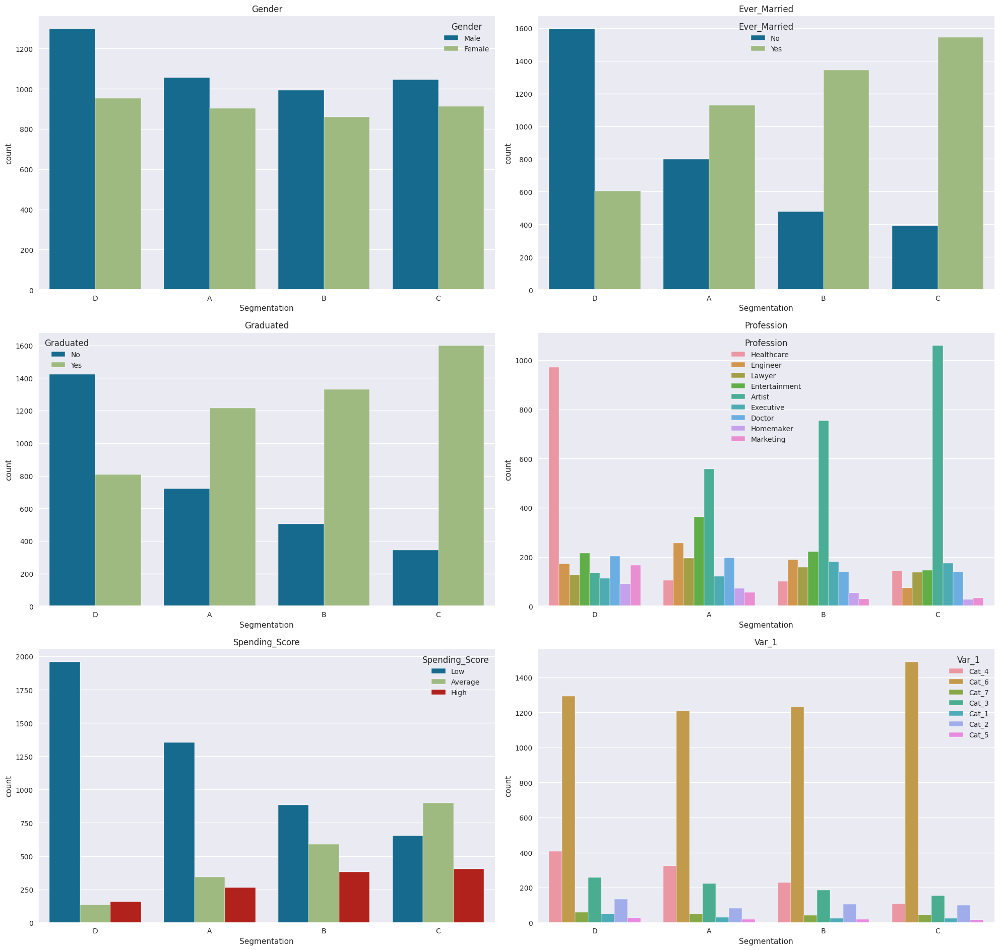

In [ ]:
# Mediante el diagrama de barras vemos un resumen visual de la distribución de cada
# una de las variables independientes con respecto a la dependiente

fig = plt.figure(figsize=(20,50))
i=1

for var_num in list_category[0:6]:
  ax = fig.add_subplot(8, 2, i)
  sns.countplot(x="Segmentation", hue = var_num, data=data_train)
  plt.title(var_num)
  i+=1
fig.tight_layout()

En el grafico anterior, se puede detallar como se ve distribuido el segmento del cliente, con respecto a las variables categóricas.

Con respecto al género de los clientes, se puede detallar que está igualmente distribuido en todos los segmentos y que en su mayoría son hombres.
Para el estado civil, se puede notar que los clientes del segmento D, es su gran mayoría no están casados y para los demás segmentos, los clientes se encuentran casados.

Para la variable de si el cliente se ha graduado o no, se puede observar que los clientes ubicados en el segmento D, en su mayor proporción no se ha graduado y para los clientes ubicados en los otros segmentos la gran mayoría están graduados.

En el tipo de profesión del cliente, a grandes rasgos se puede ver que en el segmento D están ubicados en una gran proporción los clientes del cuidado de la salud y en los demás segmentos están ubicados aquellos clientes que tiene como profesión ser artistas, seguidos por los abogados y los ingenieros.

Ahora con la puntuación de gasto del cliente, se puede detallar que los segmentos D, A y B se encuentran los clientes con un puntaje de gasto bajo y en el segmento C, se encuentran los clientes con un puntaje de gasto promedio.

Y por último en la variable 1 la cual es una categoría anónima del cliente, se puede observar que en todos los segmentos los clientes pertenecen en una mayor proporción a la categoría 6.

### * Gender

In [ ]:
table_freq = data_train.pipe(frequency,column ='Gender')
table_freq.style.format({'Freq. Rel.' : "{:.2%}"})

col_0,Gender,Freq. Abs.,Freq. Rel.
0,Male,4394,54.76%
1,Female,3630,45.24%


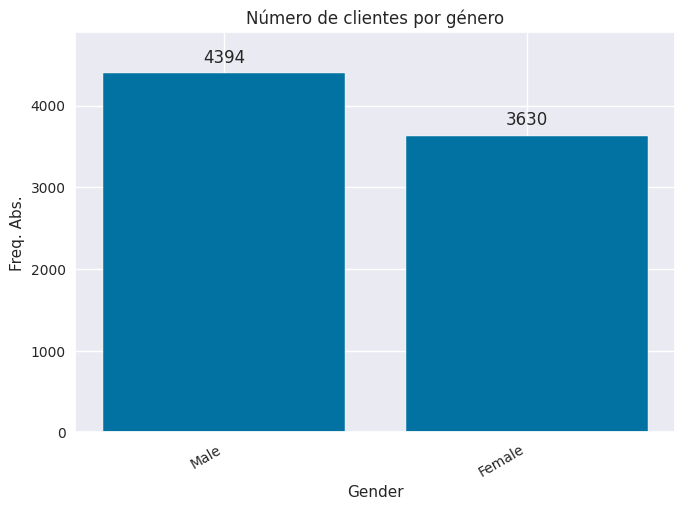

In [ ]:
plot_frequency(table_freq,'Gender',"Número de clientes por género")

El 54.76% de los clientes son hombres con 4394 instancias.

### * Ever_Married

In [ ]:
table_freq = data_train.pipe(frequency,column ='Ever_Married')
table_freq.style.format({'Freq. Rel.' : "{:.2%}"})

col_0,Ever_Married,Freq. Abs.,Freq. Rel.
0,Yes,4621,58.61%
1,No,3263,41.39%


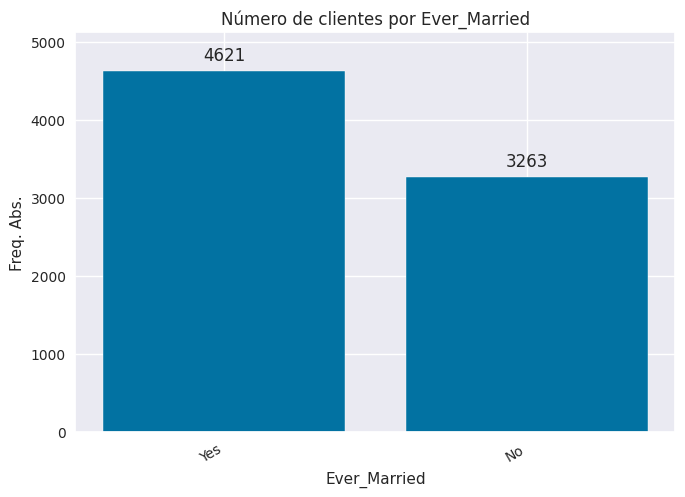

In [ ]:
plot_frequency(table_freq,'Ever_Married',"Número de clientes por Ever_Married")

El 58.61% de los clientes se han casado.

### * Graduated

In [ ]:
table_freq = data_train.pipe(frequency,column ='Graduated')
print(table_freq.style.format({'Freq. Rel.' : "{:.2%}"}))

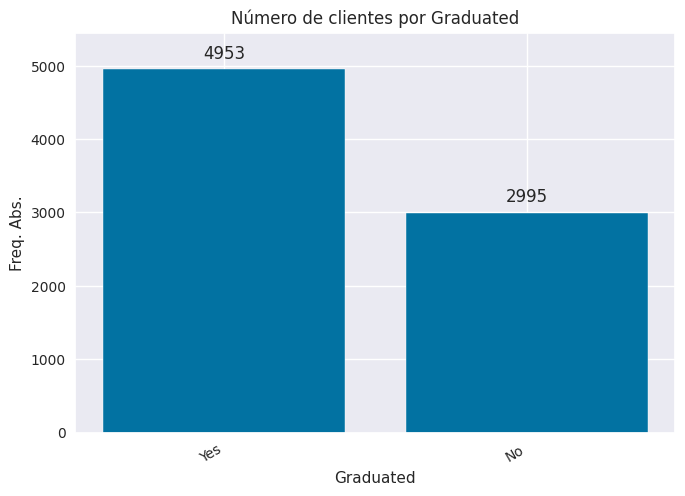

In [ ]:
plot_frequency(table_freq,'Graduated',"Número de clientes por Graduated")

El 62.32% de los clientes se han graduado.

### * Profession

In [ ]:
table_freq = data_train.pipe(frequency,column ='Profession')
table_freq.style.format({'Freq. Rel.' : "{:.2%}"})

col_0,Profession,Freq. Abs.,Freq. Rel.
0,Artist,2510,31.77%
1,Healthcare,1323,16.75%
2,Entertainment,947,11.99%
3,Engineer,694,8.78%
4,Doctor,683,8.65%
5,Lawyer,619,7.84%
6,Executive,591,7.48%
7,Marketing,288,3.65%
8,Homemaker,245,3.10%


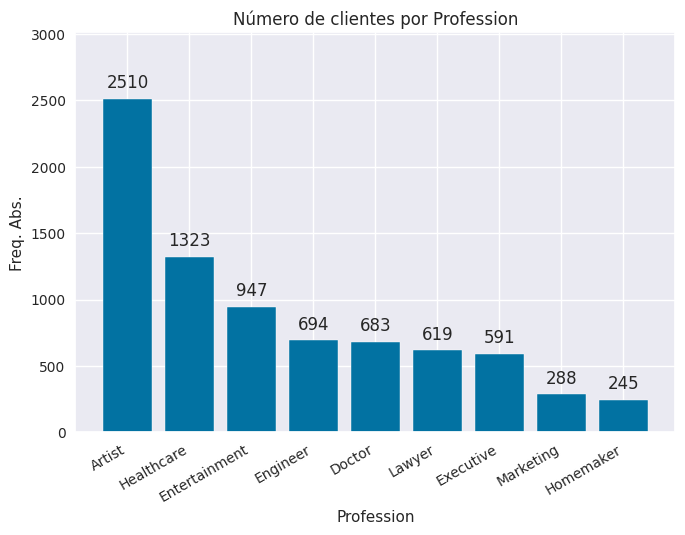

In [ ]:
plot_frequency(table_freq,'Profession',"Número de clientes por Profession")

El 31.77% de los clientes son artistas. Las profesiones con menos registros son Marketing y Homemaker con 3.65% y 3.10% instancias respectivamente.

### * Spending_Score

In [ ]:
table_freq = data_train.pipe(frequency,column ='Spending_Score')
table_freq.style.format({'Freq. Rel.' : "{:.2%}"})

col_0,Spending_Score,Freq. Abs.,Freq. Rel.
0,Low,4852,60.47%
1,Average,1967,24.51%
2,High,1205,15.02%


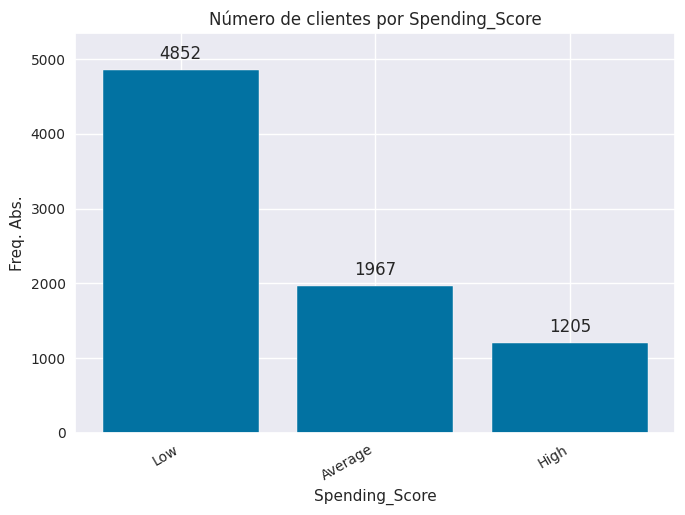

In [ ]:
plot_frequency(table_freq,'Spending_Score',"Número de clientes por Spending_Score")

La distribución de las categorías en la columna 'Spending_Score' está desequilibrada, ya que la categoría "Low" domina significativamente en comparación con las demás.

### * Var_1

In [ ]:
table_freq = data_train.pipe(frequency,column ='Var_1')
table_freq.style.format({'Freq. Rel.' : "{:.2%}"})

col_0,Var_1,Freq. Abs.,Freq. Rel.
0,Cat_6,5221,65.69%
1,Cat_4,1070,13.46%
2,Cat_3,820,10.32%
3,Cat_2,421,5.30%
4,Cat_7,200,2.52%
5,Cat_1,133,1.67%
6,Cat_5,83,1.04%


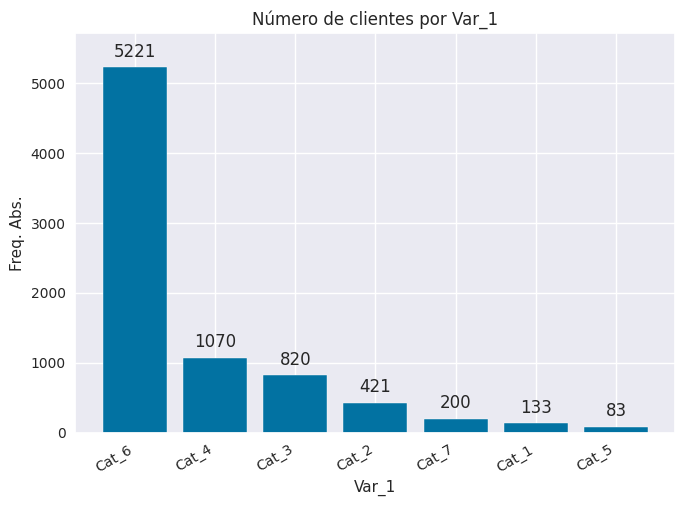

In [ ]:
plot_frequency(table_freq,'Var_1',"Número de clientes por Var_1")

Aproximadamente el 65.69% de los clientes pertenecen a la categoria CAT_6 con 5221 registros.
"Cat_5" y "Cat_1" son las categorías menos frecuentes, contribuyendo con un 1.04% y 1.67% respectivamente.
La variable 'Var_1' está fuertemente sesgada hacia la categoría "Cat_6", que constituye la mayoría de las observaciones.



### *   Segmentation



In [ ]:
table_freq = data_train.pipe(frequency,column ='Segmentation')
table_freq.style.format({'Freq. Rel.' : "{:.2%}"})

col_0,Segmentation,Freq. Abs.,Freq. Rel.
0,D,2250,28.04%
1,A,1961,24.44%
2,C,1959,24.41%
3,B,1854,23.11%


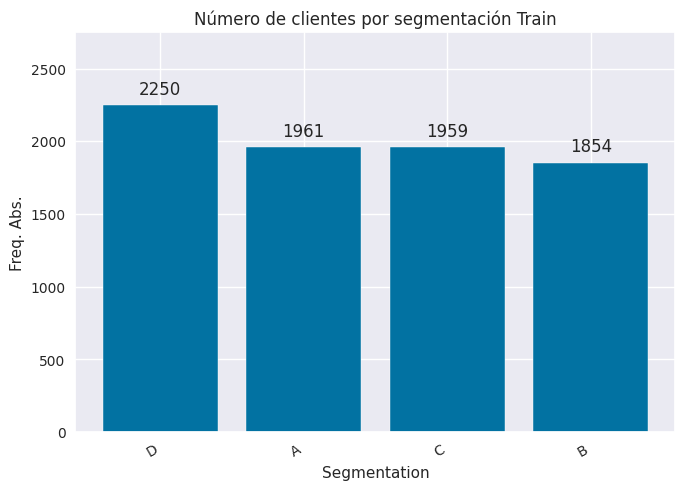

In [ ]:
plot_frequency(table_freq,'Segmentation',"Número de clientes por segmentación Train")

El segmento "D" es el más frecuente, representando aproximadamente el 28.04% del total de instancias.

## Limpieza de datos

In [ ]:
# Se optó por eliminar la columna 'ID' debido a que contiene 8068 valores distintos, lo que la convierte en una columna
# con información no relevante para los modelos.

print(data_train['ID'].nunique())
df_mode = data_train.copy()
df_mode.drop('ID', axis=1, inplace=True)

8024


In [ ]:
df_mode.head()

,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,Male,No,22,No,Healthcare,1.0,Low,4.0,Cat_4,D
1,Female,Yes,38,Yes,Engineer,NaN,Average,3.0,Cat_4,A
2,Female,Yes,67,Yes,Engineer,1.0,Low,1.0,Cat_6,B
3,Male,Yes,67,Yes,Lawyer,0.0,High,2.0,Cat_6,B
4,Female,Yes,40,Yes,Entertainment,NaN,High,6.0,Cat_6,A


**Imputación de datos faltantes**

In [ ]:
# Revisión de datos faltantes

for var in df_mode.columns:
  cant = df_mode[var].isna().sum()
  print(f"Existen {cant} datos faltantes en {var}")

Existen 0 datos faltantes en Gender
Existen 140 datos faltantes en Ever_Married
Existen 0 datos faltantes en Age
Existen 76 datos faltantes en Graduated
Existen 124 datos faltantes en Profession
Existen 825 datos faltantes en Work_Experience
Existen 0 datos faltantes en Spending_Score
Existen 335 datos faltantes en Family_Size
Existen 76 datos faltantes en Var_1
Existen 0 datos faltantes en Segmentation


**Imputación en las variables categóricas**



*   Graduated, Profession, Var_1, Ever_Married

In [ ]:
# Primera aproximación: utilizar la moda para imputar los datos faltantes (variables categóricas)
# Para cada columna, si existe un valor faltante se completa con la moda

# Seleccionar las columnas de tipo objeto que tienen valores faltantes
cols_to_mode = [ 'Graduated', 'Profession', 'Var_1','Ever_Married']

# Aplicar la moda a las columnas seleccionadas

for col in cols_to_mode:
    mode_val = data_train[col].mode()[0]  # Calcular la moda (podría haber múltiples modas)
    df_mode[col] = df_mode[col].fillna(mode_val)

print(df_mode.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8024 entries, 0 to 8023
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Gender           8024 non-null   object 
 1   Ever_Married     8024 non-null   object 
 2   Age              8024 non-null   int64  
 3   Graduated        8024 non-null   object 
 4   Profession       8024 non-null   object 
 5   Work_Experience  7199 non-null   float64
 6   Spending_Score   8024 non-null   object 
 7   Family_Size      7689 non-null   float64
 8   Var_1            8024 non-null   object 
 9   Segmentation     8024 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 627.0+ KB
None


**Imputación en las variables númericas**

*   Variable Family size

En este caso utilizaremos regresión lineal para completar los datos que hacen falta en la variable Family_Size.



In [ ]:
df_mode.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8024 entries, 0 to 8023
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Gender           8024 non-null   object 
 1   Ever_Married     8024 non-null   object 
 2   Age              8024 non-null   int64  
 3   Graduated        8024 non-null   object 
 4   Profession       8024 non-null   object 
 5   Work_Experience  7199 non-null   float64
 6   Spending_Score   8024 non-null   object 
 7   Family_Size      7689 non-null   float64
 8   Var_1            8024 non-null   object 
 9   Segmentation     8024 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 627.0+ KB


In [ ]:
df = df_mode.copy()
null_indices = df['Family_Size'].isnull()

columns_of_interest = ['Gender', 'Ever_Married', 'Age', 'Spending_Score','Family_Size']
df_copy = df_mode[columns_of_interest].copy()

# Aplicar Label Encoding a las columnas 'Gender' y 'Spending_Score'
encoder = LabelEncoder()
df_copy['Gender'] = encoder.fit_transform(df_copy['Gender'])
df_copy['Ever_Married'] = encoder.fit_transform(df_copy['Ever_Married'])
df_copy['Spending_Score'] = encoder.fit_transform(df_copy['Spending_Score'])
# Separar las columnas en características (X) y variable objetivo (y)
X = df_copy.drop('Family_Size', axis=1)
y = df_copy['Family_Size']

# Separar los datos en conocidos y desconocidos
X_known = X[~y.isnull()]
X_unknown = X[y.isnull()]
y_known = y[~y.isnull()]

# Inicializar y entrenar el modelo de regresión lineal
model = LinearRegression()
model.fit(X_known, y_known)

# Predecir los valores faltantes
predicted_values = model.predict(X_unknown)

# Llenar los valores faltantes en la copia del DataFrame
df_copy.loc[y.isnull(), 'Family_Size'] = predicted_values.round()
### PARA SABER EN CATEGORIAS ASIGNO EL REGISTRO REVISAMOS UNA DIFERENCIA
# Seleccionar las columnas relevantes
columns_of_interest = ['Family_Size']
df_subset = df_mode[columns_of_interest]
df_copy_subset = df_copy[columns_of_interest]

# Calcular los conteos de valores
value_counts_original = df_subset['Family_Size'].value_counts().sort_index()
value_counts_copy = df_copy_subset['Family_Size'].value_counts().sort_index()

# Crear un DataFrame con los conteos
df_comparison_counts = pd.DataFrame({
    'Original': value_counts_original,
    'Imputados': value_counts_copy
})
# Calcular las diferencias
df_comparison_counts['Diferencia'] = df_comparison_counts['Imputados'] - df_comparison_counts['Original']

# Mostrar el DataFrame con el conteo y las diferencias
print(df_comparison_counts,f'\nDiferencia: ',df_comparison_counts.Diferencia.sum())

# Llenar los valores faltantes en el DataFrame original ('train') con los valores imputados de la copia ('df_copy')
df_mode.loc[null_indices, 'Family_Size'] = df_copy.loc[null_indices, 'Family_Size']

     Original  Imputados  Diferencia
1.0      1453       1469          16
2.0      2390       2482          92
3.0      1497       1714         217
4.0      1379       1389          10
5.0       612        612           0
6.0       212        212           0
7.0        96         96           0
8.0        50         50           0 
Diferencia:  335


In [ ]:
# Construimos una función que nos permite obtener el X y el Y para el dataframe

def obtain_X_y(df):
    return df.drop(columns=['Segmentation']), df[['Segmentation']]

**Transformación de variables categóricas**

Haremos esta transformación para poder imputar con KNN los datos faltantes en la variable que nos hace falta que es Work_Experience.

In [ ]:
df_mode.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8024 entries, 0 to 8023
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Gender           8024 non-null   object 
 1   Ever_Married     8024 non-null   object 
 2   Age              8024 non-null   int64  
 3   Graduated        8024 non-null   object 
 4   Profession       8024 non-null   object 
 5   Work_Experience  7199 non-null   float64
 6   Spending_Score   8024 non-null   object 
 7   Family_Size      8024 non-null   float64
 8   Var_1            8024 non-null   object 
 9   Segmentation     8024 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 627.0+ KB


In [ ]:
# Utilizamos one-hot encoding para los atributos Gender, Ever_Married, Graduated, Profession, Spending_Score, Var_1

for var_num in df_mode.select_dtypes(include=['object']).columns[0:6]:
    df_mode = pd.get_dummies(df_mode, columns=[var_num])

In [ ]:
# Label Encoder para Segmentation

label_encoder = LabelEncoder()
df_mode['Segmentation'] = label_encoder.fit_transform(df_mode['Segmentation'])

In [ ]:
scaler = df_mode.copy()
scaler.drop("Segmentation",axis=1,inplace=True)
columns = scaler.columns
scaler = StandardScaler().fit_transform(scaler)
df_scaler = pd.DataFrame(scaler,columns=columns)
df_scaler['Segmentation'] = df_mode['Segmentation']

In [ ]:
# Utilizamos KNNImputer para completar los datos faltantes
# Para optimizar debemos encontrar el mejor k
# Accuracy = (TP + TN) / (TP + FP + FN + TN)
# Kappa = (OA - AC) / (1 - AC) (concordancia entre las predicciones y las clases reales)
# Sustrae el efecto de concordancia por suerte (AC) del valor del accuracy (concordancia
# observada - OA)
# OA: accuracy
# AC: P(correct) + P(incorrect)


def optimize_k(df):
    metrics = []
    for k in range(1, 20, 2):
      imputer = KNNImputer(n_neighbors=k)
      imputed = imputer.fit_transform(df)
      df_imputed = pd.DataFrame(imputed, columns=df.columns)
      X,y = obtain_X_y(df_imputed)
      X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1234)

      model = RandomForestClassifier(random_state=1234)
      model.fit(X_train, y_train)
      preds = model.predict(X_test)
#####################################################################
      # y_preds_original = label_encoder.inverse_transform(preds)
######################################################################
      metrics.append({'K': k, 'Accuracy': accuracy_score(y_test, preds), 'Kappa': cohen_kappa_score(y_test,preds)})

    return metrics

metrics = optimize_k(df_scaler)
print(metrics)

[{'K': 1, 'Accuracy': 0.48588039867109634, 'Kappa': 0.3126442076788868}, {'K': 3, 'Accuracy': 0.48131229235880396, 'Kappa': 0.30670501206400114}, {'K': 5, 'Accuracy': 0.4850498338870432, 'Kappa': 0.31144582494620665}, {'K': 7, 'Accuracy': 0.48795681063122925, 'Kappa': 0.3155078734493786}, {'K': 9, 'Accuracy': 0.48131229235880396, 'Kappa': 0.30649319265779185}, {'K': 11, 'Accuracy': 0.4788205980066445, 'Kappa': 0.3030821487385654}, {'K': 13, 'Accuracy': 0.4792358803986711, 'Kappa': 0.30379496430246267}, {'K': 15, 'Accuracy': 0.4867109634551495, 'Kappa': 0.31373533268510345}, {'K': 17, 'Accuracy': 0.48421926910299, 'Kappa': 0.3105015662056463}, {'K': 19, 'Accuracy': 0.48214285714285715, 'Kappa': 0.3076163045811642}]


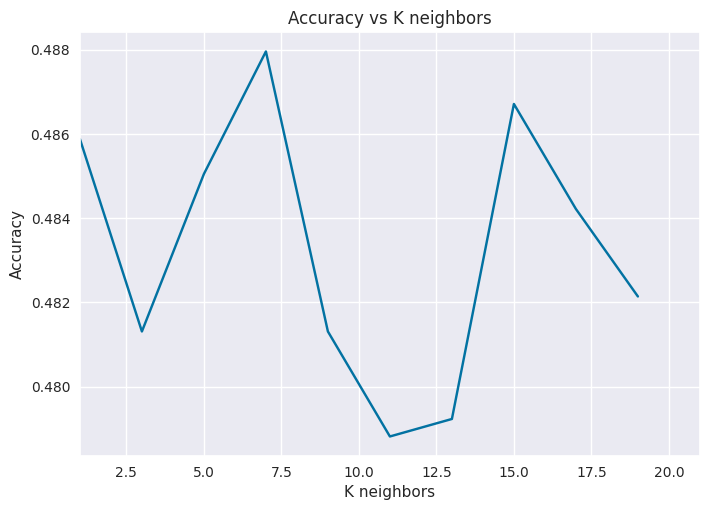

In [ ]:
# Gráfica para encontrar el mejor k teniendo en cuenta el Accuracy

ax = sns.lineplot(x=[metrics[i]['K'] for i in range(len(metrics))],y=[metrics[i]['Accuracy'] for i in range(len(metrics))])
ax.set(title='Accuracy vs K neighbors',xlim=(1,21),xlabel='K neighbors', ylabel='Accuracy')
plt.show()

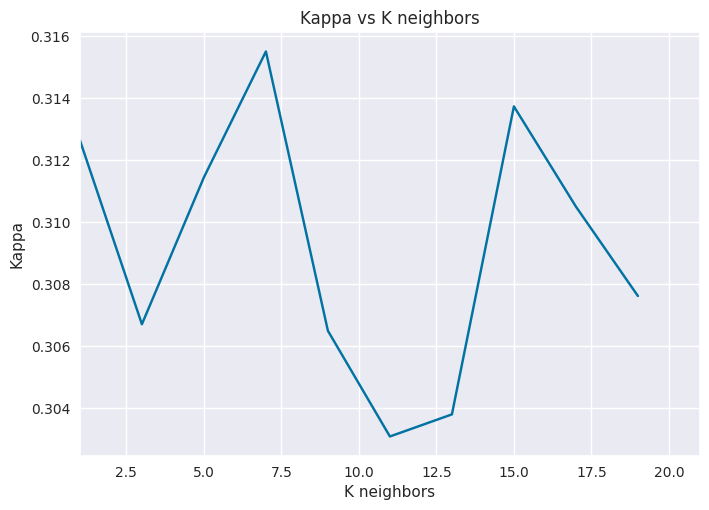

In [ ]:
# Gráfica para encontrar el mejor k teniendo en cuenta el Kappa

ax = sns.lineplot(x=[metrics[i]['K'] for i in range(len(metrics))],y=[metrics[i]['Kappa'] for i in range(len(metrics))])
ax.set(title='Kappa vs K neighbors',xlim=(1,21),xlabel='K neighbors', ylabel='Kappa')
plt.show()

In [ ]:
# Utilizando kappa y accuracy, el mejor valor es k = 7

k_values = [(metrics[i]['K'],metrics[i]['Kappa'],metrics[i]['Accuracy']) for i in range(len(metrics))]
print("Con accuracy",sorted(k_values,key=lambda x:x[2],reverse=True))
print("Con kappa",sorted(k_values,key=lambda x:x[1],reverse=True))

Con accuracy [(7, 0.3155078734493786, 0.48795681063122925), (15, 0.31373533268510345, 0.4867109634551495), (1, 0.3126442076788868, 0.48588039867109634), (5, 0.31144582494620665, 0.4850498338870432), (17, 0.3105015662056463, 0.48421926910299), (19, 0.3076163045811642, 0.48214285714285715), (3, 0.30670501206400114, 0.48131229235880396), (9, 0.30649319265779185, 0.48131229235880396), (13, 0.30379496430246267, 0.4792358803986711), (11, 0.3030821487385654, 0.4788205980066445)]
Con kappa [(7, 0.3155078734493786, 0.48795681063122925), (15, 0.31373533268510345, 0.4867109634551495), (1, 0.3126442076788868, 0.48588039867109634), (5, 0.31144582494620665, 0.4850498338870432), (17, 0.3105015662056463, 0.48421926910299), (19, 0.3076163045811642, 0.48214285714285715), (3, 0.30670501206400114, 0.48131229235880396), (9, 0.30649319265779185, 0.48131229235880396), (13, 0.30379496430246267, 0.4792358803986711), (11, 0.3030821487385654, 0.4788205980066445)]


Como se puede detallar en las gráficas anteriores, el valor de K para el cual tanto el acurracy como el kappa presentan el valor más alto es 7, es por eso que para imputar los datos faltantes en la variable Work_Experience tomaremos los 7 vecinos más cercanos.

In [ ]:
# Luego de reconocer a k=7 como el mejor número de vecinos más cercanos,
# podemos imputar nuestros datos faltantes

imputer = KNNImputer(n_neighbors=7)
imputed = imputer.fit_transform(df_mode)
df_imputed = pd.DataFrame(imputed, columns=df_mode.columns)
df_imputed['Segmentation'] = df_imputed['Segmentation'].astype(float).astype(int)
df_imputed['Segmentation'] = label_encoder.inverse_transform(df_imputed['Segmentation'])
X_train,y_train = obtain_X_y(df_imputed)

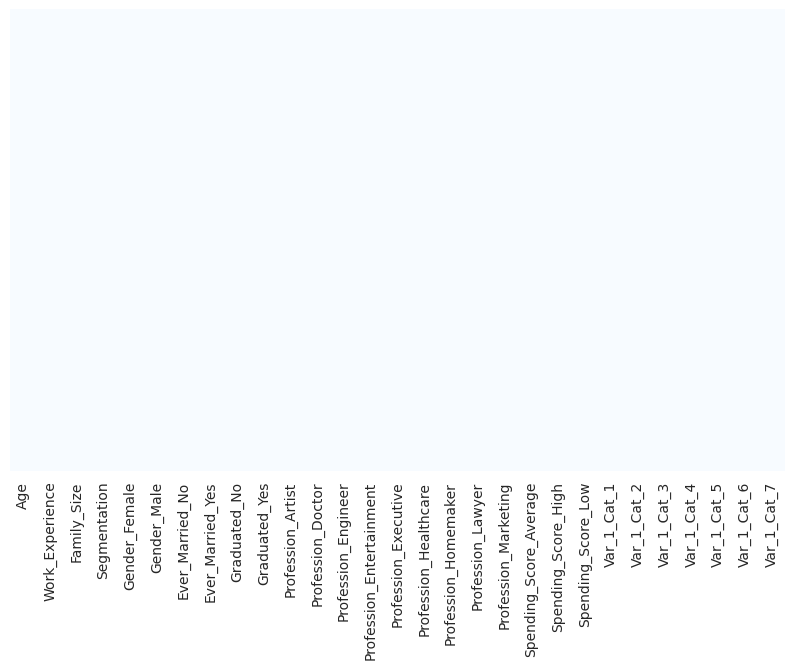

In [ ]:
# Revisamos nuevamente los datos faltantes con el mapa de calor
# Nos damos cuenta que efectivamente no existen datos faltantes

plt.figure(figsize=(10,6))
sns.heatmap(df_imputed.isnull(), yticklabels = False, cbar = False, cmap="Blues")
plt.show()

In [ ]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8024 entries, 0 to 8023
Data columns (total 29 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       8024 non-null   float64
 1   Work_Experience           8024 non-null   float64
 2   Family_Size               8024 non-null   float64
 3   Segmentation              8024 non-null   object 
 4   Gender_Female             8024 non-null   float64
 5   Gender_Male               8024 non-null   float64
 6   Ever_Married_No           8024 non-null   float64
 7   Ever_Married_Yes          8024 non-null   float64
 8   Graduated_No              8024 non-null   float64
 9   Graduated_Yes             8024 non-null   float64
 10  Profession_Artist         8024 non-null   float64
 11  Profession_Doctor         8024 non-null   float64
 12  Profession_Engineer       8024 non-null   float64
 13  Profession_Entertainment  8024 non-null   float64
 14  Professi

**Matriz de correlación**

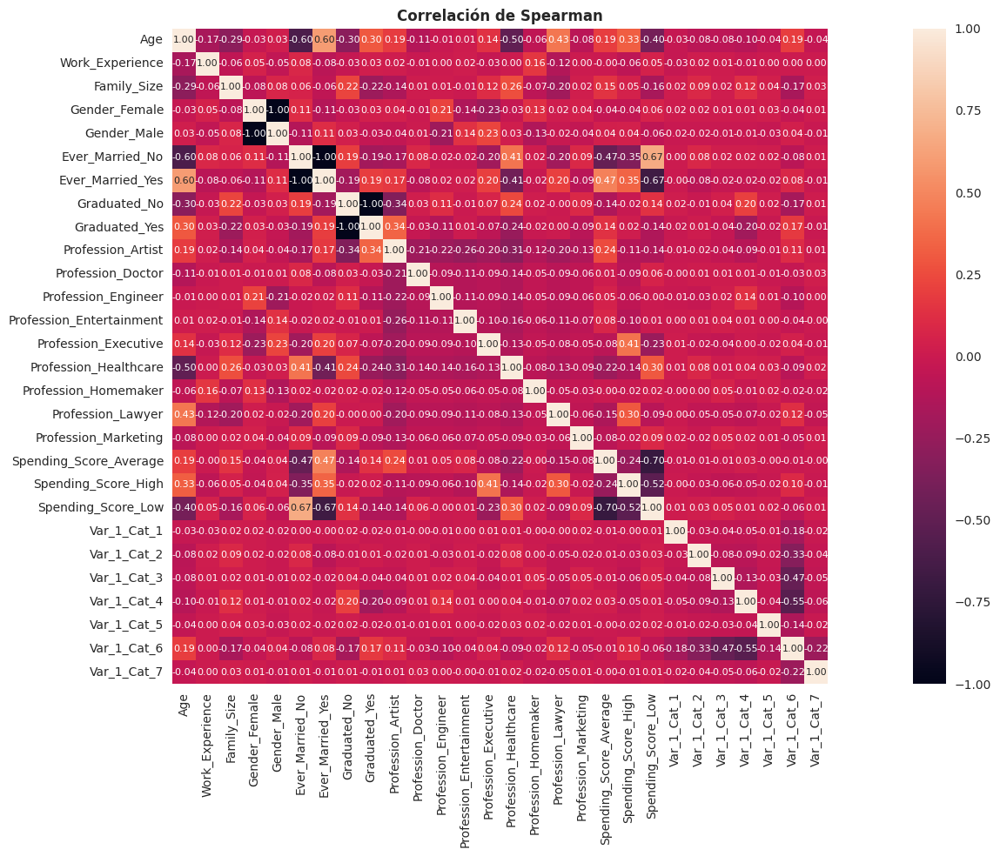

In [ ]:
# Grafico de correlaciones de Spearman

corr_spearman = df_imputed.corr(method='spearman')

fig , ax = plt.subplots(figsize = (20,10))
sns.heatmap(corr_spearman , annot = True , annot_kws = {'size':8},square=True, fmt='.2f')
plt.title('Correlación de Spearman', fontweight ='bold')
plt.tight_layout()
plt.show()

Después de realizar toda la limpieza calculamos de nuevo la correlación entre las variables para ver si existen unas mas fuertes que cuando no se tenían los datos tan desagregados. Podemos ver una relación alta entre la edad y si el cliente esta casado o no, entre la puntuación de gasto bajo y si esta casado o no el cliente; para las demás variables las correlaciones son bajas.

**Imputación datos test**

Para la base de datos Test se aplican las mismas transformaciones y limpieza que con la data de Train para si poder evaluar correctamente nuestro modelo.

In [ ]:
# Revisión de datos faltantes

for var in data_test.columns:
  cant = data_test[var].isna().sum()
  print(f"Existen {cant} datos faltantes en {var}")

Existen 0 datos faltantes en ID
Existen 0 datos faltantes en Gender
Existen 50 datos faltantes en Ever_Married
Existen 0 datos faltantes en Age
Existen 24 datos faltantes en Graduated
Existen 38 datos faltantes en Profession
Existen 269 datos faltantes en Work_Experience
Existen 0 datos faltantes en Spending_Score
Existen 113 datos faltantes en Family_Size
Existen 32 datos faltantes en Var_1
Existen 0 datos faltantes en Segmentation


In [ ]:
# Se optó por eliminar la columna 'ID' debido a que contiene 2627 valores distintos, lo que la convierte en una columna
# con información no relevante para los modelos.

print(data_test['ID'].nunique())
df_test_clean = data_test.copy()
df_test_clean.drop('ID', axis=1, inplace=True)

2627


In [ ]:
df_test_clean.head()

,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,Female,Yes,36,Yes,Engineer,0.0,Low,1.0,Cat_6,B
1,Male,Yes,37,Yes,Healthcare,8.0,Average,4.0,Cat_6,A
2,Female,Yes,69,No,NaN,0.0,Low,1.0,Cat_6,A
3,Male,Yes,59,No,Executive,11.0,High,2.0,Cat_6,B
4,Female,No,19,No,Marketing,NaN,Low,4.0,Cat_6,A


**Imputación en las variables categóricas**



*   Graduated, Profession, Var_1, Ever_Married

In [ ]:
# Primera aproximación: utilizar la moda para imputar los datos faltantes (variables categóricas)
# Para cada columna, si existe un valor faltante se completa con la moda

# Seleccionar las columnas de tipo objeto que tienen valores faltantes
cols_to_mode = [ 'Graduated', 'Profession', 'Var_1','Ever_Married']

# Aplicar la moda a las columnas seleccionadas

for col in cols_to_mode:
    mode_val = data_test[col].mode()[0]  # Calcular la moda (podría haber múltiples modas)
    df_test_clean[col] = df_test_clean[col].fillna(mode_val)

print(df_test_clean.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2627 entries, 0 to 2626
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Gender           2627 non-null   object 
 1   Ever_Married     2627 non-null   object 
 2   Age              2627 non-null   int64  
 3   Graduated        2627 non-null   object 
 4   Profession       2627 non-null   object 
 5   Work_Experience  2358 non-null   float64
 6   Spending_Score   2627 non-null   object 
 7   Family_Size      2514 non-null   float64
 8   Var_1            2627 non-null   object 
 9   Segmentation     2627 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 205.4+ KB
None


**Imputación en las variables númericas**



*   Variable Family size



In [ ]:
df_test_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2627 entries, 0 to 2626
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Gender           2627 non-null   object 
 1   Ever_Married     2627 non-null   object 
 2   Age              2627 non-null   int64  
 3   Graduated        2627 non-null   object 
 4   Profession       2627 non-null   object 
 5   Work_Experience  2358 non-null   float64
 6   Spending_Score   2627 non-null   object 
 7   Family_Size      2514 non-null   float64
 8   Var_1            2627 non-null   object 
 9   Segmentation     2627 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 205.4+ KB


In [ ]:
df = df_test_clean.copy()
null_indices = df['Family_Size'].isnull()

columns_of_interest = ['Gender', 'Ever_Married', 'Age', 'Spending_Score','Family_Size']
df_copy = df_test_clean[columns_of_interest].copy()

# Aplicar Label Encoding a las columnas 'Gender' y 'Spending_Score'
encoder = LabelEncoder()
df_copy['Gender'] = encoder.fit_transform(df_copy['Gender'])
df_copy['Ever_Married'] = encoder.fit_transform(df_copy['Ever_Married'])
df_copy['Spending_Score'] = encoder.fit_transform(df_copy['Spending_Score'])
# Separar las columnas en características (X) y variable objetivo (y)
X = df_copy.drop('Family_Size', axis=1)
y = df_copy['Family_Size']

# Separar los datos en conocidos y desconocidos
X_known = X[~y.isnull()]
X_unknown = X[y.isnull()]
y_known = y[~y.isnull()]

# Inicializar y entrenar el modelo de regresión lineal
model = LinearRegression()
model.fit(X_known, y_known)

# Predecir los valores faltantes
predicted_values = model.predict(X_unknown)

# Llenar los valores faltantes en la copia del DataFrame
df_copy.loc[y.isnull(), 'Family_Size'] = predicted_values.round()
### PARA SABER EN CATEGORIAS ASIGNO EL REGISTRO REVISAMOS UNA DIFERENCIA
# Seleccionar las columnas relevantes
columns_of_interest = ['Family_Size']
df_subset = df_test_clean[columns_of_interest]
df_copy_subset = df_copy[columns_of_interest]

# Calcular los conteos de valores
value_counts_original = df_subset['Family_Size'].value_counts().sort_index()
value_counts_copy = df_copy_subset['Family_Size'].value_counts().sort_index()

# Crear un DataFrame con los conteos
df_comparison_counts = pd.DataFrame({
    'Original': value_counts_original,
    'Imputados': value_counts_copy
})
# Calcular las diferencias
df_comparison_counts['Diferencia'] = df_comparison_counts['Imputados'] - df_comparison_counts['Original']

# Mostrar el DataFrame con el conteo y las diferencias
print(df_comparison_counts,f'\nDiferencia: ',df_comparison_counts.Diferencia.sum())

# Llenar los valores faltantes en el DataFrame original ('train') con los valores imputados de la copia ('df_copy')
df_test_clean.loc[null_indices, 'Family_Size'] = df_copy.loc[null_indices, 'Family_Size']

     Original  Imputados  Diferencia
1.0       512        515           3
2.0       768        800          32
3.0       455        529          74
4.0       444        448           4
5.0       200        200           0
6.0        78         78           0
7.0        26         26           0
8.0        15         15           0
9.0        16         16           0 
Diferencia:  113


**Transformación de variables categóricas**

In [ ]:
df_test_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2627 entries, 0 to 2626
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Gender           2627 non-null   object 
 1   Ever_Married     2627 non-null   object 
 2   Age              2627 non-null   int64  
 3   Graduated        2627 non-null   object 
 4   Profession       2627 non-null   object 
 5   Work_Experience  2358 non-null   float64
 6   Spending_Score   2627 non-null   object 
 7   Family_Size      2627 non-null   float64
 8   Var_1            2627 non-null   object 
 9   Segmentation     2627 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 205.4+ KB


In [ ]:
# Utilizamos one-hot encoding para los atributos Gender, Ever_Married, Graduated, Profession, Spending_Score, Var_1

for var_num in df_test_clean.select_dtypes(include=['object']).columns[0:6]:
    df_test_clean = pd.get_dummies(df_test_clean, columns=[var_num])

In [ ]:
# Label Encoder para Segmentation

label_encoder = LabelEncoder()
df_test_clean['Segmentation'] = label_encoder.fit_transform(df_test_clean['Segmentation'])

In [ ]:
# Luego de reconocer a k=7 como el mejor número de vecinos más cercanos,
# podemos imputar nuestros datos faltantes

imputer = KNNImputer(n_neighbors=7)
imputed = imputer.fit_transform(df_test_clean)
df_imputed_test = pd.DataFrame(imputed, columns=df_test_clean.columns)
df_imputed_test['Segmentation'] = df_imputed_test['Segmentation'].astype(float).astype(int)
df_imputed_test['Segmentation'] = label_encoder.inverse_transform(df_imputed_test['Segmentation'])
X_test,y_test = obtain_X_y(df_imputed_test)

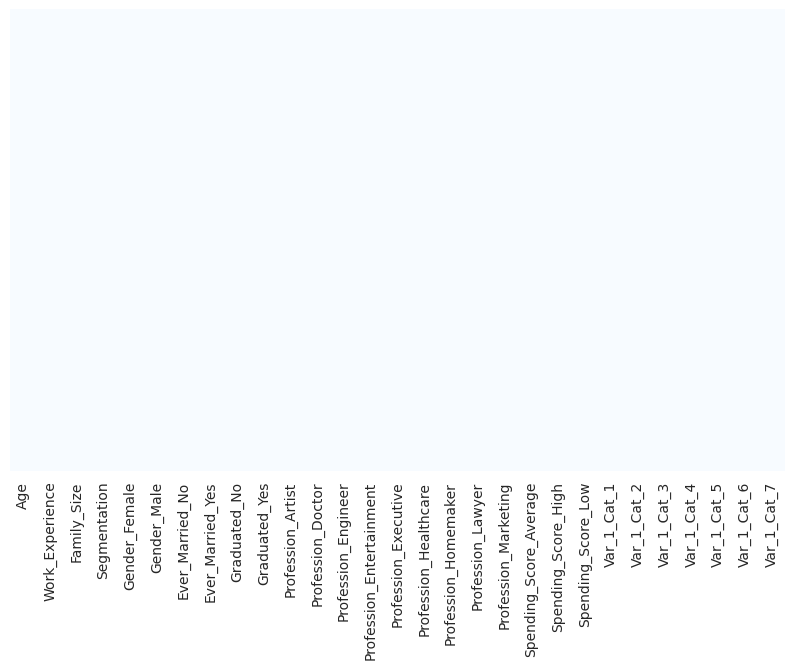

In [ ]:
# Revisamos nuevamente los datos faltantes con el mapa de calor
# Nos damos cuenta que efectivamente no existen datos faltantes

plt.figure(figsize=(10,6))
sns.heatmap(df_imputed_test.isnull(), yticklabels = False, cbar = False, cmap="Blues")
plt.show()

In [ ]:
df_imputed_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2627 entries, 0 to 2626
Data columns (total 29 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       2627 non-null   float64
 1   Work_Experience           2627 non-null   float64
 2   Family_Size               2627 non-null   float64
 3   Segmentation              2627 non-null   object 
 4   Gender_Female             2627 non-null   float64
 5   Gender_Male               2627 non-null   float64
 6   Ever_Married_No           2627 non-null   float64
 7   Ever_Married_Yes          2627 non-null   float64
 8   Graduated_No              2627 non-null   float64
 9   Graduated_Yes             2627 non-null   float64
 10  Profession_Artist         2627 non-null   float64
 11  Profession_Doctor         2627 non-null   float64
 12  Profession_Engineer       2627 non-null   float64
 13  Profession_Entertainment  2627 non-null   float64
 14  Professi

# 2. Modelos predictivos

* Protocolos de evaluación

In [ ]:
# Utilizamos el holdout con un 30% para la validación y 70% para el entrenamiento

X_train_split, X_test_split, y_train_split, y_test_split = train_test_split(X_train,y_train,random_state=12345,test_size=0.3)
print(X_train_split.shape)
print(X_test_split.shape)
print(y_train_split.shape)
print(y_test_split.shape)

(5616, 28)
(2408, 28)
(5616, 1)
(2408, 1)


* Métricas de evaluación

In [ ]:
# Implementamos una función que nos permita calcular las métricas de regresión para el conjunto
# de entrenamiento y de prueba
# Accuracy, Kappa, Precision, Recall
# Nos retorna el modelo entrenado y un diccionario con las principales métricas sobre el conjunto de
# entrenamiento y el de prueba
# Accuracy = (TP + TN) / (TP + FP + FN + TN)
# Kappa = (OA - AC) / (1 - AC)
# Precision = TP / (TP + FP) (valor positivo predicho, la proporción correcta de
# identificaciones positivas)
# Recall = TP / (TP + FN) (la proporción de positivos que fueron identificados correctamente)

def classification_metrics(model,X_train,X_test,y_train,y_test):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    acc_train = accuracy_score(y_train, y_pred_train)
    acc_test = accuracy_score(y_test, y_pred_test)
    kappa_train = cohen_kappa_score(y_train, y_pred_train)
    kappa_test = cohen_kappa_score(y_test, y_pred_test)
    prec_train = precision_score(y_train, y_pred_train,average=None)
    prec_test = precision_score(y_test, y_pred_test,average=None)
    recall_train = recall_score(y_train, y_pred_train,average=None)
    recall_test = recall_score(y_test, y_pred_test,average=None)
    metrics = {"Training Accuracy": acc_train,
               "Test Accuracy": acc_test,
               "Training Kappa": kappa_train,
               "Test Kappa": kappa_test,
               "Training Precision": prec_train,
               "Test Precision": prec_test,
               "Training recall": recall_train,
               "Test recall": recall_test
               }
    for item in metrics.items():
        print(item[0],"=",item[1])
    return model,metrics

def kappa_metrics(model,X_train,X_test,y_train,y_test):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    kappa_train = cohen_kappa_score(y_train, y_pred_train)
    kappa_test = cohen_kappa_score(y_test, y_pred_test)
    return kappa_train, kappa_test

* Baseline

In [ ]:
# Establecemos el baseline a partir de un dummy classifier
# Training Accuracy = 0.28044871794871795
# Test Accuracy = 0.2803156146179402

classification_metrics(DummyClassifier(strategy='most_frequent'),X_train_split,X_test_split,y_train_split,y_test_split)

Training Accuracy = 0.28044871794871795
Test Accuracy = 0.2803156146179402
Training Kappa = 0.0
Test Kappa = 0.0
Training Precision = [0.   0.   0.   0.28]
Test Precision = [0.   0.   0.   0.28]
Training recall = [0. 0. 0. 1.]
Test recall = [0. 0. 0. 1.]


(DummyClassifier(strategy='most_frequent'),
 {'Training Accuracy': 0.28044871794871795,
  'Test Accuracy': 0.2803156146179402,
  'Training Kappa': 0.0,
  'Test Kappa': 0.0,
  'Training Precision': array([0.  , 0.  , 0.  , 0.28]),
  'Test Precision': array([0.  , 0.  , 0.  , 0.28]),
  'Training recall': array([0., 0., 0., 1.]),
  'Test recall': array([0., 0., 0., 1.])})

* Reporte de métricas y matriz de confusión

In [ ]:
# Vamos a definir una función para dibujar la matriz de confusión y el reporte de
# clasificación en donde podemos obtener las métricas de entrenamiento y prueba

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Matriz de confusión',
                          cmap=plt.cm.Blues):

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Real')
    plt.xlabel('Predicción')

def report_and_conf_matrix(model,X_train,X_test,y_train,y_test):
    md = model.fit(X_train,y_train)
    y_pred_train = md.predict(X_train)
    y_pred_test = md.predict(X_test)
    cnf_matrix1 = confusion_matrix(y_train, y_pred_train)
    cnf_matrix2 = confusion_matrix(y_test, y_pred_test)
    np.set_printoptions(precision=2)
    plt.figure()
    plot_confusion_matrix(cnf_matrix1, classes=["A","B","C","D"],
                      title='Matriz de confusión Entrenamiento')
    print("Reporte Entrenamiento")
    print(classification_report(y_train, y_pred_train, target_names=["A","B","C","D"]))
    plt.show()
    plt.figure()
    plot_confusion_matrix(cnf_matrix2, classes=["A","B","C","D"],
                      title='Matriz de confusión Prueba')
    print("Reporte Prueba")
    print(classification_report(y_test, y_pred_test, target_names=["A","B","C","D"]))
    plt.show()

* Área bajo la curva ROC

In [ ]:
# Vamos a utilizar el área bajo la curva ROC para evaluar nuestro modelo también
# Con esta gráfica vamos a poder visualizar el desempeño del modelo entre la
# sensibilidad (recall - true positive rate) y la especificidad (true negative rate)
# Establecer un balance entre ambos
# Recall es la habilidad para identificar correctamente las observaciones que son positivas
# Especificidad es la habilidad para indentificar correctamente las observaciones que son
# negativas
# AUC ROC nos permite identificar que tan bien nuestro modelo puede distinguir entre las clases
# Al tener nosotros un problema multi - clase utilizaremos una metodología uno vs el resto
# Se tendrán tantas curvas como clases


def plot_ROC_curve(model, X_train, y_train, X_test, y_test):
    visualizer = ROCAUC(model, encoder={'A': 'Clase A',
                                        'B': 'Clase B',
                                        'C': 'Clase C',
                                        'D': 'Clase D'})
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test, y_test)
    visualizer.show()

    return visualizer

## 2.1 Modelo de regresión logística

In [ ]:
# Encontrar la mejor combinacion de parametros de nuestro modelo

model = LogisticRegression(random_state = 1234)
parameters = {'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
              'penalty':['none', 'elasticnet', 'l1', 'l2'],
              'C':[0.001, 0.01, 0.1, 1, 10, 100]
              }

grid_search = GridSearchCV(estimator = model,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 5,
                           verbose=0)

grid_search.fit(X_train_split, y_train_split)

GridSearchCV(cv=5, estimator=LogisticRegression(random_state=1234),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'penalty': ['none', 'elasticnet', 'l1', 'l2'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             scoring='accuracy')

In [ ]:
# La combinación de parámetros que me arrojan el accuracy más grande

print(grid_search.best_params_)
print(grid_search.best_score_)

{'C': 0.001, 'penalty': 'none', 'solver': 'newton-cg'}
0.5153126317090406


In [ ]:
modelo_logistic = LogisticRegression(C=0.001, penalty=None, solver='newton-cg', random_state=1234)
model, metrics = classification_metrics(modelo_logistic, X_train_split, X_test_split, y_train_split, y_test_split)

Training Accuracy = 0.5233262108262108
Test Accuracy = 0.4995847176079734
Training Kappa = 0.36055019957349965
Test Kappa = 0.33134093376389073
Training Precision = [0.44 0.41 0.52 0.65]
Test Precision = [0.38 0.4  0.49 0.66]
Training recall = [0.51 0.19 0.65 0.69]
Test recall = [0.5  0.15 0.6  0.71]


Reporte Entrenamiento
              precision    recall  f1-score   support

           A       0.44      0.51      0.47      1394
           B       0.41      0.19      0.26      1272
           C       0.52      0.65      0.58      1375
           D       0.65      0.69      0.67      1575

    accuracy                           0.52      5616
   macro avg       0.50      0.51      0.49      5616
weighted avg       0.51      0.52      0.51      5616



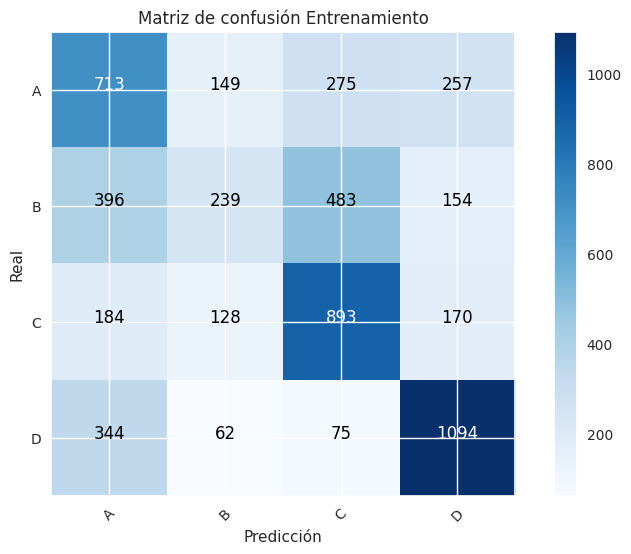

Reporte Prueba
              precision    recall  f1-score   support

           A       0.38      0.50      0.43       567
           B       0.40      0.15      0.22       582
           C       0.49      0.60      0.54       584
           D       0.66      0.71      0.68       675

    accuracy                           0.50      2408
   macro avg       0.48      0.49      0.47      2408
weighted avg       0.49      0.50      0.48      2408



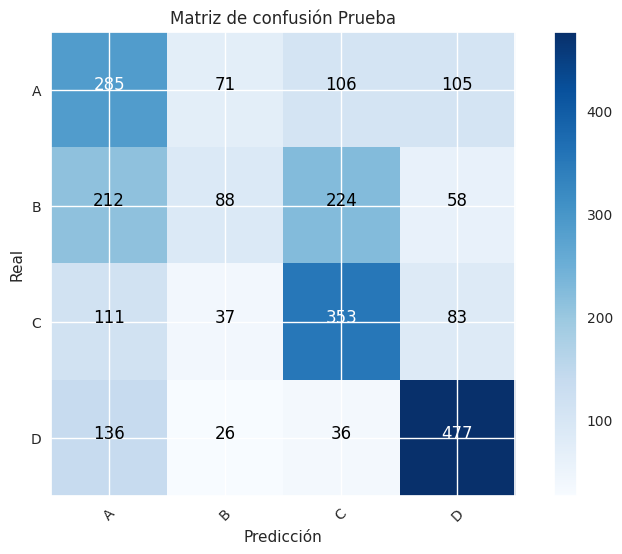

In [ ]:
# La exactitud para la prueba de nuestro modelo es del 50%, mucho mejor que el presentado
# en el baseline que era del 28%

report_and_conf_matrix(modelo_logistic, X_train_split, X_test_split, y_train_split, y_test_split)

Obtenemos el reporte y la matriz de confusión para nuestro mejor modelo de regresión logística con todas las variables. Con base en el reporte de entrenamiento podemos observar dos métricas importantes:

Precision: Nuestro modelo tiene altos valores para todas las clases de segmento de clientes a excepción de un poco baja para el segmento A (Una mayor precision disminuye los falsos positivos)

Recall: Nuestro modelo puede identificar bien los diferentes segmentos de cliente a excepción del segmento B para el cual se tiene un valor bajo de recall. (Un mayor recall indica que los falsos negativos disminuyen)


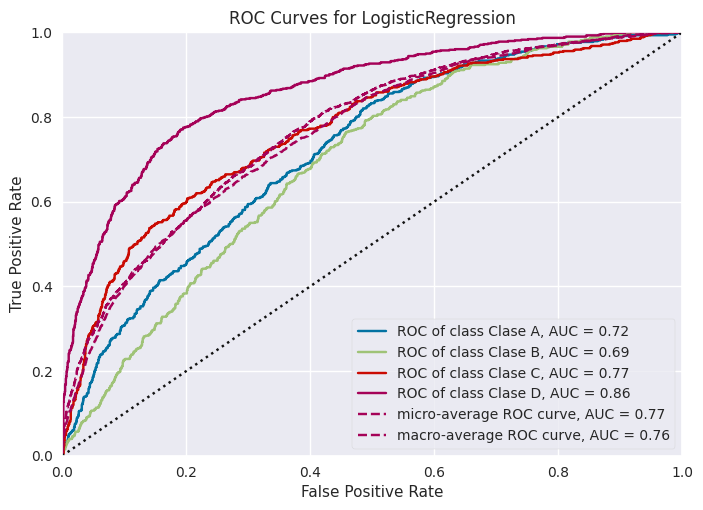

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'A': 'Clase A', 'B': 'Clase B', 'C': 'Clase C', 'D': 'Clase D'},
       estimator=LogisticRegression(C=0.001, penalty=None, random_state=1234,
                                    solver='newton-cg'))

In [ ]:
plot_ROC_curve(modelo_logistic, X_train=X_train_split, y_train=y_train_split, X_test=X_test_split, y_test=y_test_split)

De acuerdo con el grafico anterior podemos verificar el rendimiento de nuestro modelo de regresión logística para los datos de entrenamiento. El modelo distingue muy bien a los clientes pertenecientes al segmento D y en general a los del C y A, pero le cuesta un poco distinguir a los clientes que pertenecen al segmento B. Pero en general, para los datos de entrenamiento tuvo un buen rendimiento.

* Selección de características

Verificaremos si al realizar selección de variables, nuestro modelo presenta mejores resultados.

(Manera 1)

In [ ]:
# Utilizamos un método para extracción recursiva de características utilizando validación cruzada
# Con este método obtenemos las variables independientes más importantes dentro del dataframe

select = RFECV(modelo_logistic, step=1, cv=5)
select = select.fit(X_train_split, y_train_split)

print("Ranking de características", select.ranking_)

Ranking de características [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [ ]:
# Utilizando el objeto de selección de características entrenado con el X_train
# transformamos el X_train y X_test en conjuntos con nueva cantidad de variables independientes

X_train_tf = select.transform(X_train_split)
X_test_tf = select.transform(X_test_split)

print('Número de variables elegidas =', X_train_tf.shape[1])
print('Número de variables elegidas =', X_test_tf.shape[1])

classification_metrics(modelo_logistic, X_train_tf, X_test_tf, y_train_split, y_test_split)

Número de variables elegidas = 28
Número de variables elegidas = 28
Training Accuracy = 0.5233262108262108
Test Accuracy = 0.4995847176079734
Training Kappa = 0.36055019957349965
Test Kappa = 0.33134093376389073
Training Precision = [0.44 0.41 0.52 0.65]
Test Precision = [0.38 0.4  0.49 0.66]
Training recall = [0.51 0.19 0.65 0.69]
Test recall = [0.5  0.15 0.6  0.71]


(LogisticRegression(C=0.001, penalty=None, random_state=1234, solver='newton-cg'),
 {'Training Accuracy': 0.5233262108262108,
  'Test Accuracy': 0.4995847176079734,
  'Training Kappa': 0.36055019957349965,
  'Test Kappa': 0.33134093376389073,
  'Training Precision': array([0.44, 0.41, 0.52, 0.65]),
  'Test Precision': array([0.38, 0.4 , 0.49, 0.66]),
  'Training recall': array([0.51, 0.19, 0.65, 0.69]),
  'Test recall': array([0.5 , 0.15, 0.6 , 0.71])})

Con la manera 1 podemos ver que se sugiere no hacer selección de variables, al parecer no hay una combinación de variables que me permita mejorar la exactitud de mi modelo la cual permanece en el 50% para los datos de entrenamiento.

(Manera 2)

In [ ]:
# Selección de características
# Podemos utilizar un método diferente para la selección de características
# En este caso hacemos uso de SelectKBest que nos permite seleccionar las k mejores variables
# independientes teniendo en cuenta el f_classif
# Construimos una función que a partir del conjunto de entrenamiento y el de prueba nos retorna
# los conjuntos ya transformados

def select_features(X_train, y_train, X_test,n):
  fs = SelectKBest(score_func=f_classif, k=n)
  fs.fit(X_train, y_train)
  X_train_fs = fs.transform(X_train)
  X_test_fs = fs.transform(X_test)
  return X_train_fs, X_test_fs, fs

Feature 0: 335.404654
Feature 1: 18.463561
Feature 2: 73.402936
Feature 3: 3.011241
Feature 4: 3.011241
Feature 5: 395.970231
Feature 6: 395.970231
Feature 7: 278.851224
Feature 8: 278.851224
Feature 9: 311.326074
Feature 10: 3.022009
Feature 11: 26.395876
Feature 12: 30.300862
Feature 13: 10.754638
Feature 14: 468.951878
Feature 15: 6.994658
Feature 16: 6.774392
Feature 17: 31.981821
Feature 18: 256.077202
Feature 19: 56.009636
Feature 20: 415.612479
Feature 21: 1.987884
Feature 22: 2.411991
Feature 23: 3.723751
Feature 24: 34.980313
Feature 25: 0.150102
Feature 26: 33.818830
Feature 27: 0.400284


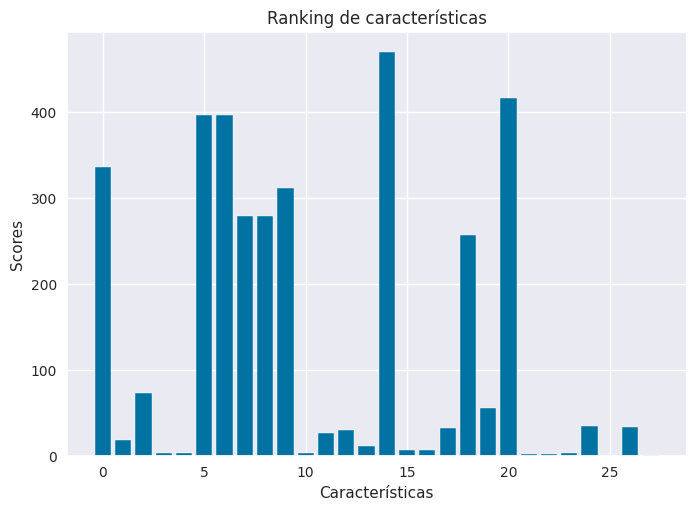

In [ ]:
# Haciendo uso de los conjuntos ya transformados podemos ver el score de cada variable
# En este caso utilizamos X_train, X_test, y_train

X_train_fs, X_test_fs, fs = select_features(X_train_split, y_train_split, X_test_split,10)

for i in range(len(fs.scores_)):
    print('Feature %d: %f' % (i, fs.scores_[i]))

fig, ax = plt.subplots()
ax.bar([i for i in range(len(fs.scores_))], fs.scores_)
ax.set(title='Ranking de características',xlabel='Características',ylabel='Scores')
plt.show()

Index(['Profession_Artist', 'Profession_Healthcare', 'Segmentation',
       'Family_Size', 'Work_Experience'],
      dtype='object')


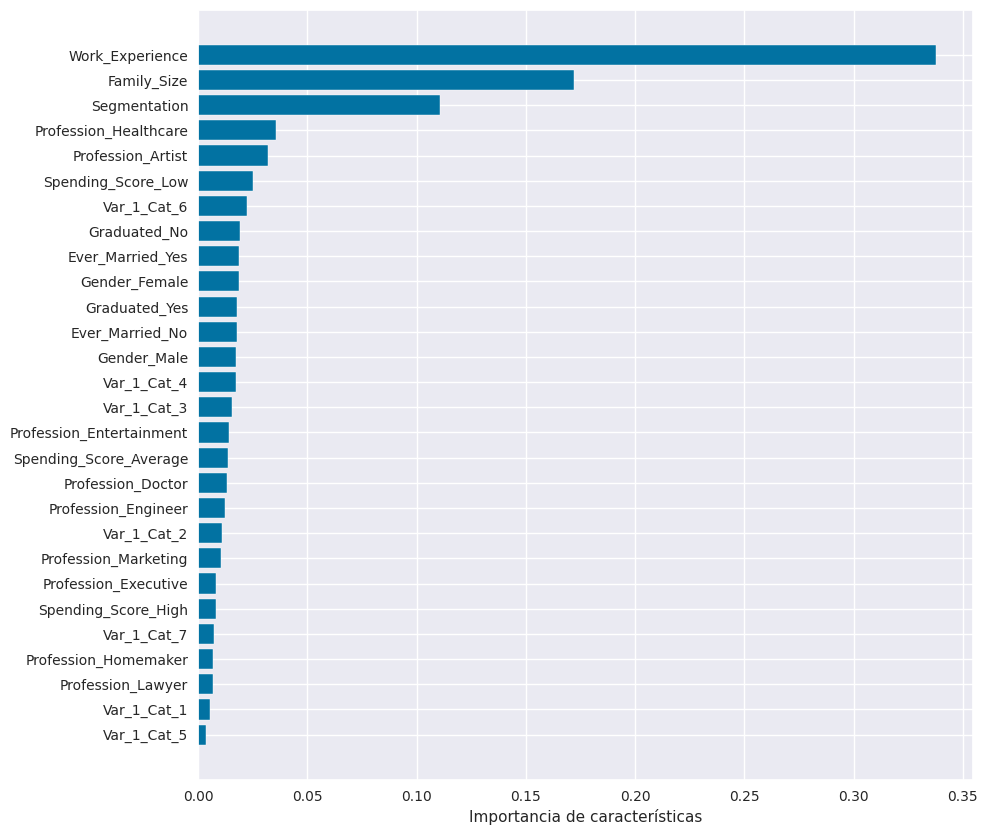

In [ ]:
# Haciendo uso de un modelo de Random Forest Classifier hacemos un ranking de características
# Ordenamos y graficamos

rf = RandomForestClassifier(n_estimators=150,random_state=1234)
rf.fit(X_train_split, y_train_split)
sort = rf.feature_importances_.argsort()
plt.figure(figsize=(10,10))
plt.barh(df_imputed.columns[1:][sort], rf.feature_importances_[sort])
plt.xlabel("Importancia de características")
l = len(df_imputed.columns[1:])
importants = df_imputed.columns[1:][sort][-5:]
print(importants)

In [ ]:
acc_train_vec=[]
acc_test_vec=[]
for i in list(range(1,len(df_imputed.columns))):
  X_train_fs, X_test_fs, fs = select_features(X_train_split, y_train_split, X_test_split, i)
  print(f'para i={i}')
  model, metrics = classification_metrics(modelo_logistic, X_train_fs, X_test_fs, y_train_split, y_test_split)
  for item in metrics.items():
    if (item[0] == 'Test Accuracy'):
      acc_test_vec.append(item[1])
  print('------------------------------')


para i=1
Training Accuracy = 0.3541666666666667
Test Accuracy = 0.3480066445182724
Training Kappa = 0.13497891150254304
Test Kappa = 0.13834411535179536
Training Precision = [0.28 0.   0.   0.74]
Test Precision = [0.27 0.   0.   0.72]
Training recall = [0.95 0.   0.   0.42]
Test recall = [0.94 0.   0.   0.45]
------------------------------
para i=2
Training Accuracy = 0.442485754985755
Test Accuracy = 0.43521594684385384
Training Kappa = 0.2545823692032062
Test Kappa = 0.2509651467601741
Training Precision = [0.35 0.   0.42 0.74]
Test Precision = [0.34 0.   0.41 0.72]
Training recall = [0.64 0.   0.67 0.42]
Test recall = [0.65 0.   0.64 0.45]
------------------------------
para i=3
Training Accuracy = 0.43803418803418803
Test Accuracy = 0.43438538205980065
Training Kappa = 0.24904430983186077
Test Kappa = 0.2502069552037145
Training Precision = [0.35 0.   0.41 0.76]
Test Precision = [0.34 0.   0.41 0.74]
Training recall = [0.64 0.   0.67 0.4 ]
Test recall = [0.65 0.   0.65 0.44]
------

In [ ]:
max_value = max(acc_test_vec)

max_index = acc_test_vec.index(max_value)
print(max(acc_test_vec))

print(acc_test_vec[max_index])
print("Mejor i: ",max_index+1)

0.5008305647840532
0.5008305647840532
Mejor i:  23


In [ ]:
# Modelo de regresión logística utilizando feature selection 23 variables

X_train_fs, X_test_fs, fs = select_features(X_train_split, y_train_split, X_test_split, 23)
model, metrics = classification_metrics(modelo_logistic, X_train_fs, X_test_fs, y_train_split, y_test_split)

Training Accuracy = 0.5227920227920227
Test Accuracy = 0.5008305647840532
Training Kappa = 0.35981461655562974
Test Kappa = 0.33301532830332337
Training Precision = [0.43 0.41 0.52 0.65]
Test Precision = [0.38 0.4  0.49 0.66]
Training recall = [0.51 0.19 0.65 0.7 ]
Test recall = [0.5  0.16 0.61 0.71]


Reporte Entrenamiento
              precision    recall  f1-score   support

           A       0.43      0.51      0.47      1394
           B       0.41      0.19      0.26      1272
           C       0.52      0.65      0.58      1375
           D       0.65      0.70      0.67      1575

    accuracy                           0.52      5616
   macro avg       0.50      0.51      0.49      5616
weighted avg       0.51      0.52      0.50      5616



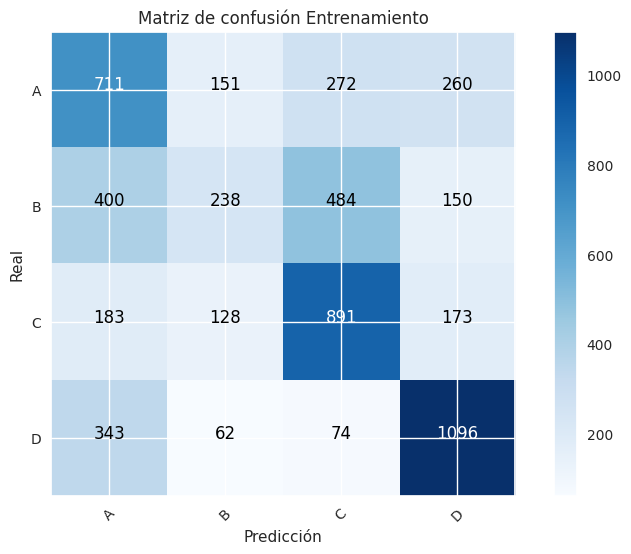

Reporte Prueba
              precision    recall  f1-score   support

           A       0.38      0.50      0.44       567
           B       0.40      0.16      0.23       582
           C       0.49      0.61      0.54       584
           D       0.66      0.71      0.68       675

    accuracy                           0.50      2408
   macro avg       0.49      0.49      0.47      2408
weighted avg       0.49      0.50      0.48      2408



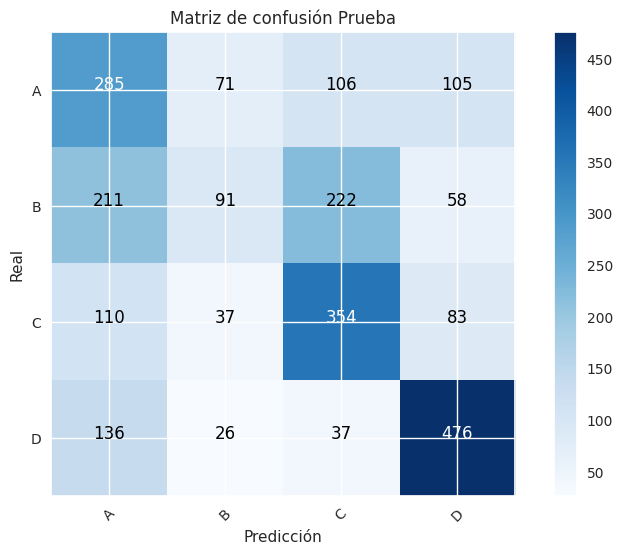

In [ ]:
# Reporte y matriz de confusión

report_and_conf_matrix(modelo_logistic, X_train_fs, X_test_fs, y_train_split, y_test_split)

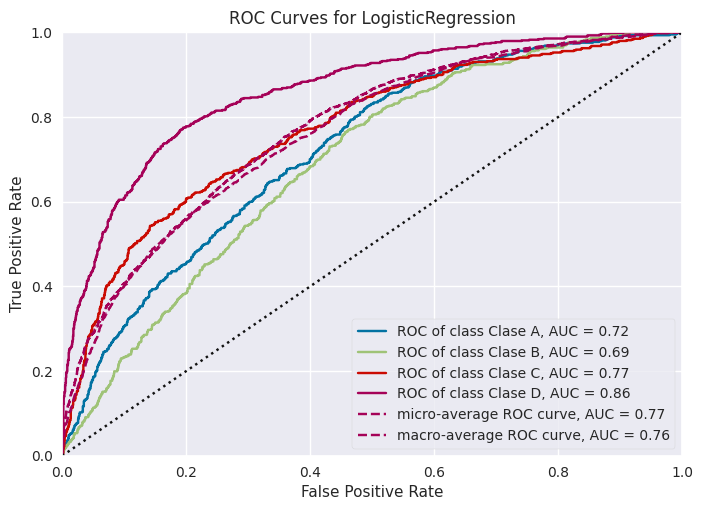

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'A': 'Clase A', 'B': 'Clase B', 'C': 'Clase C', 'D': 'Clase D'},
       estimator=LogisticRegression(C=0.001, penalty=None, random_state=1234,
                                    solver='newton-cg'))

In [ ]:
plot_ROC_curve(modelo_logistic, X_train=X_train_fs, y_train=y_train_split, X_test=X_test_fs, y_test=y_test_split)

Se puede observar que los resultados no cambiaron en la curva ROC, pero si mejoro un poco el Recall para el segmento B de clientes.

* Test

Implementaremos el modelo para revisar como son los resultados pasándole una base que nunca ha visto la cual es Test.

In [ ]:
# Modelo de regresión logística utilizando feature selection con el data train y test

X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test, 23)
model, metrics = classification_metrics(modelo_logistic, X_train_fs, X_test_fs, y_train, y_test)

Training Accuracy = 0.5174476570289133
Test Accuracy = 0.3319375713741911
Training Kappa = 0.35364203140238926
Test Kappa = 0.09870347298613713
Training Precision = [0.42 0.4  0.52 0.66]
Test Precision = [0.36 0.21 0.24 0.43]
Training recall = [0.5  0.21 0.61 0.7 ]
Test recall = [0.34 0.13 0.38 0.45]


Reporte Entrenamiento
              precision    recall  f1-score   support

           A       0.42      0.50      0.46      1961
           B       0.40      0.21      0.28      1854
           C       0.52      0.61      0.56      1959
           D       0.66      0.70      0.68      2250

    accuracy                           0.52      8024
   macro avg       0.50      0.51      0.49      8024
weighted avg       0.51      0.52      0.50      8024



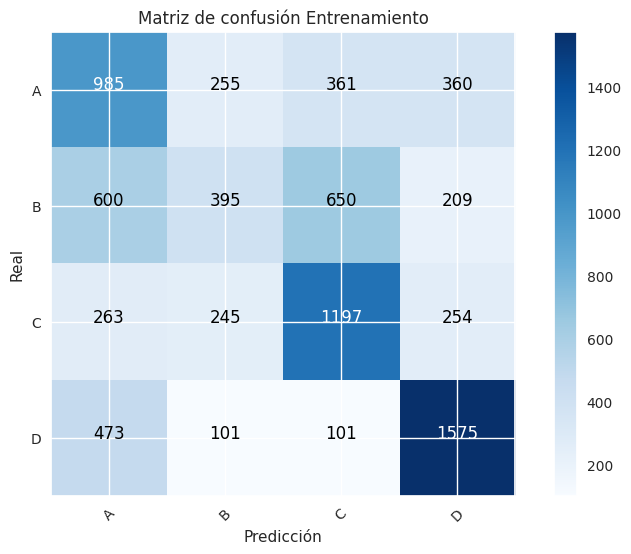

Reporte Prueba
              precision    recall  f1-score   support

           A       0.36      0.34      0.35       846
           B       0.21      0.13      0.16       550
           C       0.24      0.38      0.30       472
           D       0.43      0.45      0.44       759

    accuracy                           0.33      2627
   macro avg       0.31      0.32      0.31      2627
weighted avg       0.33      0.33      0.33      2627



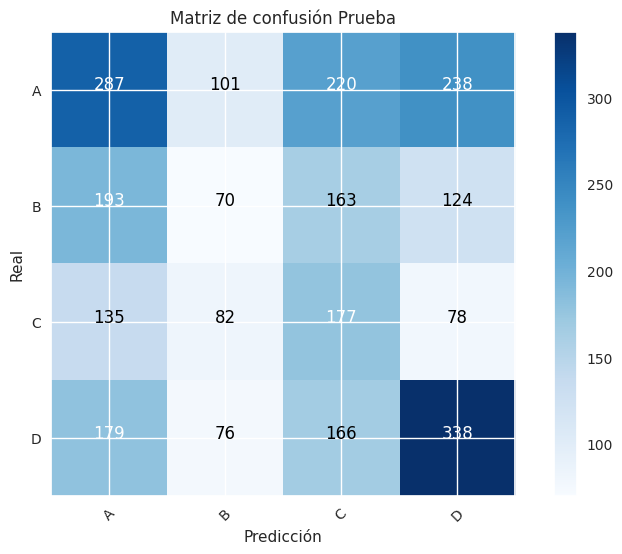

In [ ]:
# Reporte y matriz de confusión

report_and_conf_matrix(modelo_logistic, X_train_fs, X_test_fs, y_train, y_test)

Con base en la matriz de confusión, se puede concluir que :

*   La precisión del modelo con los datos de entrenamiento y aplicando feature selection de 23 variables fue del 52% aproximadamente. Por el contrario, con los datos de prueba aplicando la misma feature selection, la precisión de este modelo fue de aproximadamente 33%.

*   El segmento D de clientes tuvo el porcentaje más alto de clasificación, aproximadamente el 43% de las predicciones, son realmente instancias de este segmento.

*   De todas las predicciones que el modelo hizo para el segmento A de clientes,  aproximadamente el 36% pertenecian realmente instancias de esta clase.

*   Para el segmento B y C de clientes, el modelo logró una clasificación aproximadamente del 25%


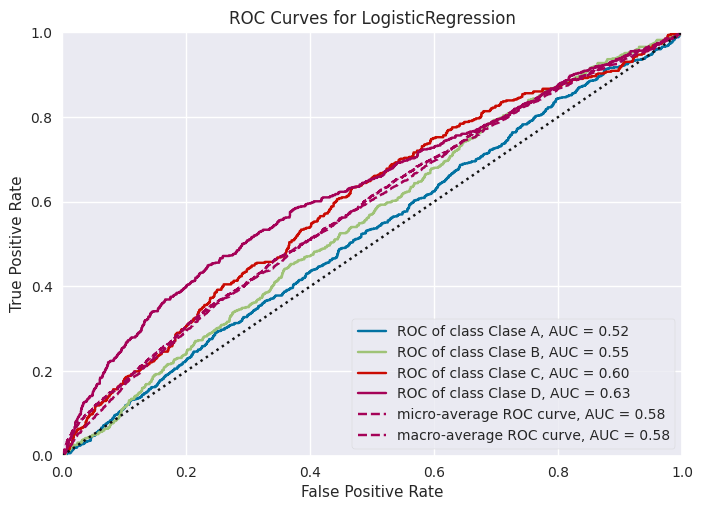

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'A': 'Clase A', 'B': 'Clase B', 'C': 'Clase C', 'D': 'Clase D'},
       estimator=LogisticRegression(C=0.001, penalty=None, random_state=1234,
                                    solver='newton-cg'))

In [ ]:
plot_ROC_curve(modelo_logistic, X_train=X_train_fs, y_train=y_train, X_test=X_test_fs, y_test=y_test)

De acuerdo con el grafico anterior podemos verificar el rendimiento de nuestro modelo de regresión logística para los datos de Test. El modelo tiene resultados más bajos que cuando se entrenó y en este caso parece que distingue bien a los clientes pertenecientes al segmento D y en general a los del C, pero le cuesta distinguir a los clientes que pertenecen al segmento A y B. De igual manera para los datos de prueba se supera el baseline que era del 28% y ahora es del 33%.

In [ ]:
model, metrics = classification_metrics(modelo_logistic, X_train_fs, X_test_fs, y_train, y_test)
pickle.dump(model, open('models/modelo_logistic.pkl', 'wb'))
pickle.dump(metrics, open('metrics/modelo_logistic.pkl', 'wb'))

Training Accuracy = 0.5174476570289133
Test Accuracy = 0.3319375713741911
Training Kappa = 0.35364203140238926
Test Kappa = 0.09870347298613713
Training Precision = [0.42 0.4  0.52 0.66]
Test Precision = [0.36 0.21 0.24 0.43]
Training recall = [0.5  0.21 0.61 0.7 ]
Test recall = [0.34 0.13 0.38 0.45]


## 2.2 Modelo K Vecinos mas cercanos

Reporte Entrenamiento
              precision    recall  f1-score   support

           A       0.57      0.69      0.62      1394
           B       0.56      0.52      0.54      1272
           C       0.64      0.64      0.64      1375
           D       0.76      0.67      0.71      1575

    accuracy                           0.63      5616
   macro avg       0.63      0.63      0.63      5616
weighted avg       0.64      0.63      0.63      5616



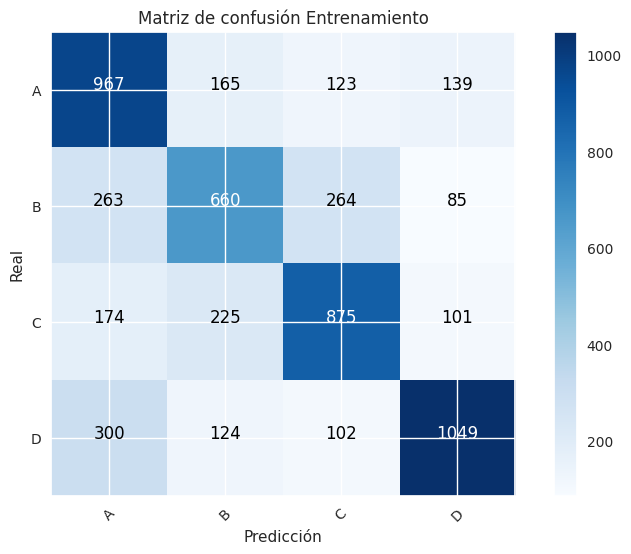

Reporte Prueba
              precision    recall  f1-score   support

           A       0.36      0.44      0.39       567
           B       0.31      0.28      0.29       582
           C       0.44      0.45      0.44       584
           D       0.66      0.57      0.61       675

    accuracy                           0.44      2408
   macro avg       0.44      0.43      0.43      2408
weighted avg       0.45      0.44      0.44      2408



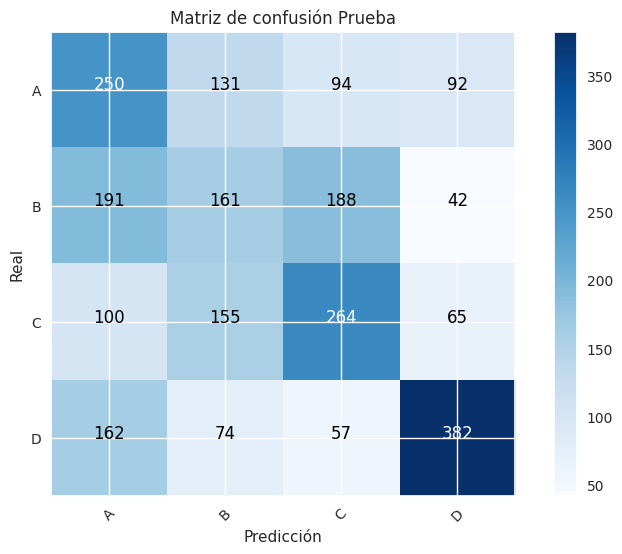

In [ ]:
#Clasificador con KNN

# Prueba con K=5 inicialmente
classifier = KNeighborsClassifier(n_neighbors=5)
classifier.fit(X_train_split, y_train_split)

# Predict y data with classifier:
y_predict = classifier.predict(X_test_split)

report_and_conf_matrix(classifier, X_train_split, X_test_split, y_train_split, y_test_split)

En la matriz de confusión anterior se puede detallar que el modelo de KNN tiene muy buenos resultados para los datos de entrenamiento, tiene un alto valor de precisión para cada uno de los segmentos al igual que su recall, para el segmento B de clientes sigue siendo el que presenta valores más bajos al igual que en modelo logístico.

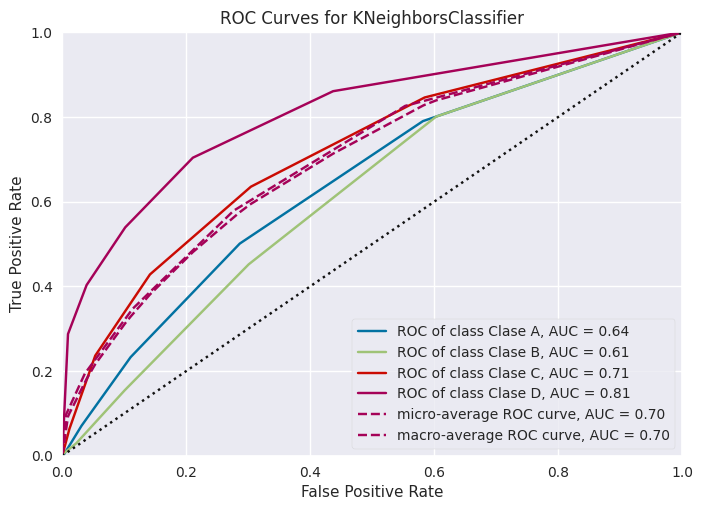

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for KNeighborsClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'A': 'Clase A', 'B': 'Clase B', 'C': 'Clase C', 'D': 'Clase D'},
       estimator=KNeighborsClassifier())

In [ ]:
plot_ROC_curve(classifier, X_train=X_train_split, y_train=y_train_split, X_test=X_test_split, y_test=y_test_split)

Con la curva ROC se puede ver que el modelo distingue bastante bien para los datos de entrenamiento el segmento de clientes D y C pero le cuesta un poco entre los segmentos A y B.

In [ ]:
cm = confusion_matrix(y_test_split, y_predict)
print(cm)
print("Exactitud: ", accuracy_score(y_test_split, y_predict))
print("Kappa    : ", cohen_kappa_score(y_test_split, y_predict))

[[250 131  94  92]
 [191 161 188  42]
 [100 155 264  65]
 [162  74  57 382]]
Exactitud:  0.438953488372093
Kappa    :  0.25253370965422084


In [ ]:
# Buscamos el valor optimo de K, ya que antes se probo con 5 para tener un primer vistazo del modelo

acc_train_vec=[]
acc_test_vec=[]
k_vec= np.arange(1,31,2)
for k in k_vec:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_split, y_train_split)
    y_pred = knn.predict(X_train_split)
    acc_train_vec.append(accuracy_score(y_train_split, y_pred))
    y_pred = knn.predict(X_test_split)
    acc_test_vec.append(accuracy_score(y_test_split, y_pred))
print(acc_train_vec)
print(acc_test_vec)
print(k_vec)

[0.9650997150997151, 0.6873219373219374, 0.6323005698005698, 0.6079059829059829, 0.582977207977208, 0.5687321937321937, 0.5614316239316239, 0.5548433048433048, 0.5487891737891738, 0.5432692307692307, 0.5427350427350427, 0.5350783475783476, 0.5349002849002849, 0.5290242165242165, 0.5227920227920227]
[0.4393687707641196, 0.446843853820598, 0.438953488372093, 0.46179401993355484, 0.46719269102990035, 0.4642857142857143, 0.4688538205980066, 0.46677740863787376, 0.4717607973421927, 0.47093023255813954, 0.4684385382059801, 0.47259136212624586, 0.4700996677740864, 0.46719269102990035, 0.46511627906976744]
[ 1  3  5  7  9 11 13 15 17 19 21 23 25 27 29]


In [ ]:
# Find the maximum value in the list

max_value = max(acc_test_vec)

# Find the index of the maximum value

max_index = acc_test_vec.index(max_value)
print(max(acc_test_vec))

print(k_vec[max_index])

0.47259136212624586
23


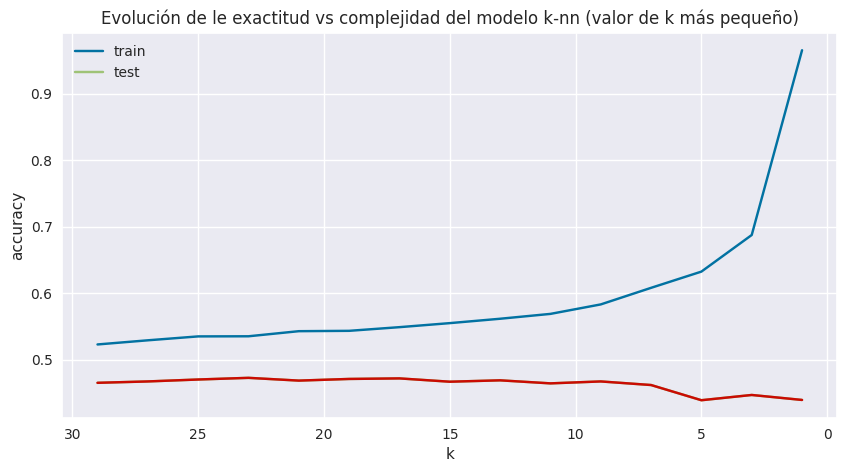

In [ ]:
plt.figure(figsize=(10,5))
ax = plt.gca() # get current axis
plt.plot(k_vec, acc_train_vec)
plt.plot(k_vec, acc_test_vec)
plt.plot(k_vec, acc_test_vec)
ax.set_xlim(ax.get_xlim()[::-1])  # reverse axis
plt.axis('tight')
plt.xlabel('k')
plt.ylabel('accuracy')
plt.title('Evolución de le exactitud vs complejidad del modelo k-nn (valor de k más pequeño)')
plt.legend(['train', 'test'])

In [ ]:
# Prueba con el mejor K que es 23

k = 23
classifier = KNeighborsClassifier(n_neighbors=k)
classifier.fit(X_train_split, y_train_split)

# Predict y data with classifier:
y_predict = classifier.predict(X_test_split)

Reporte Entrenamiento
              precision    recall  f1-score   support

           A       0.49      0.48      0.49      1394
           B       0.44      0.29      0.35      1272
           C       0.52      0.64      0.57      1375
           D       0.64      0.68      0.66      1575

    accuracy                           0.54      5616
   macro avg       0.52      0.53      0.52      5616
weighted avg       0.53      0.54      0.53      5616



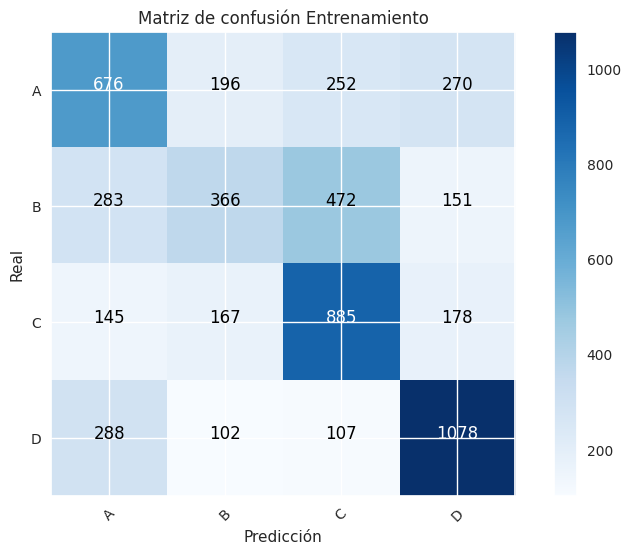

Reporte Prueba
              precision    recall  f1-score   support

           A       0.37      0.39      0.38       567
           B       0.37      0.21      0.27       582
           C       0.45      0.58      0.51       584
           D       0.62      0.67      0.65       675

    accuracy                           0.47      2408
   macro avg       0.45      0.46      0.45      2408
weighted avg       0.46      0.47      0.46      2408



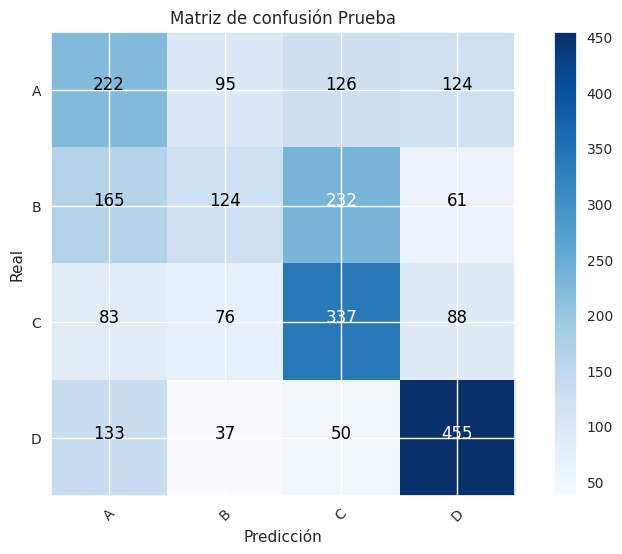

In [ ]:
report_and_conf_matrix(classifier, X_train_split, X_test_split, y_train_split, y_test_split)

Se puede observar que con este número de vecinos el accuracy paso del 44% al 47% para los datos de validación en la data de Train. Los resultados de Recall mejoraron para los segmentos C y D de clientes pero no para los segmentos A y B.

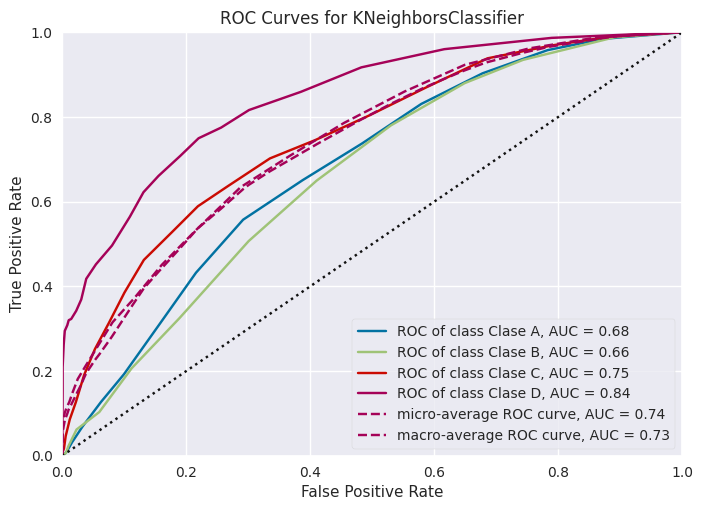

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for KNeighborsClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'A': 'Clase A', 'B': 'Clase B', 'C': 'Clase C', 'D': 'Clase D'},
       estimator=KNeighborsClassifier(n_neighbors=23))

In [ ]:
plot_ROC_curve(classifier, X_train=X_train_split, y_train=y_train_split, X_test=X_test_split, y_test=y_test_split)

La curva ROC nos muestra que el modelo con el K optimo encontrado presenta mejores resultados al momento de distinguir entre cada uno de los segmentos de clientes.

In [ ]:
cm = confusion_matrix(y_test_split, y_predict)
print(cm)
print("Exactitud: ", accuracy_score(y_test_split, y_predict))
print("Kappa    : ", cohen_kappa_score(y_test_split, y_predict))

[[222  95 126 124]
 [165 124 232  61]
 [ 83  76 337  88]
 [133  37  50 455]]
Exactitud:  0.47259136212624586
Kappa    :  0.29484449459851014


* Test

Implementaremos el modelo para revisar como son los resultados pasándole una base que nunca ha visto la cual es Test.

In [ ]:
# Prueba con segun el mejor K es 23
k = 23
classifier = KNeighborsClassifier(n_neighbors=k)
classifier.fit(X_train, y_train)

# Predict y data with classifier:
y_predict = classifier.predict(X_test)

In [ ]:
model, metrics = classification_metrics(classifier, X_train, X_test, y_train, y_test)
pickle.dump(model, open('models/classifier.pkl', 'wb'))
pickle.dump(metrics, open('metrics/classifier.pkl', 'wb'))

Training Accuracy = 0.538135593220339
Test Accuracy = 0.3399314807765512
Training Kappa = 0.3821061793217808
Test Kappa = 0.11799654031095386
Training Precision = [0.48 0.45 0.52 0.66]
Test Precision = [0.37 0.25 0.25 0.46]
Training recall = [0.47 0.33 0.64 0.68]
Test recall = [0.28 0.21 0.4  0.46]


Reporte Entrenamiento
              precision    recall  f1-score   support

           A       0.48      0.47      0.47      1961
           B       0.45      0.33      0.38      1854
           C       0.52      0.64      0.58      1959
           D       0.66      0.68      0.67      2250

    accuracy                           0.54      8024
   macro avg       0.53      0.53      0.52      8024
weighted avg       0.53      0.54      0.53      8024



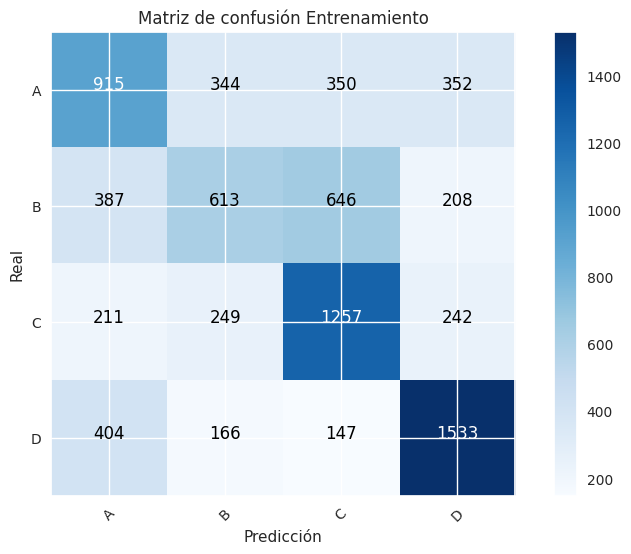

Reporte Prueba
              precision    recall  f1-score   support

           A       0.37      0.28      0.32       846
           B       0.25      0.21      0.23       550
           C       0.25      0.40      0.31       472
           D       0.46      0.46      0.46       759

    accuracy                           0.34      2627
   macro avg       0.33      0.34      0.33      2627
weighted avg       0.35      0.34      0.34      2627



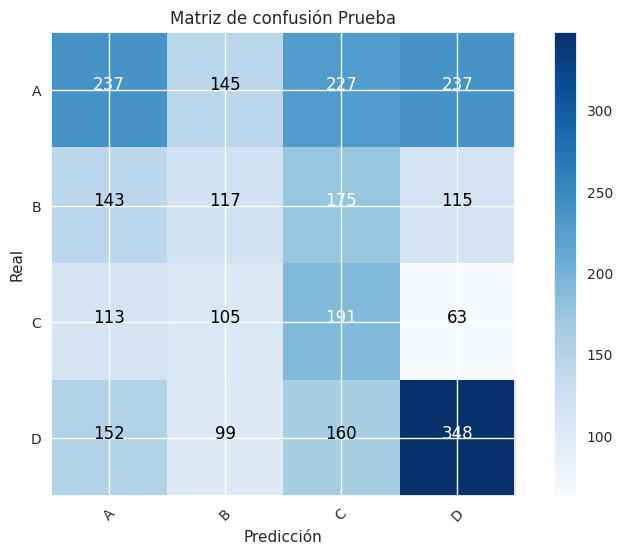

In [ ]:
report_and_conf_matrix(classifier, X_train, X_test, y_train, y_test)

Con base en la matriz de confusión, se puede concluir que :

*   La precisión del modelo con los datos de entrenamiento fue del 54% aproximadamente. Por el contrario, con los datos de prueba, la precisión de este modelo fue de aproximadamente 34%.

*   El segmento D de clientes tuvo el porcentaje más alto de clasificación, aproximadamente el 46% de las predicciones, son realmente instancias de este segmento.

*   De todas las predicciones que el modelo hizo para el segmento A de clientes,  aproximadamente el 37% pertenecian realmente instancias de esta clase.

*   Para el segmento B y C de clientes, el modelo logró una clasificación aproximadamente del 25%


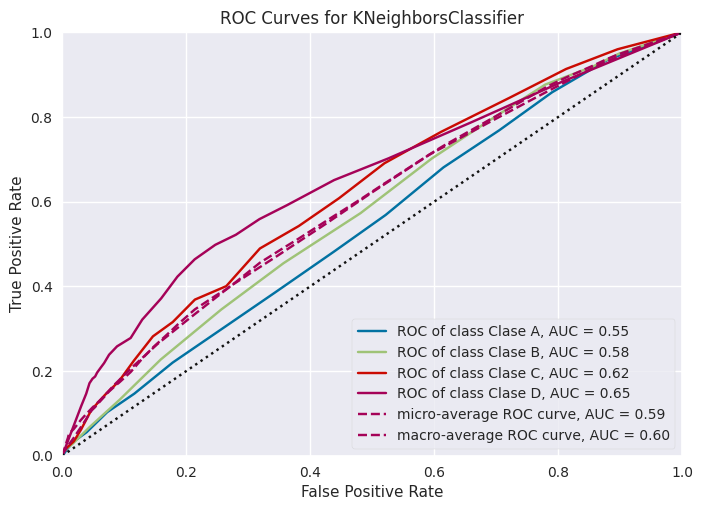

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for KNeighborsClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'A': 'Clase A', 'B': 'Clase B', 'C': 'Clase C', 'D': 'Clase D'},
       estimator=KNeighborsClassifier(n_neighbors=23))

In [ ]:
plot_ROC_curve(classifier, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test)

De acuerdo con el grafico anterior podemos verificar el rendimiento de nuestro modelo de KNN para los datos de Test. El modelo tiene resultados más bajos que cuando se entrenó y en este caso parece que distingue bien a los clientes pertenecientes al segmento D y en general a los del C, pero le cuesta distinguir a los clientes que pertenecen al segmento A y B. De igual manera para los datos de prueba se supera el baseline que era del 28% y ahora es del 34%.

In [ ]:
cm = confusion_matrix(y_test, y_predict)
print(cm)
print("Exactitud: ", accuracy_score(y_test, y_predict))
print("Kappa    : ", cohen_kappa_score(y_test, y_predict))


[[237 145 227 237]
 [143 117 175 115]
 [113 105 191  63]
 [152  99 160 348]]
Exactitud:  0.3399314807765512
Kappa    :  0.11799654031095386


In [ ]:
scoring = ['accuracy', 'precision_weighted', 'recall_weighted', 'f1_weighted']
knn = KNeighborsClassifier(n_neighbors=k)
scores = cross_validate(knn, X_train, y_train, scoring=scoring, cv=10, return_train_score=False)

for key in scores:
    score = scores[key]
    print("%s: %0.2f" % (key, score.mean()))

fit_time: 0.01
score_time: 0.13
test_accuracy: 0.48
test_precision_weighted: 0.47
test_recall_weighted: 0.48
test_f1_weighted: 0.47


## 2.3 Modelo Arboles de decision

In [ ]:
# Encontrar la mejor combinacion de parametros
model = tree.DecisionTreeClassifier()
parameters = {'criterion': ['gini', 'entropy'],
              'max_depth': [None, 10, 20, 30, 40, 50],
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf': [1, 2, 4]
             }

grid_search = GridSearchCV(estimator = model,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 5,
                           verbose=0)

grid_search.fit(X_train_split, y_train_split)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 10, 20, 30, 40, 50],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]},
             scoring='accuracy')

In [ ]:
print(grid_search.best_params_)
print(grid_search.best_score_)

{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10}
0.49501399086711684


In [ ]:
np.random.seed(1234)
ctree = tree.DecisionTreeClassifier(
    criterion='gini', # el criterio de particionamiento de un conjunto de datos (gini, entropy)
    max_depth=10,      # prepoda: controla la profundidad del árbol (largo máximo de las ramas)
    min_samples_split=10, # prepoda: el mínimo número de registros necesarios para crear una nueva rama
    min_samples_leaf=4,  # prepoda: el mínimo número de registros en una hoja
    random_state=None,   # semilla del generador aleatorio utilizado para
    max_leaf_nodes=None, # prepoda: máximo número de nodos hojas
    min_impurity_decrease=0.0, # prepoda: umbral mínimo de reducción de la impureza para aceptar la creación de una rama
    class_weight=None    # permite asociar pesos a las clases, en el caso de diferencias de importancia entre ellas
)

In [ ]:
ctree.fit(X_train_split, y_train_split)

DecisionTreeClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=10)

In [ ]:
y_pred = ctree.predict(X_test_split)
print(cm)
print("Exactitud: ", accuracy_score(y_test_split, y_pred))
print("Kappa    : ", cohen_kappa_score(y_test_split, y_pred))

[[237 145 227 237]
 [143 117 175 115]
 [113 105 191  63]
 [152  99 160 348]]
Exactitud:  0.4941860465116279
Kappa    :  0.32455366837922706


Reporte Entrenamiento
              precision    recall  f1-score   support

           A       0.56      0.61      0.58      1394
           B       0.55      0.42      0.48      1272
           C       0.61      0.68      0.64      1375
           D       0.73      0.73      0.73      1575

    accuracy                           0.62      5616
   macro avg       0.61      0.61      0.61      5616
weighted avg       0.62      0.62      0.61      5616



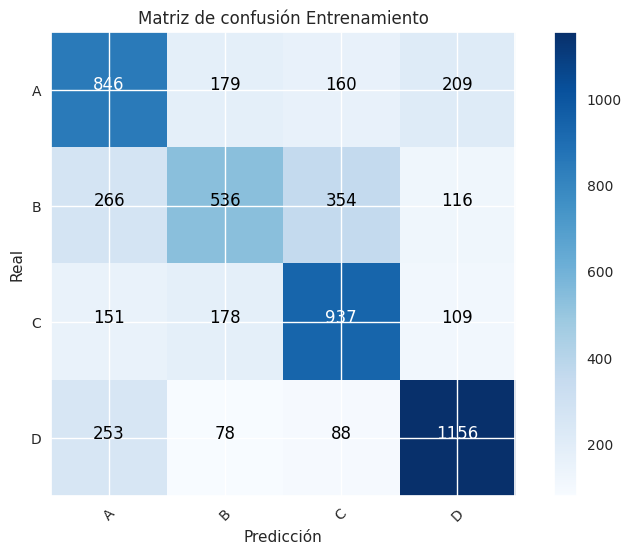

Reporte Prueba
              precision    recall  f1-score   support

           A       0.40      0.46      0.43       567
           B       0.37      0.26      0.31       582
           C       0.49      0.56      0.52       584
           D       0.66      0.67      0.67       675

    accuracy                           0.49      2408
   macro avg       0.48      0.49      0.48      2408
weighted avg       0.49      0.49      0.49      2408



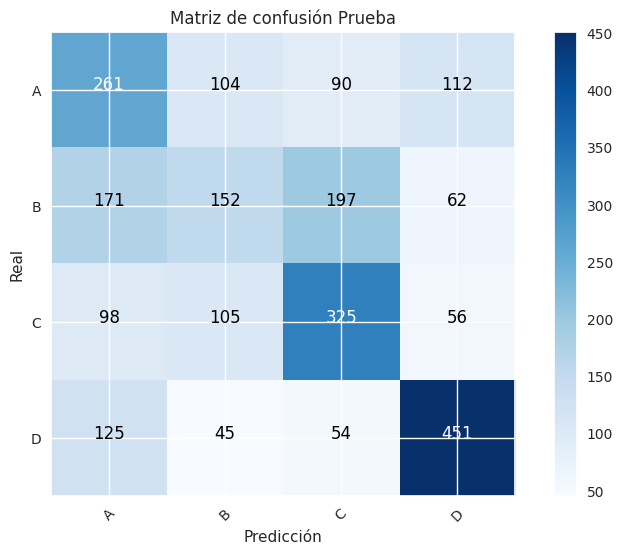

In [ ]:
report_and_conf_matrix(ctree, X_train_split, X_test_split, y_train_split, y_test_split)

En la matriz de confusión anterior se puede detallar que el modelo de KNN tiene muy buenos resultados para los datos de entrenamiento, tiene un alto valor de precisión para cada uno de los segmentos al igual que su recall, para el segmento B de clientes sigue siendo el que presenta valores más bajos al igual que en modelo logístico y KNN.

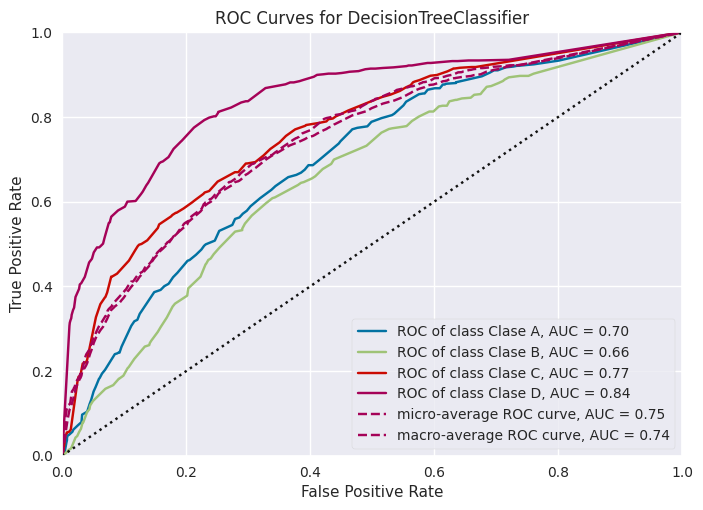

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'A': 'Clase A', 'B': 'Clase B', 'C': 'Clase C', 'D': 'Clase D'},
       estimator=DecisionTreeClassifier(max_depth=10, min_samples_leaf=4,
                                        min_samples_split=10))

In [ ]:
plot_ROC_curve(ctree, X_train=X_train_split, y_train=y_train_split, X_test=X_test_split, y_test=y_test_split)

Con la curva ROC se puede ver que el modelo distingue bastante bien para los datos de entrenamiento los segmentos de clientes D, C y A pero le cuesta un poco entre el segmento B, de igual manera son buenos resultados.

* Test

Implementaremos el modelo para revisar como son los resultados pasándole una base que nunca ha visto la cual es Test.

In [ ]:
ctree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=10)

In [ ]:
y_pred = ctree.predict(X_test)
print(cm)
print("Exactitud: ", accuracy_score(y_test, y_pred))
print("Kappa    : ", cohen_kappa_score(y_test, y_pred))

[[237 145 227 237]
 [143 117 175 115]
 [113 105 191  63]
 [152  99 160 348]]
Exactitud:  0.31556909021697754
Kappa    :  0.0804979392047892


Reporte Entrenamiento
              precision    recall  f1-score   support

           A       0.55      0.58      0.56      1961
           B       0.53      0.45      0.49      1854
           C       0.63      0.61      0.62      1959
           D       0.70      0.75      0.72      2250

    accuracy                           0.61      8024
   macro avg       0.60      0.60      0.60      8024
weighted avg       0.60      0.61      0.60      8024



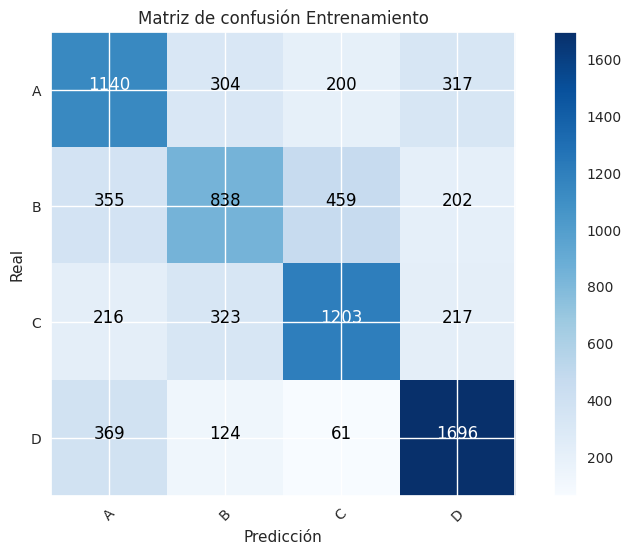

Reporte Prueba
              precision    recall  f1-score   support

           A       0.34      0.27      0.30       846
           B       0.23      0.23      0.23       550
           C       0.25      0.32      0.28       472
           D       0.40      0.43      0.41       759

    accuracy                           0.32      2627
   macro avg       0.31      0.31      0.31      2627
weighted avg       0.32      0.32      0.32      2627



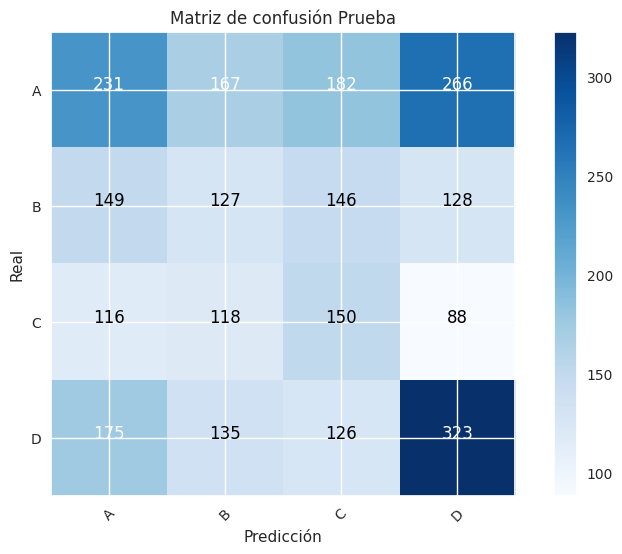

In [ ]:
report_and_conf_matrix(ctree, X_train, X_test, y_train, y_test)

Con base en la matriz de confusión, se puede concluir que :

*   La precisión del modelo con los datos de entrenamiento fue del 61% aproximadamente. Por el contrario, con los datos de prueba, la precisión de este modelo fue de aproximadamente 32%.

*   El segmento D de clientes tuvo el porcentaje más alto de clasificación, aproximadamente el 40% de las predicciones, son realmente instancias de este segmento.

*   De todas las predicciones que el modelo hizo para el segmento A de clientes,  aproximadamente el 34% pertenecian realmente instancias de esta clase.

*   Para el segmento B y C de clientes, el modelo logró una clasificación aproximadamente del 25%


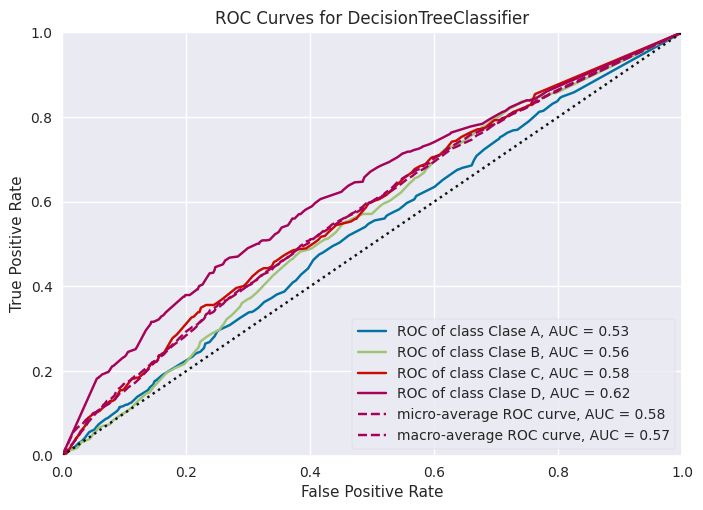

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'A': 'Clase A', 'B': 'Clase B', 'C': 'Clase C', 'D': 'Clase D'},
       estimator=DecisionTreeClassifier(max_depth=10, min_samples_leaf=4,
                                        min_samples_split=10))

In [ ]:
plot_ROC_curve(ctree, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test)

De acuerdo con el grafico anterior podemos verificar el rendimiento de nuestro modelo de Árboles para los datos de Test. El modelo tiene resultados más bajos que cuando se entrenó y en este caso parece que distingue bien a los clientes pertenecientes al segmento D y en general a los del C, pero le cuesta distinguir a los clientes que pertenecen al segmento A y B. De igual manera para los datos de prueba se supera el baseline que era del 28% y ahora es del 32%.

In [ ]:
model, metrics = classification_metrics(ctree, X_train, X_test, y_train, y_test)
pickle.dump(model, open('models/ctree.pkl', 'wb'))
pickle.dump(metrics, open('metrics/ctree.pkl', 'wb'))

Training Accuracy = 0.607801595214357
Test Accuracy = 0.31556909021697754
Training Kappa = 0.47524888374527685
Test Kappa = 0.0804979392047892
Training Precision = [0.55 0.53 0.63 0.7 ]
Test Precision = [0.34 0.23 0.25 0.4 ]
Training recall = [0.58 0.45 0.61 0.75]
Test recall = [0.27 0.23 0.32 0.42]


## 2.4 Modelo Ensambles (bagging decision tree)


In [ ]:
# Encontrar la mejor combinacion de parametros
model = BaggingClassifier(base_estimator = ctree)
parameters = {'n_estimators' : [50,100,200],
              'max_samples': [0.5, 0.6, 0.7, 0.8],
              'max_features': [0.5, 0.6, 0.7, 0.8],
              'bootstrap': [False, True],
              'bootstrap_features' : [False, True]
             }

grid_search = GridSearchCV(estimator = model,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 5,
                           verbose=0)

grid_search.fit(X_train_split, y_train_split)

GridSearchCV(cv=5,
             estimator=BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=10,
                                                                               min_samples_leaf=4,
                                                                               min_samples_split=10)),
             param_grid={'bootstrap': [False, True],
                         'bootstrap_features': [False, True],
                         'max_features': [0.5, 0.6, 0.7, 0.8],
                         'max_samples': [0.5, 0.6, 0.7, 0.8],
                         'n_estimators': [50, 100, 200]},
             scoring='accuracy')

In [ ]:
print(grid_search.best_params_)
print(grid_search.best_score_)

{'bootstrap': True, 'bootstrap_features': False, 'max_features': 0.7, 'max_samples': 0.6, 'n_estimators': 200}
0.5361442881453148


In [ ]:
np.random.seed(1234)
bagging = BaggingClassifier(base_estimator = ctree,   # Por defecto un decision tree
                            n_estimators=200,          # Número de modelos a crear
                            max_samples=0.6,          # Número o % de registros de la muestra de aprendizaje
                            max_features=0.7,         # Número o % de atributos de la muestra de aprendizaje
                            bootstrap=True,           # Utilizar reemplazo en el muestreo de los registros de aprendizaje
                            bootstrap_features=False, # Utilizar reemplazo en el muestreo de los atributos de aprendizaje
                            oob_score=False,          # Evaluar cada modelo con los registros no utilizados en su aprendizaje
                            n_jobs=2,                 # Número de cores a utilizar
                            random_state=None,        # random seed para el generador aleatorio
                            verbose=0)                # controla la cantidad de información a reportar

In [ ]:
np.random.seed(1234)
bagging.fit(X_train_split, y_train_split)
y_pred = bagging.predict(X_test_split)
cm= confusion_matrix(y_test_split, y_pred)
print("Exactitud: ", accuracy_score(y_test_split, y_pred))
print("Kappa    : ", cohen_kappa_score(y_test_split, y_pred))

Exactitud:  0.5340531561461794
Kappa    :  0.37623709572968644


Reporte Entrenamiento
              precision    recall  f1-score   support

           A       0.61      0.65      0.63      1394
           B       0.64      0.45      0.53      1272
           C       0.65      0.67      0.66      1375
           D       0.70      0.81      0.75      1575

    accuracy                           0.65      5616
   macro avg       0.65      0.64      0.64      5616
weighted avg       0.65      0.65      0.65      5616



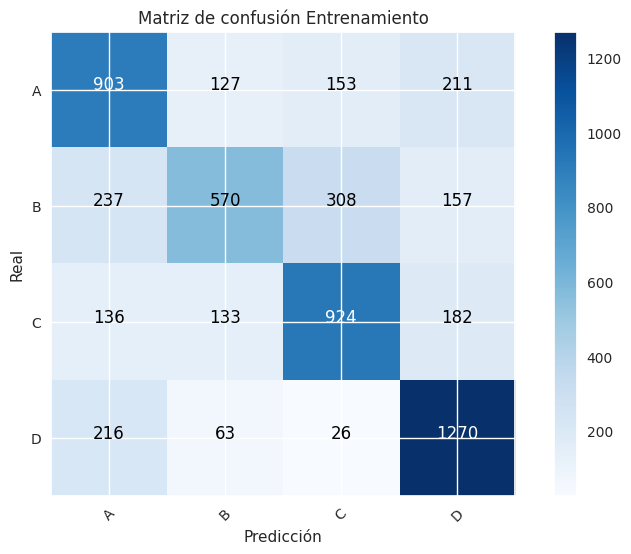

Reporte Prueba
              precision    recall  f1-score   support

           A       0.43      0.49      0.46       567
           B       0.46      0.29      0.36       582
           C       0.53      0.55      0.54       584
           D       0.64      0.76      0.69       675

    accuracy                           0.53      2408
   macro avg       0.52      0.52      0.51      2408
weighted avg       0.52      0.53      0.52      2408



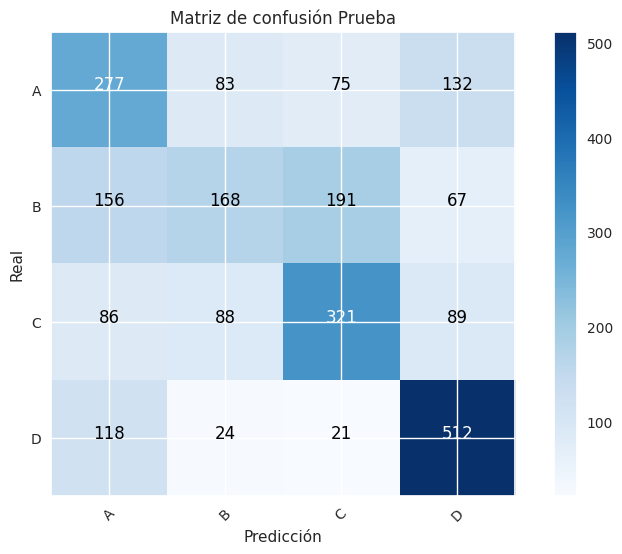

In [ ]:
report_and_conf_matrix(bagging, X_train_split, X_test_split, y_train_split, y_test_split)

En la matriz de confusión anterior se puede detallar que el modelo Bagging Decition Tree tiene muy buenos resultados para los datos de entrenamiento, tiene un alto valor de precisión para cada uno de los segmentos al igual que su recall, para el segmento B de clientes sigue siendo el que presenta valores más bajos al igual que en modelo logístico, KNN y Árbol de Decisión.

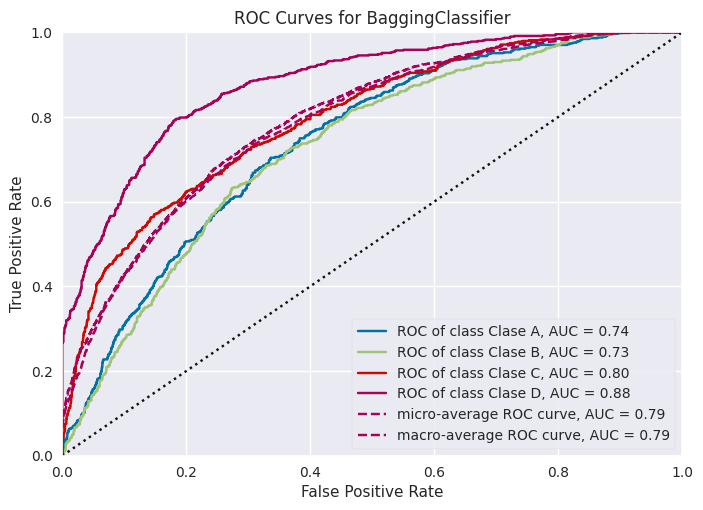

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for BaggingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'A': 'Clase A', 'B': 'Clase B', 'C': 'Clase C', 'D': 'Clase D'},
       estimator=BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=10,
                                                                         min_samples_leaf=4,
                                                                         min_samples_split=10),
                                   max_features=0.7, max_samples=0.6,
                                   n_estimators=200, n_jobs=2))

In [ ]:
plot_ROC_curve(bagging, X_train=X_train_split, y_train=y_train_split, X_test=X_test_split, y_test=y_test_split)

Con la curva ROC se puede ver que el modelo distingue bastante bien para los datos de entrenamiento cada uno de los segmentos de clientes, en mayor proporción el segmento D y C.

* Test

Implementaremos el modelo para revisar como son los resultados pasándole una base que nunca ha visto la cual es Test.

In [ ]:
np.random.seed(1234)
bagging.fit(X_train, y_train)
y_pred = bagging.predict(X_test)
cm= confusion_matrix(y_test, y_pred)
print("Exactitud: ", accuracy_score(y_test, y_pred))
print("Kappa    : ", cohen_kappa_score(y_test, y_pred))

Exactitud:  0.33612485725161784
Kappa    :  0.1045450103393416


Reporte Entrenamiento
              precision    recall  f1-score   support

           A       0.58      0.63      0.60      1961
           B       0.59      0.46      0.52      1854
           C       0.65      0.63      0.64      1959
           D       0.70      0.79      0.74      2250

    accuracy                           0.64      8024
   macro avg       0.63      0.63      0.63      8024
weighted avg       0.63      0.64      0.63      8024



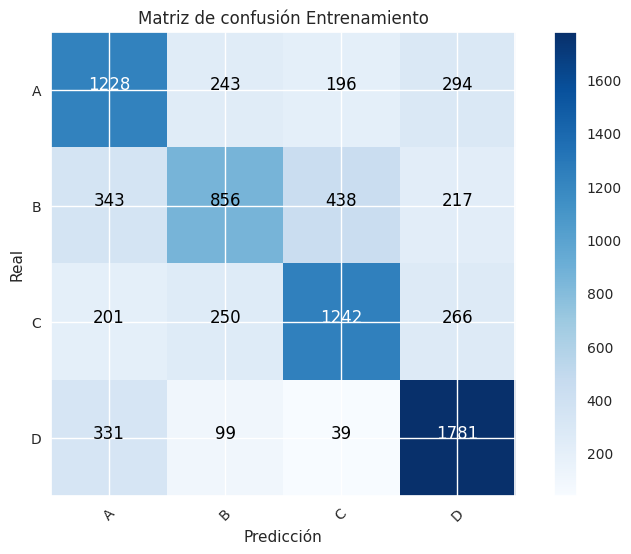

Reporte Prueba
              precision    recall  f1-score   support

           A       0.34      0.29      0.31       846
           B       0.26      0.23      0.25       550
           C       0.26      0.33      0.29       472
           D       0.42      0.46      0.44       759

    accuracy                           0.33      2627
   macro avg       0.32      0.33      0.32      2627
weighted avg       0.33      0.33      0.33      2627



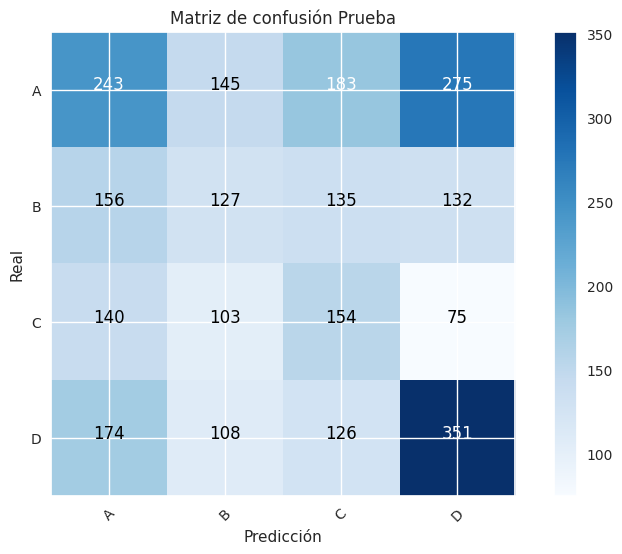

In [ ]:
report_and_conf_matrix(bagging, X_train, X_test, y_train, y_test)

Con base en la matriz de confusión, se puede concluir que :

*   La precisión del modelo con los datos de entrenamiento fue del 64% aproximadamente. Por el contrario, con los datos de prueba, la precisión de este modelo fue de aproximadamente 33%.

*   El segmento D de clientes tuvo el porcentaje más alto de clasificación, aproximadamente el 42% de las predicciones, son realmente instancias de este segmento.

*   De todas las predicciones que el modelo hizo para el segmento A de clientes,  aproximadamente el 34% pertenecian realmente instancias de esta clase.

*   Para el segmento B y C de clientes, el modelo logró una clasificación aproximadamente del 26%


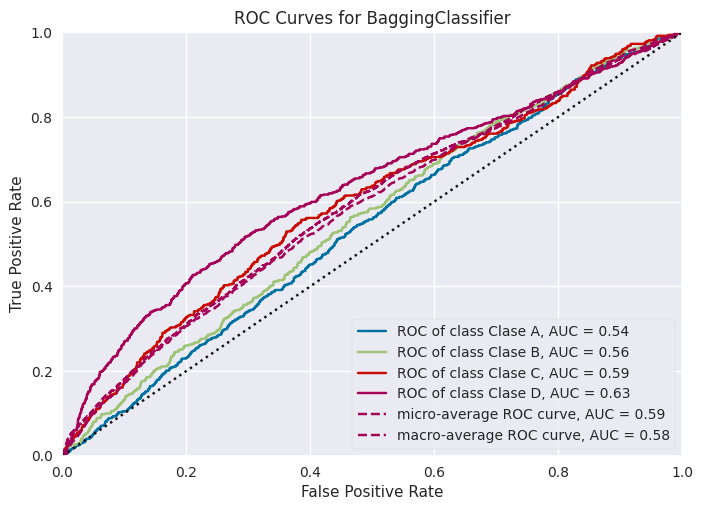

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for BaggingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'A': 'Clase A', 'B': 'Clase B', 'C': 'Clase C', 'D': 'Clase D'},
       estimator=BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=10,
                                                                         min_samples_leaf=4,
                                                                         min_samples_split=10),
                                   max_features=0.7, max_samples=0.6,
                                   n_estimators=200, n_jobs=2))

In [ ]:
plot_ROC_curve(bagging, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test)

De acuerdo con el grafico anterior podemos verificar el rendimiento de nuestro modelo Bagging Desition Tree para los datos de Test. El modelo tiene resultados más bajos que cuando se entrenó y en este caso parece que distingue bien a los clientes pertenecientes al segmento D y en general a los del C, pero le cuesta distinguir a los clientes que pertenecen al segmento A y B. De igual manera para los datos de prueba se supera el baseline que era del 28% y ahora es del 33%.

In [ ]:
model, metrics = classification_metrics(bagging, X_train, X_test, y_train, y_test)
pickle.dump(model, open('models/bagging.pkl', 'wb'))
pickle.dump(metrics, open('metrics/bagging.pkl', 'wb'))

Training Accuracy = 0.6347208374875374
Test Accuracy = 0.3387894937190712
Training Kappa = 0.5106918040099466
Test Kappa = 0.10789016201911572
Training Precision = [0.58 0.59 0.65 0.69]
Test Precision = [0.34 0.27 0.26 0.43]
Training recall = [0.62 0.46 0.63 0.79]
Test recall = [0.29 0.24 0.32 0.47]


## 2.5 Modelo Ensambles (Bagging KNeighbots)

In [ ]:
# Encontrar la mejor combinacion de parametros

model = BaggingClassifier(base_estimator = KNeighborsClassifier())
parameters = {'n_estimators' : [50,100,200],
              'max_samples': [0.5, 0.6, 0.7, 0.8],
              'max_features': [0.5, 0.6, 0.7, 0.8],
              'bootstrap': [False, True],
              'bootstrap_features' : [False, True]
             }

grid_search = GridSearchCV(estimator = model,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 5,
                           verbose=0)

grid_search.fit(X_train_split, y_train_split)

GridSearchCV(cv=5,
             estimator=BaggingClassifier(base_estimator=KNeighborsClassifier()),
             param_grid={'bootstrap': [False, True],
                         'bootstrap_features': [False, True],
                         'max_features': [0.5, 0.6, 0.7, 0.8],
                         'max_samples': [0.5, 0.6, 0.7, 0.8],
                         'n_estimators': [50, 100, 200]},
             scoring='accuracy')

In [ ]:
print(grid_search.best_params_)
print(grid_search.best_score_)

{'bootstrap': True, 'bootstrap_features': True, 'max_features': 0.5, 'max_samples': 0.5, 'n_estimators': 200}
0.5222554608746905


In [ ]:
np.random.seed(1234)
baggingKnn = BaggingClassifier(base_estimator = KNeighborsClassifier(),   # Por defecto un decision tree
                            n_estimators=200,          # Número de modelos a crear
                            max_samples=0.5,          # Número o % de registros de la muestra de aprendizaje
                            max_features=0.5,         # Número o % de atributos de la muestra de aprendizaje
                            bootstrap=True,           # Utilizar reemplazo en el muestreo de los registros de aprendizaje
                            bootstrap_features=False, # Utilizar reemplazo en el muestreo de los atributos de aprendizaje
                            oob_score=False,          # Evaluar cada modelo con los registros no utilizados en su aprendizaje
                            n_jobs=2,                 # Número de cores a utilizar
                            random_state=None,        # random seed para el generador aleatorio
                            verbose=0)                # controla la cantidad de información a reportar

baggingKnn.fit(X_train_split, y_train_split)
y_pred = baggingKnn.predict(X_test_split)
cm= confusion_matrix(y_test_split, y_pred)
print("Exactitud: ", accuracy_score(y_test_split, y_pred))
print("Kappa    : ", cohen_kappa_score(y_test_split, y_pred))

Exactitud:  0.5153654485049833
Kappa    :  0.3513146668734973


Reporte Entrenamiento
              precision    recall  f1-score   support

           A       0.64      0.63      0.63      1394
           B       0.69      0.40      0.50      1272
           C       0.60      0.74      0.66      1375
           D       0.69      0.81      0.75      1575

    accuracy                           0.65      5616
   macro avg       0.66      0.64      0.64      5616
weighted avg       0.66      0.65      0.64      5616



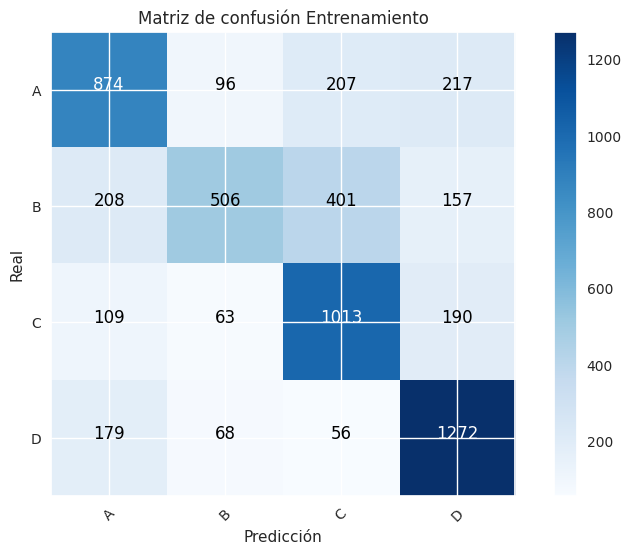

Reporte Prueba
              precision    recall  f1-score   support

           A       0.41      0.43      0.42       567
           B       0.42      0.19      0.26       582
           C       0.48      0.62      0.54       584
           D       0.63      0.74      0.68       675

    accuracy                           0.50      2408
   macro avg       0.48      0.49      0.47      2408
weighted avg       0.49      0.50      0.48      2408



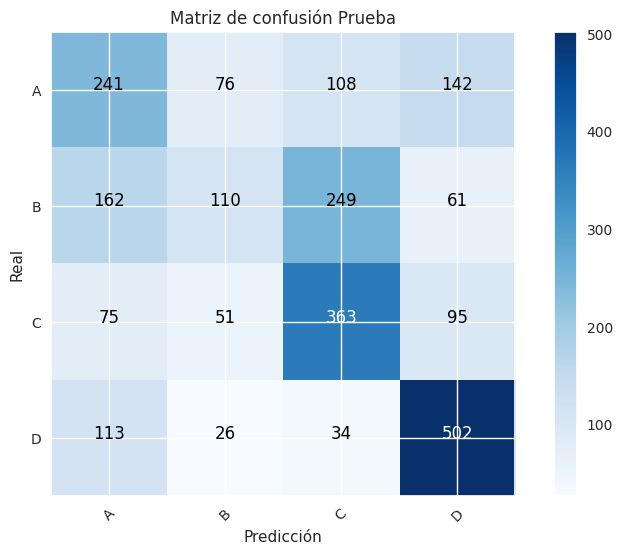

In [ ]:
report_and_conf_matrix(baggingKnn, X_train_split, X_test_split, y_train_split, y_test_split)

En la matriz de confusión anterior se puede detallar que el modelo Bagging KNeighbots tiene muy buenos resultados para los datos de entrenamiento, tiene un alto valor de precisión para cada uno de los segmentos al igual que su recall, para el segmento B de clientes sigue siendo el que presenta valores más bajos al igual que en modelo logístico, KNN, Arboles de decision y Bagging Decistion Tree.

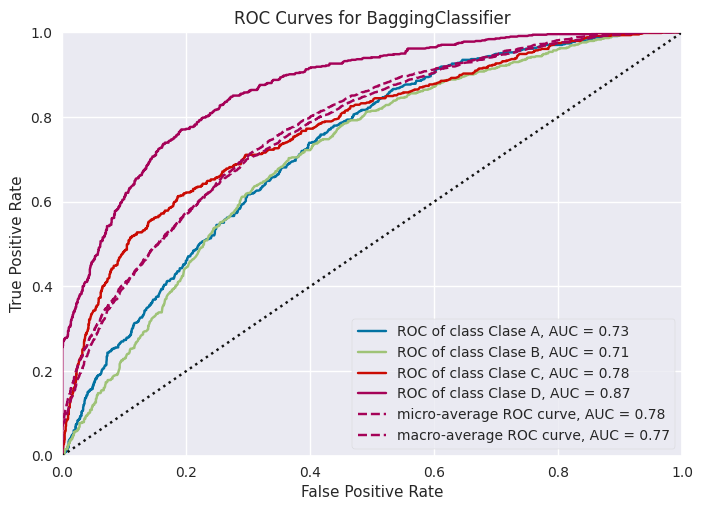

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for BaggingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'A': 'Clase A', 'B': 'Clase B', 'C': 'Clase C', 'D': 'Clase D'},
       estimator=BaggingClassifier(base_estimator=KNeighborsClassifier(),
                                   max_features=0.5, max_samples=0.5,
                                   n_estimators=200, n_jobs=2))

In [ ]:
plot_ROC_curve(baggingKnn, X_train=X_train_split, y_train=y_train_split, X_test=X_test_split, y_test=y_test_split)

Con la curva ROC se puede ver que el modelo distingue bastante bien para los datos de entrenamiento los segmentos de clientes D, C y A pero le cuesta un poco entre el segmento B, de igual manera son buenos resultados.

* Test

Implementaremos el modelo para revisar como son los resultados pasándole una base que nunca ha visto la cual es Test.

In [ ]:
baggingKnn.fit(X_train, y_train)
y_pred = baggingKnn.predict(X_test)
cm= confusion_matrix(y_test, y_pred)
print("Exactitud: ", accuracy_score(y_test, y_pred))
print("Kappa    : ", cohen_kappa_score(y_test, y_pred))

Exactitud:  0.3292729349067377
Kappa    :  0.1013916199949253


Reporte Entrenamiento
              precision    recall  f1-score   support

           A       0.62      0.62      0.62      1961
           B       0.66      0.45      0.53      1854
           C       0.62      0.70      0.66      1959
           D       0.69      0.80      0.74      2250

    accuracy                           0.65      8024
   macro avg       0.65      0.64      0.64      8024
weighted avg       0.65      0.65      0.64      8024



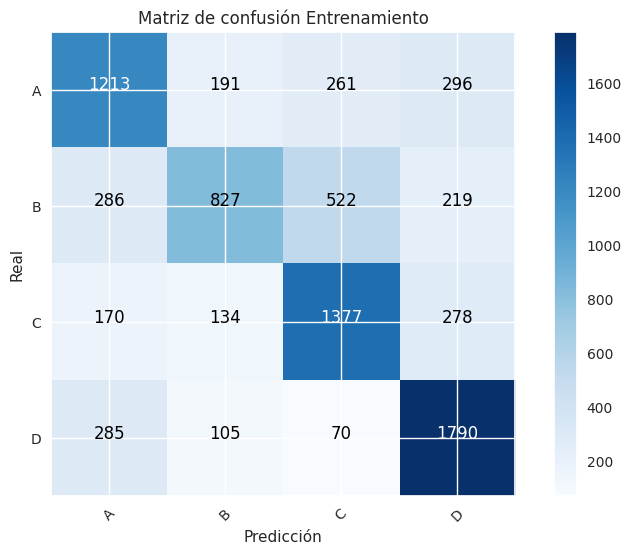

Reporte Prueba
              precision    recall  f1-score   support

           A       0.35      0.27      0.31       846
           B       0.25      0.18      0.21       550
           C       0.25      0.38      0.30       472
           D       0.43      0.48      0.46       759

    accuracy                           0.33      2627
   macro avg       0.32      0.33      0.32      2627
weighted avg       0.34      0.33      0.33      2627



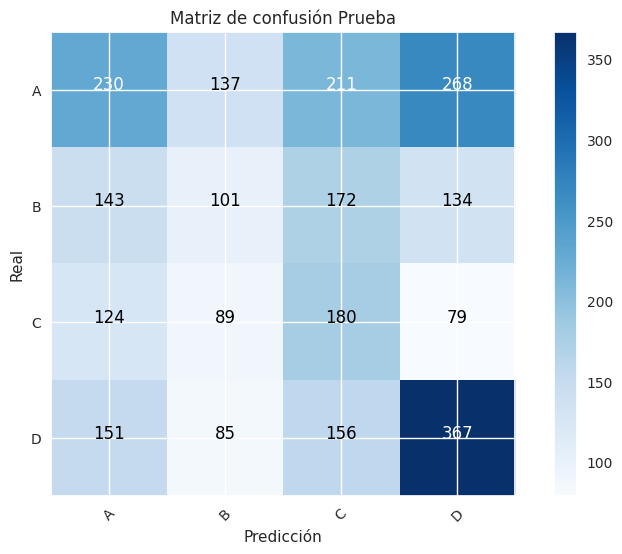

In [ ]:
report_and_conf_matrix(baggingKnn, X_train, X_test, y_train, y_test)

Con base en la matriz de confusión, se puede concluir que :

*   La precisión del modelo con los datos de entrenamiento fue del 65% aproximadamente. Por el contrario, con los datos de prueba, la precisión de este modelo fue de aproximadamente 33%.

*   El segmento D de clientes tuvo el porcentaje más alto de clasificación, aproximadamente el 43% de las predicciones, son realmente instancias de este segmento.

*   De todas las predicciones que el modelo hizo para el segmento A de clientes,  aproximadamente el 35% pertenecian realmente instancias de esta clase.

*   Para el segmento B y C de clientes, el modelo logró una clasificación aproximadamente del 25%


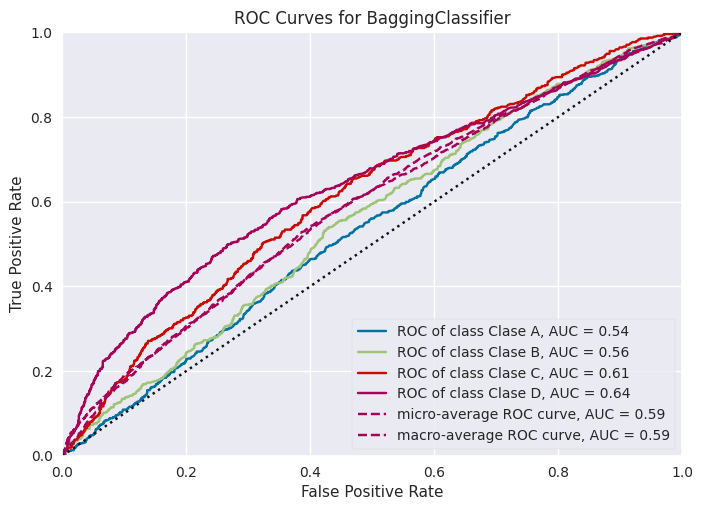

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for BaggingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'A': 'Clase A', 'B': 'Clase B', 'C': 'Clase C', 'D': 'Clase D'},
       estimator=BaggingClassifier(base_estimator=KNeighborsClassifier(),
                                   max_features=0.5, max_samples=0.5,
                                   n_estimators=200, n_jobs=2))

In [ ]:
plot_ROC_curve(baggingKnn, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test)

De acuerdo con el grafico anterior podemos verificar el rendimiento de nuestro modelo Bagging KNeighbots para los datos de Test. El modelo tiene resultados más bajos que cuando se entrenó y en este caso parece que distingue bien a los clientes pertenecientes al segmento D y en general a los del C, pero le cuesta distinguir a los clientes que pertenecen al segmento A y B. De igual manera para los datos de prueba se supera el baseline que era del 28% y ahora es del 33%.

In [ ]:
model, metrics = classification_metrics(baggingKnn, X_train, X_test, y_train, y_test)
pickle.dump(model, open('models/baggingKnn.pkl', 'wb'))
pickle.dump(metrics, open('metrics/baggingKnn.pkl', 'wb'))

Training Accuracy = 0.651296111665005
Test Accuracy = 0.32660829843928435
Training Kappa = 0.5325925148688329
Test Kappa = 0.09750752244888283
Training Precision = [0.62 0.67 0.62 0.69]
Test Precision = [0.34 0.24 0.24 0.43]
Training recall = [0.62 0.44 0.71 0.8 ]
Test recall = [0.25 0.18 0.38 0.48]


## Evaluación de los modelos

In [ ]:
metrics = list()
names = list()
metrics.append(pickle.load(open('metrics/modelo_logistic.pkl','rb')))
names.append('logisticRegressionMetrics')
metrics.append(pickle.load(open('metrics/classifier.pkl','rb')))
names.append('knnClassifierMetrics')
metrics.append(pickle.load(open('metrics/ctree.pkl','rb')))
names.append('decisionTreeMetrics')
metrics.append(pickle.load(open('metrics/bagging.pkl','rb')))
names.append('baggingMetrics')
metrics.append(pickle.load(open('metrics/baggingKnn.pkl','rb')))
names.append('baggingKnnMetrics')

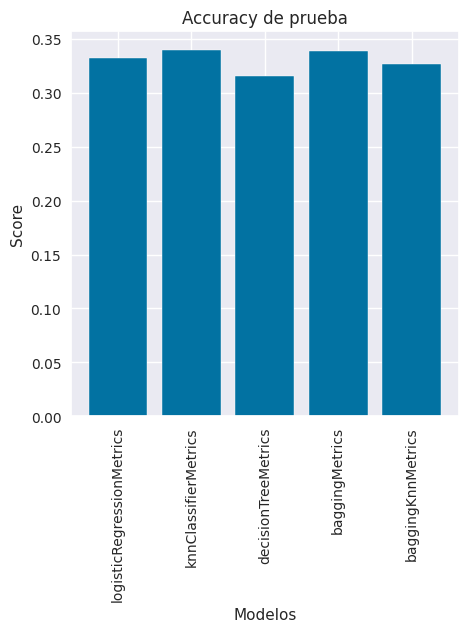

In [ ]:
# Diagrama de barras para observar el modelo más importante de acuerdo al Accuracy de prueba

fig, ax = plt.subplots()
fig.set_size_inches((5,5))
ax.bar(names, [i['Test Accuracy'] for i in metrics])
ax.set(title='Accuracy de prueba',xlabel='Modelos',ylabel='Score')
plt.xticks(rotation='vertical')
plt.show()

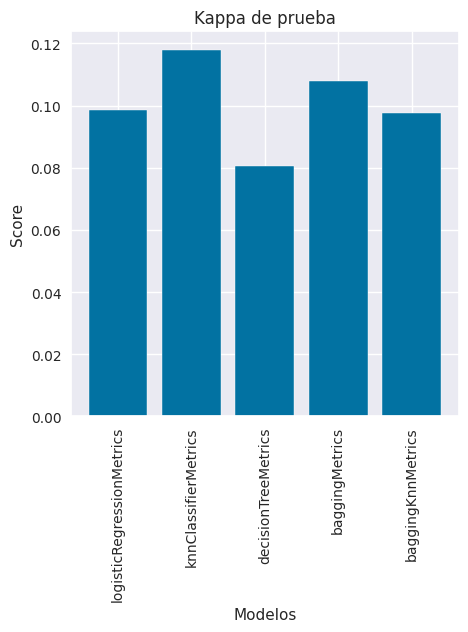

In [ ]:
# Diagrama de barras para observar el modelo más importante de acuerdo al Kappa de prueba

fig, ax = plt.subplots()
fig.set_size_inches((5,5))
ax.bar(names, [i['Test Kappa'] for i in metrics])
ax.set(title='Kappa de prueba',xlabel='Modelos',ylabel='Score')
plt.xticks(rotation='vertical')
plt.show()

In [ ]:
# Se organizan los modelos de acuerdo a su Accuracy de prueba

models = [(names[i],metrics[i]) for i in range(len(names))]
models = sorted(models,key=lambda x:x[1]['Test Accuracy'],reverse=True)
ranking = pd.DataFrame(columns=['Model','Test Accuracy'])
for model in models:
    ranking = ranking.append({'Model':model[0],'Test Accuracy':model[1]['Test Accuracy']},ignore_index=True)
ranking

,Model,Test Accuracy
0,knnClassifierMetrics,0.339931
1,baggingMetrics,0.338789
2,logisticRegressionMetrics,0.331938
3,baggingKnnMetrics,0.326608
4,decisionTreeMetrics,0.315569


In [ ]:
# Se organizan los modelos de acuerdo a su Kappa de prueba

models = [(names[i],metrics[i]) for i in range(len(names))]
models = sorted(models,key=lambda x:x[1]['Test Kappa'],reverse=True)
ranking = pd.DataFrame(columns=['Model','Test Kappa'])
for model in models:
    ranking = ranking.append({'Model':model[0],'Test Kappa':model[1]['Test Kappa']},ignore_index=True)
ranking

,Model,Test Kappa
0,knnClassifierMetrics,0.117997
1,baggingMetrics,0.107890
2,logisticRegressionMetrics,0.098703
3,baggingKnnMetrics,0.097508
4,decisionTreeMetrics,0.080498


Con se puede visualizar en los gráficos y tablas anteriores, si observamos tanto el accuracy como el Kappa, el modelo que mejor rendimiento tuvo para clasificar a los clientes en cada uno de sus segmentos fue el modelo KNN.

# 3. Reducción de dimensionalidad:

In [ ]:
data_encoder = data_train.copy()
columns_obj = data_encoder.select_dtypes('object').columns
for col in columns_obj:
  if(col != 'Segmentation'):
    data_encoder[col] = label_encoder.fit_transform(data_encoder[col])
data_encoder.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8024 entries, 0 to 8023
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ID               8024 non-null   int64  
 1   Gender           8024 non-null   int64  
 2   Ever_Married     8024 non-null   int64  
 3   Age              8024 non-null   int64  
 4   Graduated        8024 non-null   int64  
 5   Profession       8024 non-null   int64  
 6   Work_Experience  7199 non-null   float64
 7   Spending_Score   8024 non-null   int64  
 8   Family_Size      7689 non-null   float64
 9   Var_1            8024 non-null   int64  
 10  Segmentation     8024 non-null   object 
dtypes: float64(2), int64(8), object(1)
memory usage: 689.7+ KB


In [ ]:
data_encoder.drop('ID',axis=1, inplace=True)

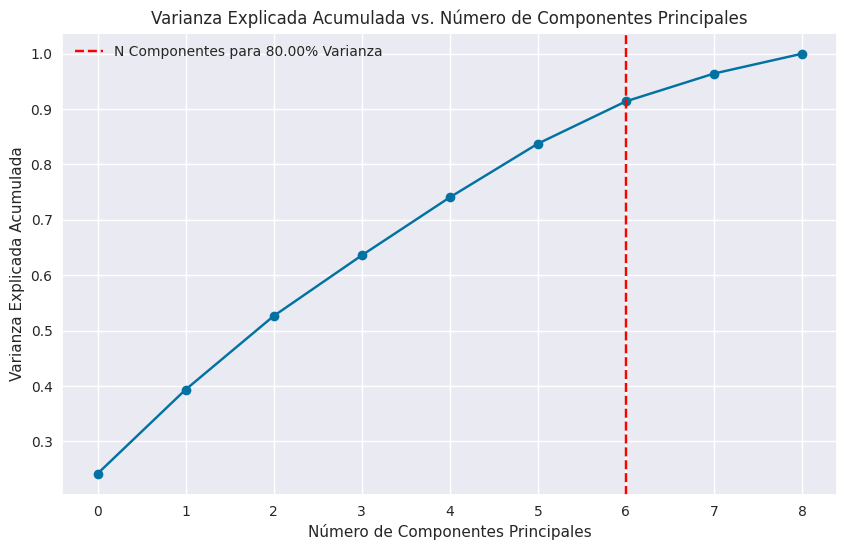

Número de componentes para alcanzar 80.0 % de varianza explicada: 6


In [ ]:
X_train,y_train = obtain_X_y(data_encoder)
numericas = X_train.select_dtypes('number').columns
numeric_transformer = Pipeline(
    steps=[("imputer",  SimpleImputer(strategy='mean')),
           ("scaler", StandardScaler()),
           ("select_var", VarianceThreshold(0.1))
          ]
)

X_scaled = numeric_transformer.fit_transform(data_encoder[numericas])

# Inicializar el modelo PCA
pca = PCA()

pca.fit(X_scaled)

# Varianza explicada acumulada
explained_variance_ratio_cumulative = np.cumsum(pca.explained_variance_ratio_)

# Encuentra el número de componentes para alcanzar un porcentaje de varianza explicada deseado
target_variance = 0.80

n_components_to_reach_variance = np.argmax(explained_variance_ratio_cumulative >= target_variance) + 1

# Graficar la varianza explicada acumulada
plt.figure(figsize=(10, 6))
plt.plot(explained_variance_ratio_cumulative, marker='o')
plt.axvline(n_components_to_reach_variance, color='red', linestyle='--', label=f'N Componentes para {target_variance*100:.2f}% Varianza')
plt.xlabel('Número de Componentes Principales')
plt.ylabel('Varianza Explicada Acumulada')
plt.title('Varianza Explicada Acumulada vs. Número de Componentes Principales')
plt.legend()
plt.grid(True)
plt.show()

print('Número de componentes para alcanzar', target_variance*100, '% de varianza explicada:', n_components_to_reach_variance)

In [ ]:
pca.explained_variance_ratio_

array([0.24, 0.15, 0.13, 0.11, 0.1 , 0.1 , 0.08, 0.05, 0.04])

In [ ]:
max_value = max(pca.explained_variance_ratio_)
explained_list = pca.explained_variance_ratio_.tolist()
index = explained_list.index(max_value)
print(max_value)
print(index)

0.24154400578452595
0


In [ ]:
var_exp=pca.explained_variance_ratio_ # varianza explicada por cada PC
cum_var_exp = np.cumsum(var_exp) # varianza acumulada por los primeros n PCs
var_exp

array([0.24, 0.15, 0.13, 0.11, 0.1 , 0.1 , 0.08, 0.05, 0.04])

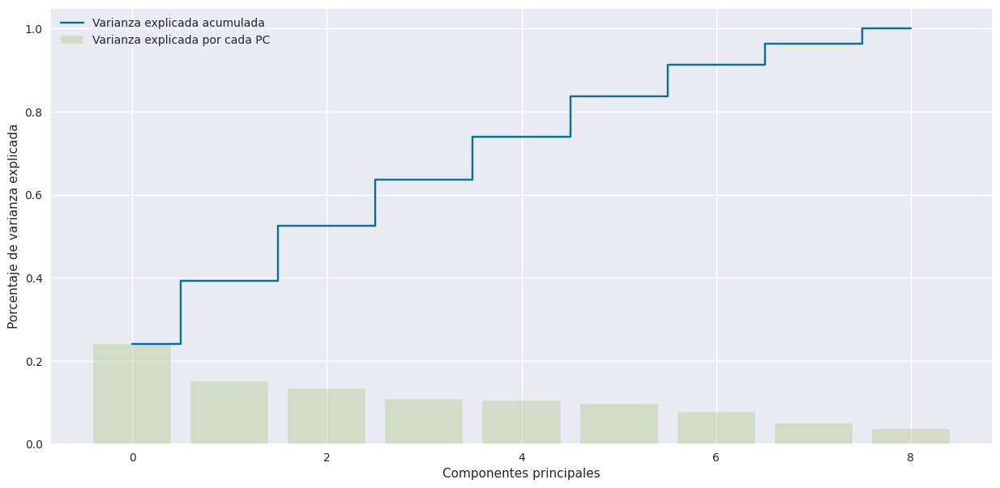

In [ ]:
plt.figure(figsize=(15, 7))
plt.bar(range(len(var_exp)), var_exp, alpha=0.3333, align='center', label='Varianza explicada por cada PC', color = 'g')
plt.step(range(len(cum_var_exp)), cum_var_exp, where='mid',label='Varianza explicada acumulada')
plt.ylabel('Porcentaje de varianza explicada')
plt.xlabel('Componentes principales')
plt.legend(loc='best')
plt.show()

In [ ]:
np.sum(pca.explained_variance_ratio_[0:6])

0.8375641877074531

Encontramos que los primeros 6 componentes conservan aproximadamente el 83.7% de la información original.

In [ ]:
numeric_transformer = Pipeline(
    steps=[("imputer",  SimpleImputer(strategy='mean')),
           ("scaler", StandardScaler())
          ]
)

dataStd = numeric_transformer.fit_transform(data_encoder[numericas])
dataStd = pd.DataFrame(dataStd)

In [ ]:
dataPca = pca.transform(dataStd.iloc[:, 0:9])

Escogemos los 6 primeros componentes principales de acuerdo al proceso anterior

In [ ]:
dataPca = dataPca[:,0:6]

In [ ]:
def biplot(data, loadings, index1, index2, labels=None):
    plt.figure(figsize=(15, 7))
    xs = data[:,index1]
    ys = data[:,index2]
    n=loadings.shape[0]
    scalex = 1.0/(xs.max()- xs.min())
    scaley = 1.0/(ys.max()- ys.min())
    plt.scatter(xs*scalex,ys*scaley)
    for i in range(n):
        plt.arrow(0, 0, loadings[i,index1], loadings[i,index2],color='r',alpha=0.5)
        if labels is None:
            plt.text(loadings[i,index1]* 1.15, loadings[i,index2] * 1.15, "Var"+str(i+1), color='g', ha='center', va='center')
        else:
            plt.text(loadings[i,index1]* 1.15, loadings[i,index2] * 1.15, labels[i], color='g', ha='center', va='center')
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.xlabel("PC{}".format(index1+1))
    plt.ylabel("PC{}".format(index2+1))
    plt.grid()

* Componente 1 y 2

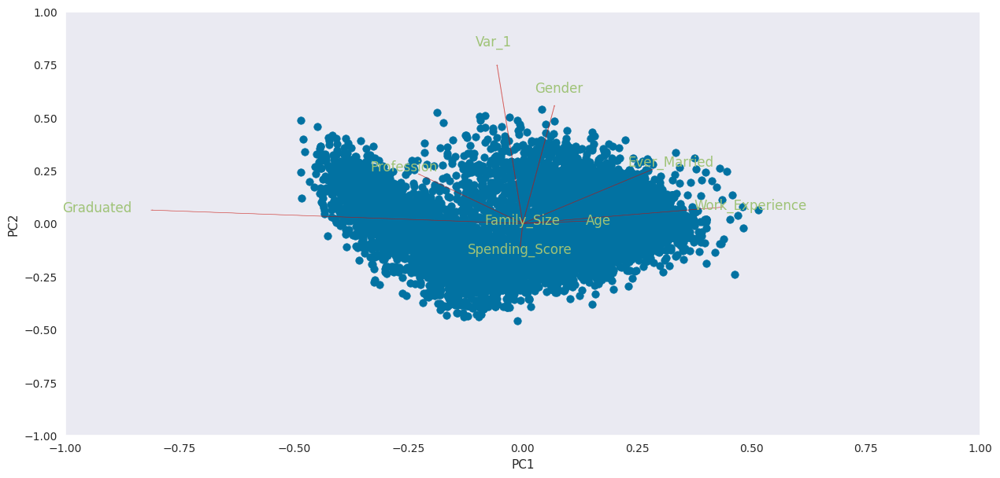

In [ ]:
biplot(dataPca, pca.components_, 0, 1, numericas)

De acuerdo a la gráfica, el componente PC1 representa positivamente las variables Work_Experience, Ever_Married, Age y Gender en su sentido positivo, y negativamente las variables Graduated y Profession. Las variables Family_size, Spending_Score y Var_1 no tienen mayor incidencia.

El componente PC2 representa positivamente las variables Ever_Married, Gender, Profession y Var_1, y negativamente Spending_score

* Componente 1 y 3

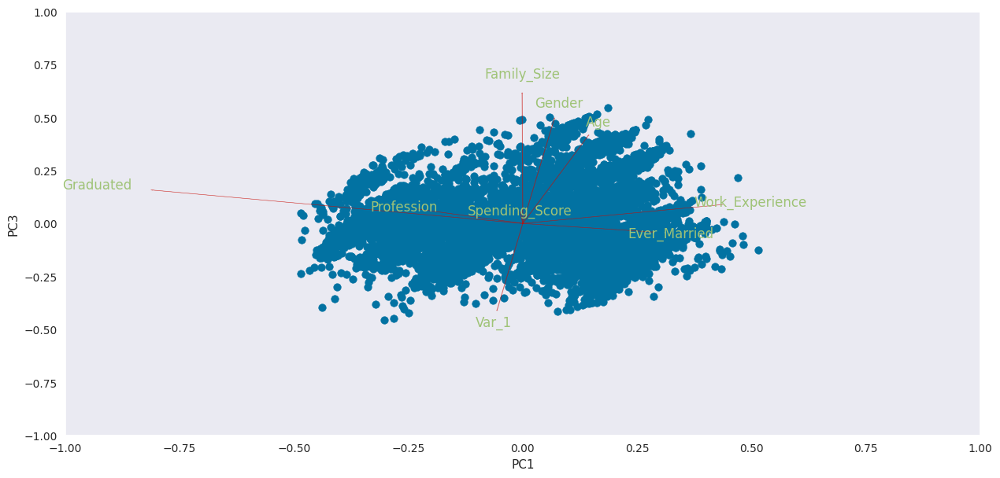

In [ ]:
biplot(dataPca, pca.components_, 0, 2, numericas)

De acuerdo a la gráfica, el componente PC3 representa positivamente las variables Family_Size, Graduated, Age, Gender, Profession y Work_Experience en su sentido positivo, y negativamente las variables Ever_Married, y Var_1. La variable Spending_Score no tiene mayor incidencia.

* Componente 1 y 4

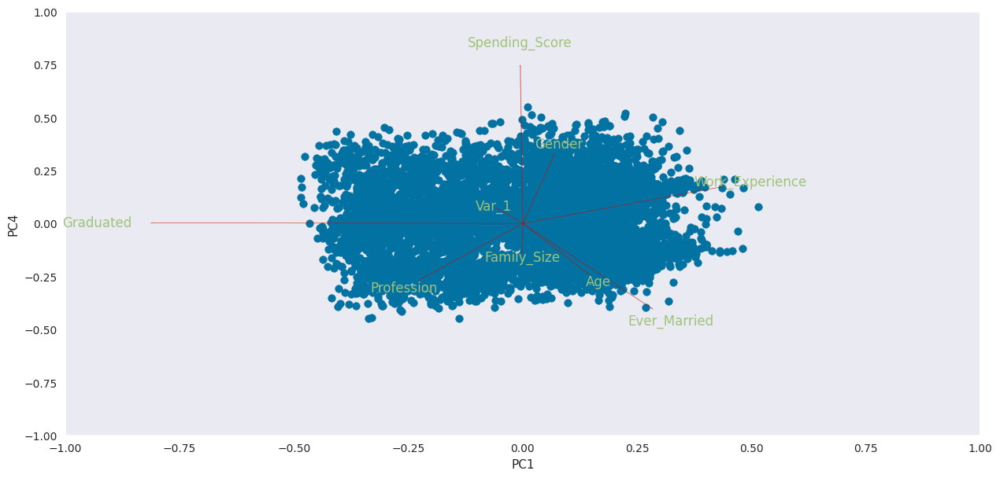

In [ ]:
biplot(dataPca, pca.components_, 0, 3, numericas)

De acuerdo a la gráfica, el componente PC4 representa positivamente las variables Spending_Score, Gender y Work_Experience en su sentido positivo, y negativamente las variables Family_size, Age, Ever_Married, Profession. Las variables Graduated y Var_1 no tienen mayor incidencia.

* Componente 1 y 5

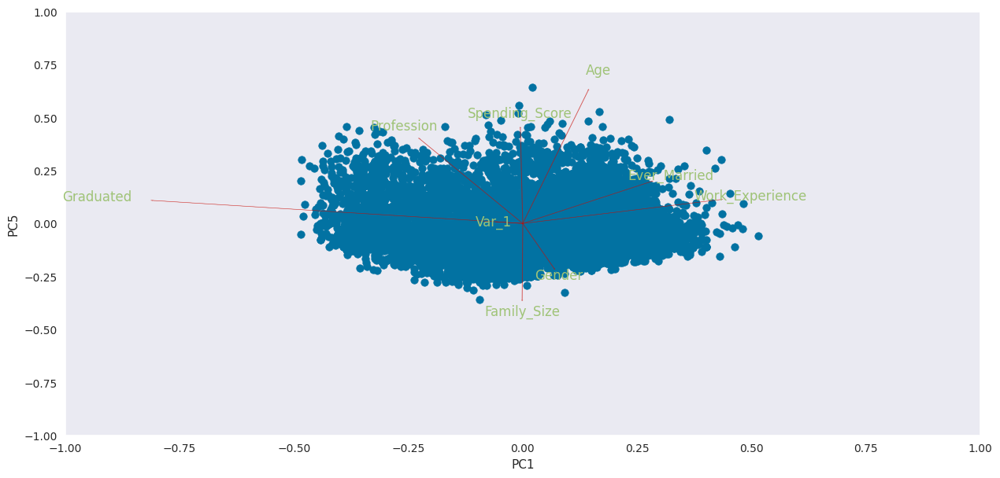

In [ ]:
biplot(dataPca, pca.components_, 0, 4, numericas)

De acuerdo a la gráfica, el componente PC5 representa positivamente las variables Spending_Score, Profession, Age y Ever_Married en su sentido positivo, y negativamente las variables Family_size y Gender. Las variables Graduated, Work_Experience y Var_1 no tienen mayor incidencia.

* Componente 1 y 6

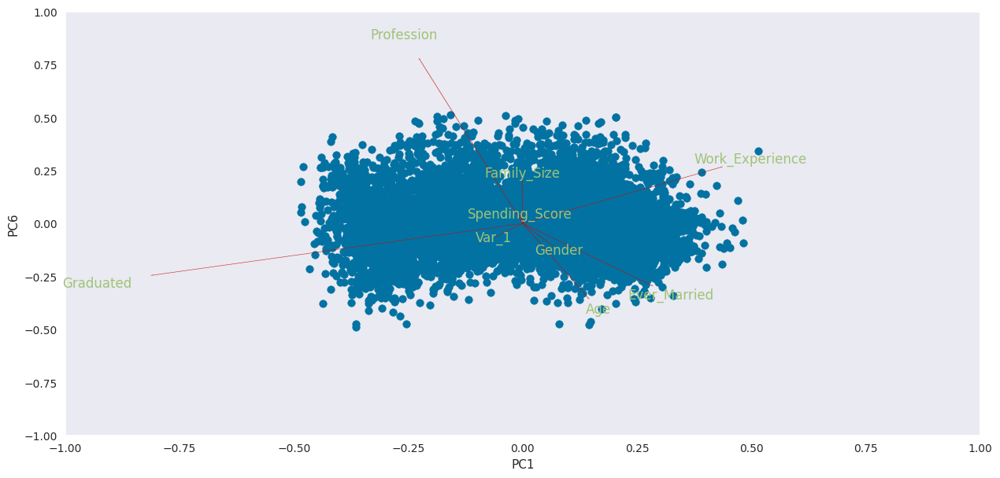

In [ ]:
biplot(dataPca, pca.components_, 0, 5, numericas)

De acuerdo a la gráfica, el componente PC6 representa positivamente las variables Profession y Work_Experienceen su sentido positivo, y negativamente las variables Age, Ever_Married, Graduated y Gender. Las variables Spending_Score, Family_size y Var_1 no tienen mayor incidencia.

In [ ]:
pca.components_

array([[ 0.07,  0.55,  0.49,  0.33, -0.21, -0.11, -0.47, -0.18,  0.17],
       [ 0.28,  0.25, -0.04, -0.4 ,  0.2 , -0.29, -0.35,  0.59, -0.31],
       [ 0.14,  0.01,  0.41, -0.24,  0.63, -0.35,  0.3 , -0.29,  0.23],
       [-0.81,  0.06,  0.16,  0.  ,  0.11, -0.24, -0.02, -0.06, -0.49],
       [-0.23,  0.23,  0.07, -0.27,  0.4 ,  0.78, -0.2 ,  0.03,  0.13],
       [ 0.43,  0.08,  0.09,  0.17,  0.11,  0.27,  0.12, -0.34, -0.74],
       [-0.01, -0.11,  0.05,  0.74,  0.45,  0.04,  0.06,  0.47,  0.04],
       [-0.  ,  0.01,  0.61, -0.14, -0.36,  0.21,  0.5 ,  0.43, -0.06],
       [-0.06,  0.74, -0.41,  0.07,  0.01, -0.06,  0.51,  0.03,  0.06]])

In [ ]:
dataPca = pd.DataFrame(dataPca)
dataPca.columns=['PC1', 'PC2', 'PC3','PC4','PC5','PC6']

In [ ]:
kmeans = KMeans(n_clusters=3, random_state=0, n_init=10)
kmeans.fit(dataPca)
clusters = kmeans.labels_

In [ ]:
dataPca['Cluster']= clusters
counter=Counter(clusters)
print("La distribución de los 3 clusters es: ", counter)

La distribución de los 3 clusters es:  Counter({0: 3925, 1: 2130, 2: 1969})


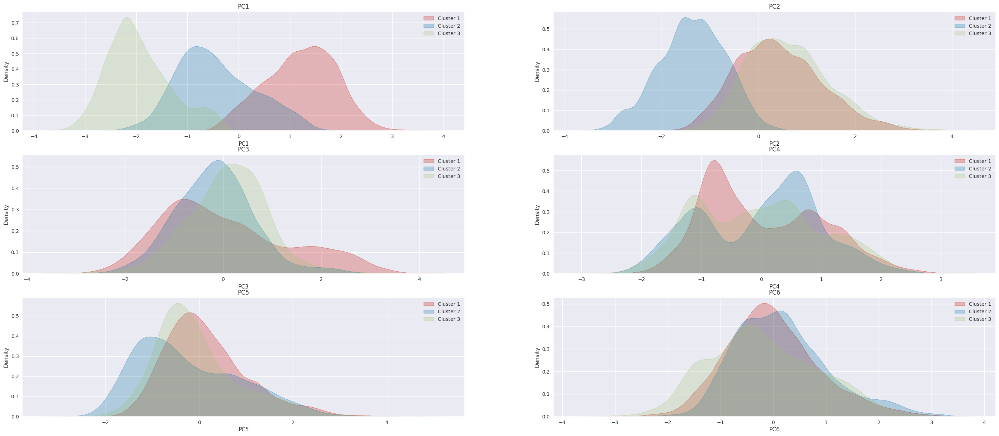

In [ ]:
fig = plt.figure(figsize=(35,25))
i=1
for var in dataPca.columns[0:6]:
    ax = fig.add_subplot(math.ceil(len(numericas)/2), 2, i)
    sns.kdeplot(dataPca.loc[dataPca.Cluster==0][var], shade=True, color='r', ax=ax);
    sns.kdeplot(dataPca.loc[dataPca.Cluster==1][var], shade=True, color='b', ax=ax);
    sns.kdeplot(dataPca.loc[dataPca.Cluster==2][var], shade=True, color='g', ax=ax);
    plt.title(var)
    plt.legend(['Cluster 1', 'Cluster 2', 'Cluster 3'])
    i+=1

Podemos observar que para k=3, PC1 separa bien  2 clusters representando  positivamente las variables Work_Experience, Ever_Married, Age y Gender en su sentido positivo, y negativamente las variables Graduated y Profession.

PC2 sirve para distinguir el cluster azul.

Por el contrario, para PC3, PC4, PC5 y PC6 los clusters no se pueden separar directamente de los demás.


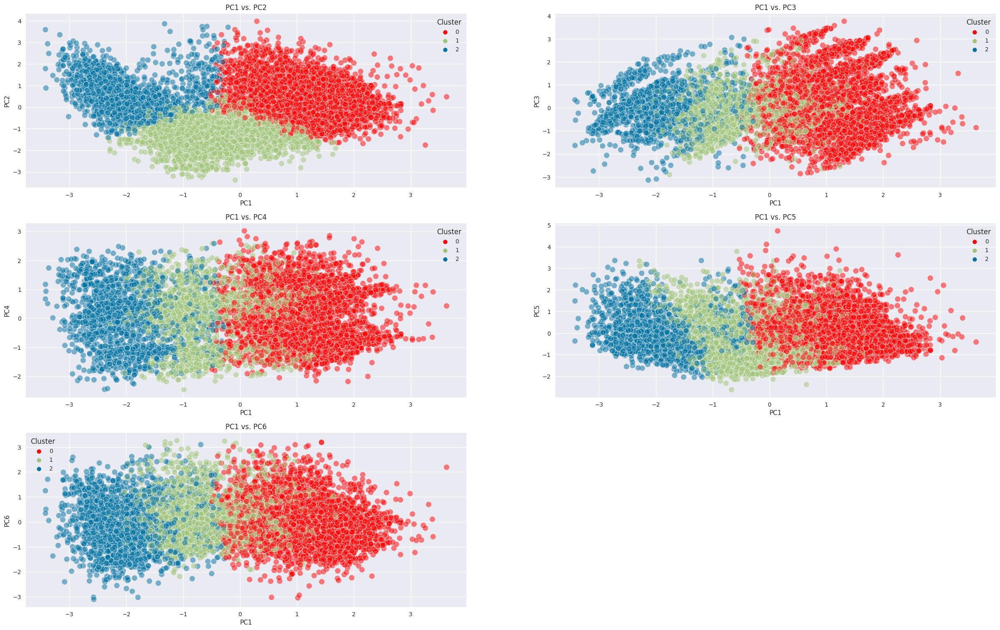

In [ ]:
fig = plt.figure(figsize=(30,25))
colorPalette = ['red', 'g', 'b', 'y', 'darkorange','black','purple']
ax = fig.add_subplot(4, 2, 1)
sns.scatterplot(x="PC1", y="PC2", hue="Cluster", data=dataPca, ax=ax, palette=colorPalette, s=100, alpha=0.5)
plt.title("PC1 vs. PC2")
ax = fig.add_subplot(4, 2, 2)
sns.scatterplot(x="PC1", y="PC3", hue="Cluster", data=dataPca, ax=ax, palette=colorPalette, s=100, alpha=0.5)
plt.title("PC1 vs. PC3")
ax = fig.add_subplot(4, 2, 3)
sns.scatterplot(x="PC1", y="PC4", hue="Cluster", data=dataPca, ax=ax, palette=colorPalette, s=100, alpha=0.5)
plt.title("PC1 vs. PC4")
ax = fig.add_subplot(4, 2, 4)
sns.scatterplot(x="PC1", y="PC5", hue="Cluster", data=dataPca, ax=ax, palette=colorPalette, s=100, alpha=0.5)
plt.title("PC1 vs. PC5")
ax = fig.add_subplot(4, 2, 5)
sns.scatterplot(x="PC1", y="PC6", hue="Cluster", data=dataPca, ax=ax, palette=colorPalette, s=100, alpha=0.5)
plt.title("PC1 vs. PC6")
plt.show()

Podemos observar que con K=3 en mejor plot para distinguir los clusters es el plot de PC1 vs PC2 donde PC1 representa positivamente las variables Work_Experience, Ever_Married, Age y Gender en su sentido positivo, y negativamente las variables Graduated y Profession; y el componente PC2 representa positivamente las variables Ever_Married, Gender, Profession y Var_1, y negativamente Spending_score

# 4. Caracterización de los clientes por segmento con PCA:

**Escogencia del K**

* Codo

In [ ]:
kmeans.inertia_
kmeans.init

'k-means++'

In [ ]:
WSSs = []
for i in range(1,5) :
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(dataPca)
    WSSs.append(km.inertia_)
WSSs

[65902.72381417739, 48055.8326150512, 40946.86083091421, 35749.50519138886]

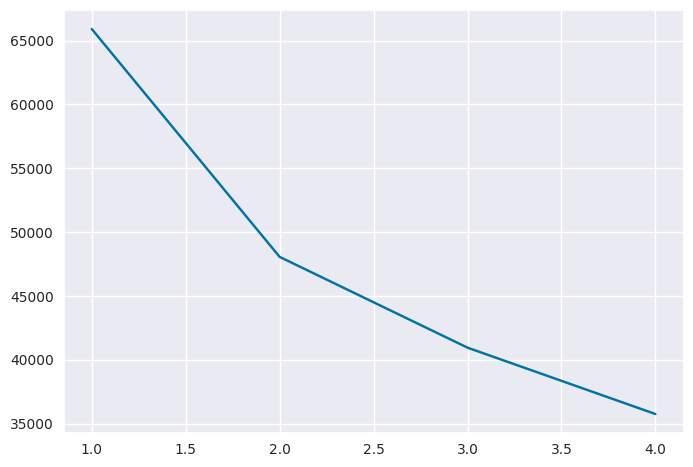

In [ ]:
plt.plot(range(1, 5), WSSs)

De acuerdo a la gráfica, con un K= 2 encontramos aproximadamente el codo.

* Silueta

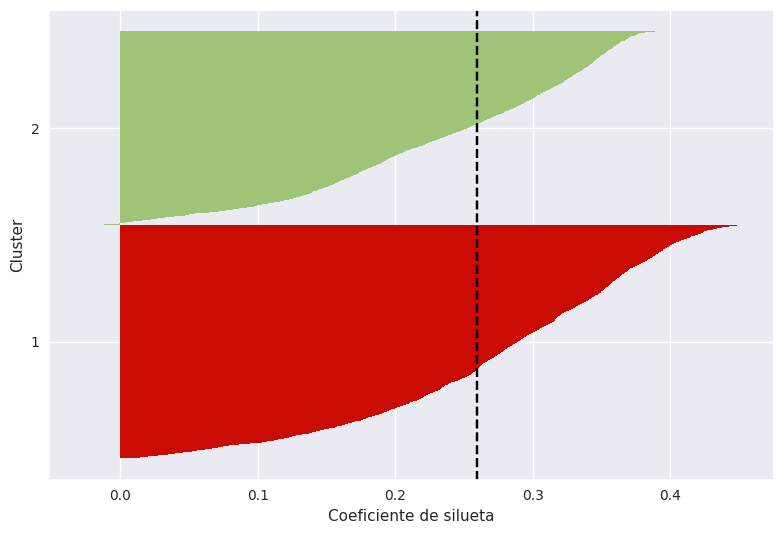

In [ ]:
k=2
kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
kmeans.fit(dataPca)
y_clusters = kmeans.labels_
cluster_labels = np.unique(y_clusters)

silueta_puntos= silhouette_samples(dataPca, y_clusters, metric='euclidean')

y_ax_lower, y_ax_upper = 0, 0
yticks = []
colores = ['r', 'g', 'b', 'y', 'o']
for i, c in enumerate(cluster_labels):
    silueta_puntos_c = silueta_puntos[y_clusters == c]
    silueta_puntos_c.sort()
    y_ax_upper += len(silueta_puntos_c)
    color = colores[i]
    plt.barh(range(y_ax_lower, y_ax_upper), silueta_puntos_c, height=1.0,
             edgecolor='none', color=color)

    yticks.append((y_ax_lower + y_ax_upper) / 2.)
    y_ax_lower += len(silueta_puntos_c)

silueta_promedio = np.mean(silueta_puntos)
plt.axvline(silueta_promedio, color="black", linestyle="--")

plt.yticks(yticks, cluster_labels + 1)
plt.ylabel('Cluster')
plt.xlabel('Coeficiente de silueta')

plt.tight_layout()
plt.show()

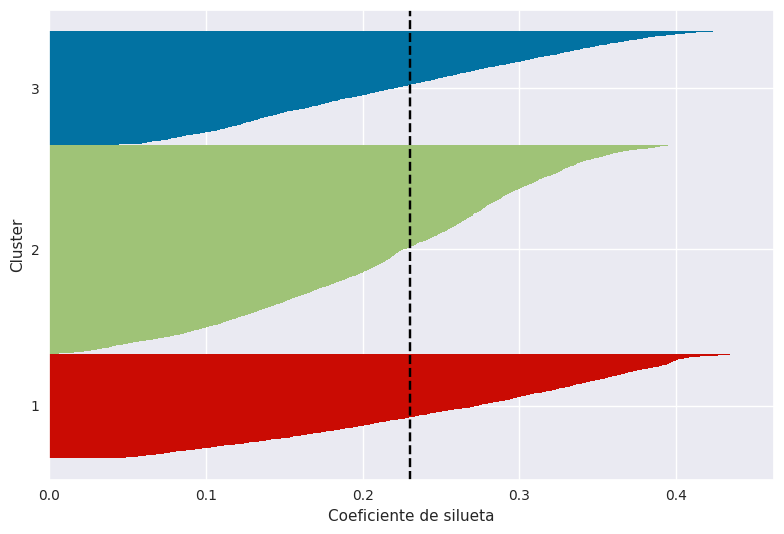

In [ ]:
k=3
kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
kmeans.fit(dataPca)
y_clusters = kmeans.labels_
cluster_labels = np.unique(y_clusters)

silueta_puntos= silhouette_samples(dataPca, y_clusters, metric='euclidean')

y_ax_lower, y_ax_upper = 0, 0
yticks = []
colores = ['r', 'g', 'b', 'y', 'o']
for i, c in enumerate(cluster_labels):
    silueta_puntos_c = silueta_puntos[y_clusters == c]
    silueta_puntos_c.sort()
    y_ax_upper += len(silueta_puntos_c)
    color = colores[i]
    plt.barh(range(y_ax_lower, y_ax_upper), silueta_puntos_c, height=1.0,
             edgecolor='none', color=color)

    yticks.append((y_ax_lower + y_ax_upper) / 2.)
    y_ax_lower += len(silueta_puntos_c)

silueta_promedio = np.mean(silueta_puntos)
plt.axvline(silueta_promedio, color="black", linestyle="--")

plt.yticks(yticks, cluster_labels + 1)
plt.ylabel('Cluster')
plt.xlabel('Coeficiente de silueta')

plt.tight_layout()

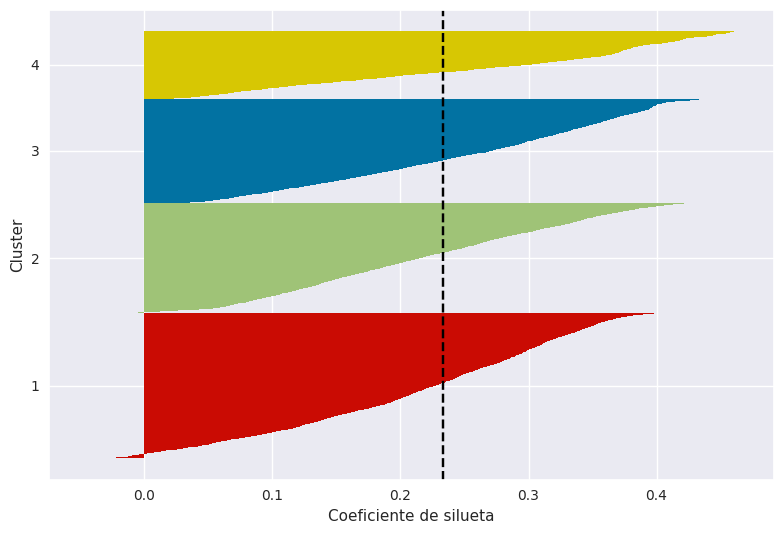

In [ ]:
k=4
kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
kmeans.fit(dataPca)
y_clusters = kmeans.labels_
cluster_labels = np.unique(y_clusters)

silueta_puntos= silhouette_samples(dataPca, y_clusters, metric='euclidean')

y_ax_lower, y_ax_upper = 0, 0
yticks = []
colores = ['r', 'g', 'b', 'y', 'o']
for i, c in enumerate(cluster_labels):
    silueta_puntos_c = silueta_puntos[y_clusters == c]
    silueta_puntos_c.sort()
    y_ax_upper += len(silueta_puntos_c)
    color = colores[i]
    plt.barh(range(y_ax_lower, y_ax_upper), silueta_puntos_c, height=1.0,
             edgecolor='none', color=color)

    yticks.append((y_ax_lower + y_ax_upper) / 2.)
    y_ax_lower += len(silueta_puntos_c)

silueta_promedio = np.mean(silueta_puntos)
plt.axvline(silueta_promedio, color="black", linestyle="--")

plt.yticks(yticks, cluster_labels + 1)
plt.ylabel('Cluster')
plt.xlabel('Coeficiente de silueta')

plt.tight_layout()

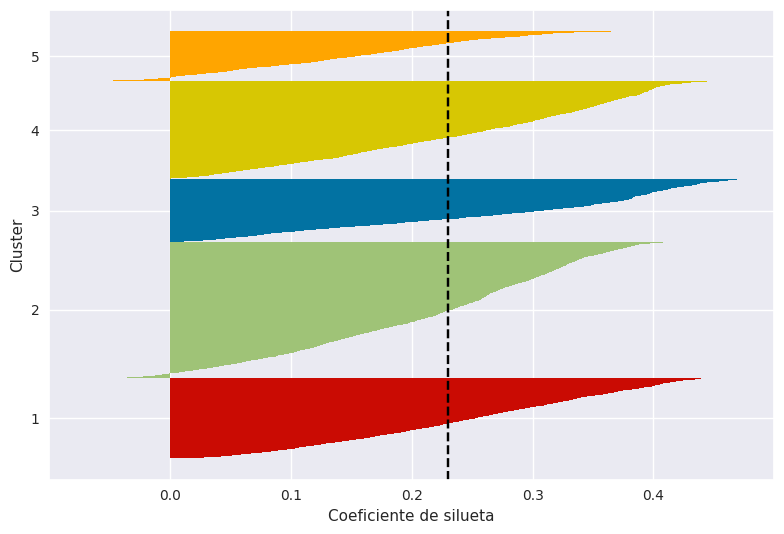

In [ ]:
k=5
kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
kmeans.fit(dataPca)
y_clusters = kmeans.labels_
cluster_labels = np.unique(y_clusters)

silueta_puntos= silhouette_samples(dataPca, y_clusters, metric='euclidean')

y_ax_lower, y_ax_upper = 0, 0
yticks = []
colores = ['r', 'g', 'b', 'y', 'orange']
for i, c in enumerate(cluster_labels):
    silueta_puntos_c = silueta_puntos[y_clusters == c]
    silueta_puntos_c.sort()
    y_ax_upper += len(silueta_puntos_c)
    color = colores[i]
    plt.barh(range(y_ax_lower, y_ax_upper), silueta_puntos_c, height=1.0,
             edgecolor='none', color=color)

    yticks.append((y_ax_lower + y_ax_upper) / 2.)
    y_ax_lower += len(silueta_puntos_c)

silueta_promedio = np.mean(silueta_puntos)
plt.axvline(silueta_promedio, color="black", linestyle="--")

plt.yticks(yticks, cluster_labels + 1)
plt.ylabel('Cluster')
plt.xlabel('Coeficiente de silueta')

plt.tight_layout()

De acuerdo a los 4 gráficos, el coeficiente de silueta máximo es cuando k = 2

In [ ]:
CHs = []
for i in range(2,5) :
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(dataPca)
    CH = calinski_harabasz_score(dataPca, km.labels_)
    CHs.append(CH)
CHs

[2979.203677445326, 2444.2774479750624, 2254.8466826997637]

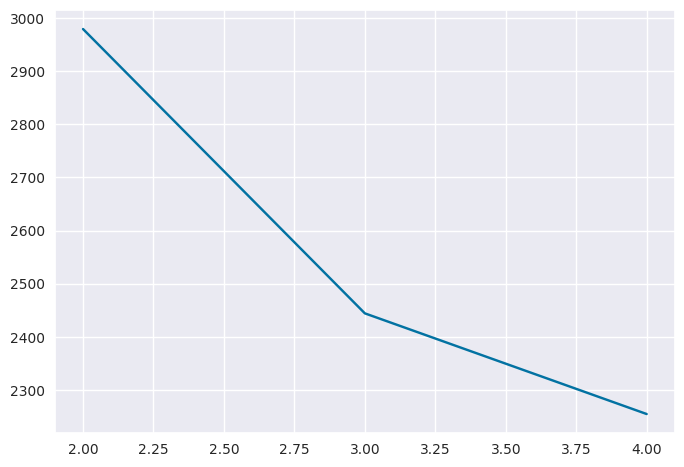

In [ ]:
plt.plot(range(2, 5), CHs)

In [ ]:
kmeans = KMeans(n_clusters=2, random_state=0, n_init=10)
kmeans.fit(dataPca)
clusters = kmeans.labels_

In [ ]:
dataPca['Cluster']= clusters
counter=Counter(clusters)
print(counter)

Counter({0: 4382, 1: 3642})


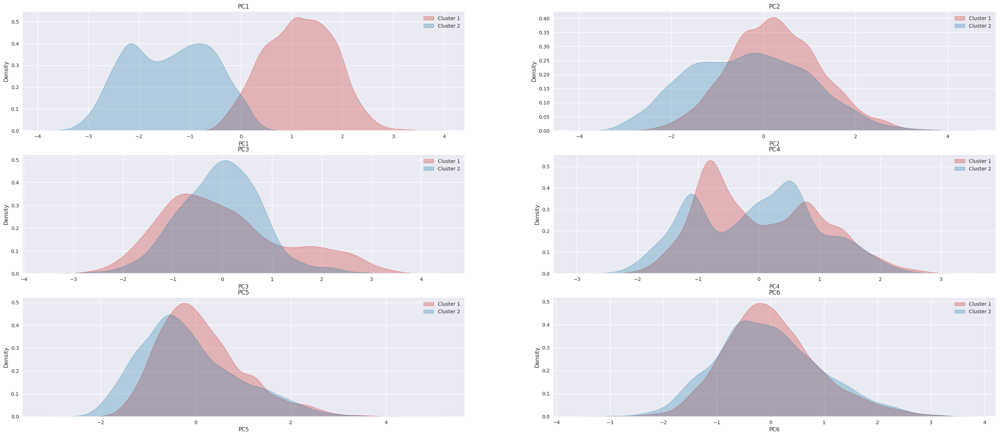

In [ ]:
fig = plt.figure(figsize=(35,25))
i=1
for var in dataPca.columns[0:6]:
    ax = fig.add_subplot(math.ceil(len(numericas)/2), 2, i)
    sns.kdeplot(dataPca.loc[dataPca.Cluster==0][var], shade=True, color='r', ax=ax);
    sns.kdeplot(dataPca.loc[dataPca.Cluster==1][var], shade=True, color='b', ax=ax);
    plt.title(var)
    plt.legend(['Cluster 1', 'Cluster 2'])
    i+=1

De acuerdo al gráfico anterior se puede concluir que con el k = 2, el componente principal que distingue la separación de ambos clusters es PC1
el cual representa positivamente las variables Work_Experience, Ever_Married, Age y Gender en su sentido positivo, y negativamente las variables Graduated y Profession.

Entendemos que la segmentación original consta de 4 categorías. Sin embargo, después de realizar una validación para determinar el mejor valor de k, se concluyó que 2 es la opción más adecuada. Por lo tanto, proponemos agrupar las categorías A y B en el Cluster 1, y las categorías C y D en el Cluster 2. Este enfoque simplificado facilitará el análisis de segmentación de clientes con dos grupos más amplios.

# 4. Caracterización de los clientes por segmento sin PCA:

In [ ]:
df_merge = pd.concat([df_imputed,df_imputed_test])
df_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10651 entries, 0 to 2626
Data columns (total 29 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       10651 non-null  float64
 1   Work_Experience           10651 non-null  float64
 2   Family_Size               10651 non-null  float64
 3   Segmentation              10651 non-null  object 
 4   Gender_Female             10651 non-null  float64
 5   Gender_Male               10651 non-null  float64
 6   Ever_Married_No           10651 non-null  float64
 7   Ever_Married_Yes          10651 non-null  float64
 8   Graduated_No              10651 non-null  float64
 9   Graduated_Yes             10651 non-null  float64
 10  Profession_Artist         10651 non-null  float64
 11  Profession_Doctor         10651 non-null  float64
 12  Profession_Engineer       10651 non-null  float64
 13  Profession_Entertainment  10651 non-null  float64
 14  Profess

In [ ]:
df_merge['Segmentation'] = encoder.fit_transform(df_merge['Segmentation'])
df_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10651 entries, 0 to 2626
Data columns (total 29 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       10651 non-null  float64
 1   Work_Experience           10651 non-null  float64
 2   Family_Size               10651 non-null  float64
 3   Segmentation              10651 non-null  int64  
 4   Gender_Female             10651 non-null  float64
 5   Gender_Male               10651 non-null  float64
 6   Ever_Married_No           10651 non-null  float64
 7   Ever_Married_Yes          10651 non-null  float64
 8   Graduated_No              10651 non-null  float64
 9   Graduated_Yes             10651 non-null  float64
 10  Profession_Artist         10651 non-null  float64
 11  Profession_Doctor         10651 non-null  float64
 12  Profession_Engineer       10651 non-null  float64
 13  Profession_Entertainment  10651 non-null  float64
 14  Profess

In [ ]:
columns_merge = df_merge.columns
scaler = StandardScaler()
df_merge_std = scaler.fit_transform(df_merge)
df_merge_std = pd.DataFrame(df_merge_std,columns=columns_merge)

In [ ]:
df_merge_std.describe()

,Age,Work_Experience,Family_Size,Segmentation,Gender_Female,Gender_Male,Ever_Married_No,Ever_Married_Yes,Graduated_No,Graduated_Yes,...,Spending_Score_Average,Spending_Score_High,Spending_Score_Low,Var_1_Cat_1,Var_1_Cat_2,Var_1_Cat_3,Var_1_Cat_4,Var_1_Cat_5,Var_1_Cat_6,Var_1_Cat_7
count,1.065100e+04,1.065100e+04,1.065100e+04,1.065100e+04,1.065100e+04,1.065100e+04,1.065100e+04,1.065100e+04,1.065100e+04,1.065100e+04,...,1.065100e+04,1.065100e+04,1.065100e+04,1.065100e+04,1.065100e+04,1.065100e+04,1.065100e+04,1.065100e+04,1.065100e+04,1.065100e+04
mean,1.667784e-17,2.034697e-16,6.671136e-17,-6.937982e-17,1.017348e-16,-1.521019e-16,-5.070064e-17,5.070064e-17,-5.336909e-18,5.336909e-18,...,6.270868e-17,1.467650e-17,2.801877e-17,-1.601073e-17,6.070734e-17,-1.601073e-17,2.134764e-17,-1.334227e-18,3.602414e-17,-1.501006e-17
std,1.000047e+00,1.000047e+00,1.000047e+00,1.000047e+00,1.000047e+00,1.000047e+00,1.000047e+00,1.000047e+00,1.000047e+00,1.000047e+00,...,1.000047e+00,1.000047e+00,1.000047e+00,1.000047e+00,1.000047e+00,1.000047e+00,1.000047e+00,1.000047e+00,1.000047e+00,1.000047e+00
min,-1.522153e+00,-8.045860e-01,-1.241071e+00,-1.320871e+00,-9.114263e-01,-1.097181e+00,-8.260488e-01,-1.210582e+00,-7.748876e-01,-1.290510e+00,...,-5.671226e-01,-4.190550e-01,-1.243486e+00,-1.262103e-01,-2.360174e-01,-3.371281e-01,-3.979283e-01,-1.030883e-01,-1.384948e+00,-1.600433e-01
25%,-8.069399e-01,-8.045860e-01,-5.558829e-01,-1.320871e+00,-9.114263e-01,-1.097181e+00,-8.260488e-01,-1.210582e+00,-7.748876e-01,-1.290510e+00,...,-5.671226e-01,-4.190550e-01,-1.243486e+00,-1.262103e-01,-2.360174e-01,-3.371281e-01,-3.979283e-01,-1.030883e-01,-1.384948e+00,-1.600433e-01
50%,-1.513278e-01,-4.976612e-01,1.293050e-01,4.060789e-01,-9.114263e-01,9.114263e-01,-8.260488e-01,8.260488e-01,-7.748876e-01,7.748876e-01,...,-5.671226e-01,-4.190550e-01,8.041905e-01,-1.262103e-01,-2.360174e-01,-3.371281e-01,-3.979283e-01,-1.030883e-01,7.220485e-01,-1.600433e-01
75%,5.638854e-01,4.231129e-01,8.144929e-01,1.269554e+00,1.097181e+00,9.114263e-01,1.210582e+00,8.260488e-01,1.290510e+00,7.748876e-01,...,-5.671226e-01,-4.190550e-01,8.041905e-01,-1.262103e-01,-2.360174e-01,-3.371281e-01,-3.979283e-01,-1.030883e-01,7.220485e-01,-1.600433e-01
max,2.709525e+00,3.492360e+00,4.240432e+00,1.269554e+00,1.097181e+00,9.114263e-01,1.210582e+00,8.260488e-01,1.290510e+00,7.748876e-01,...,1.763287e+00,2.386322e+00,8.041905e-01,7.923285e+00,4.236975e+00,2.966231e+00,2.513016e+00,9.700423e+00,7.220485e-01,6.248308e+00


**Escogencia del k**



*   Codo



In [ ]:
kmeans.inertia_
kmeans.init

'k-means++'

In [ ]:
WSSs = []
for i in range(1,5) :
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(df_merge_std)
    WSSs.append(km.inertia_)
WSSs

[308878.9999999994, 270820.6953797052, 254356.3369130462, 239691.74512649357]

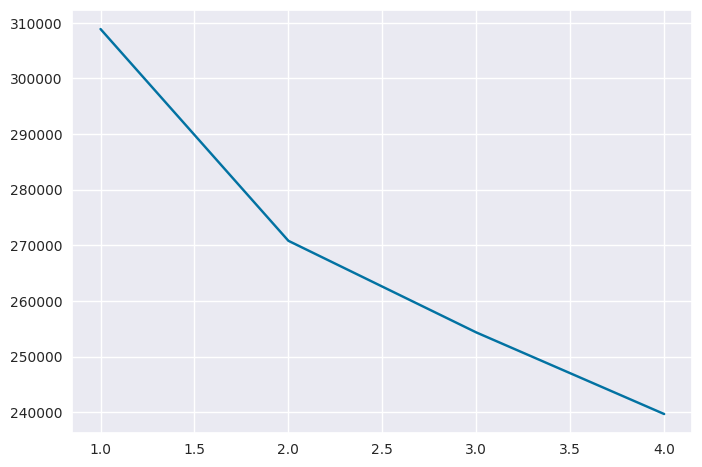

In [ ]:
plt.plot(range(1, 5), WSSs)

De acuerdo a la gráfica, con un K= 2 encontramos aproximadamente el codo.



*   Silueta

Utilizamos el método de la silueta para validar cúal sería el mejor k. Procedemos a evaluar siluetas para k= 2, 3,4,5


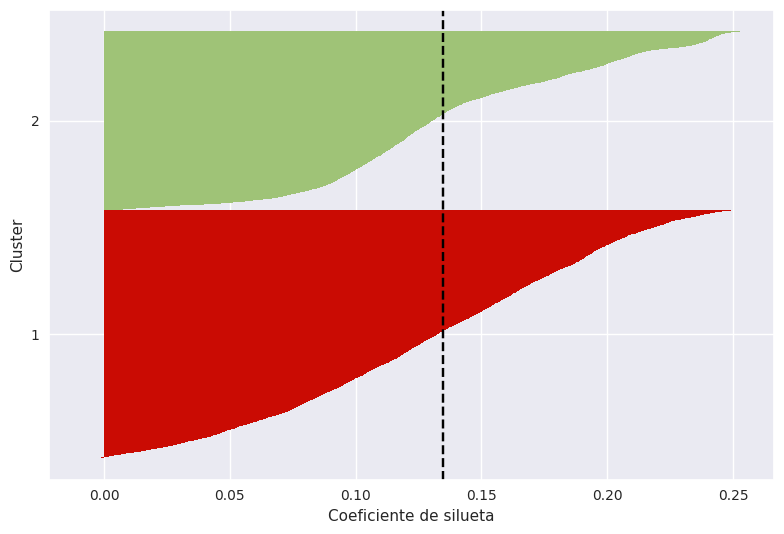

In [ ]:
k=2
kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
kmeans.fit(df_merge_std)
y_clusters = kmeans.labels_
cluster_labels = np.unique(y_clusters)

silueta_puntos= silhouette_samples(df_merge_std, y_clusters, metric='euclidean')

y_ax_lower, y_ax_upper = 0, 0
yticks = []
colores = ['r', 'g', 'b', 'y', 'o']
for i, c in enumerate(cluster_labels):
    silueta_puntos_c = silueta_puntos[y_clusters == c]
    silueta_puntos_c.sort()
    y_ax_upper += len(silueta_puntos_c)
    color = colores[i]
    plt.barh(range(y_ax_lower, y_ax_upper), silueta_puntos_c, height=1.0,
             edgecolor='none', color=color)

    yticks.append((y_ax_lower + y_ax_upper) / 2.)
    y_ax_lower += len(silueta_puntos_c)

silueta_promedio = np.mean(silueta_puntos)
plt.axvline(silueta_promedio, color="black", linestyle="--")

plt.yticks(yticks, cluster_labels + 1)
plt.ylabel('Cluster')
plt.xlabel('Coeficiente de silueta')

plt.tight_layout()
plt.show()

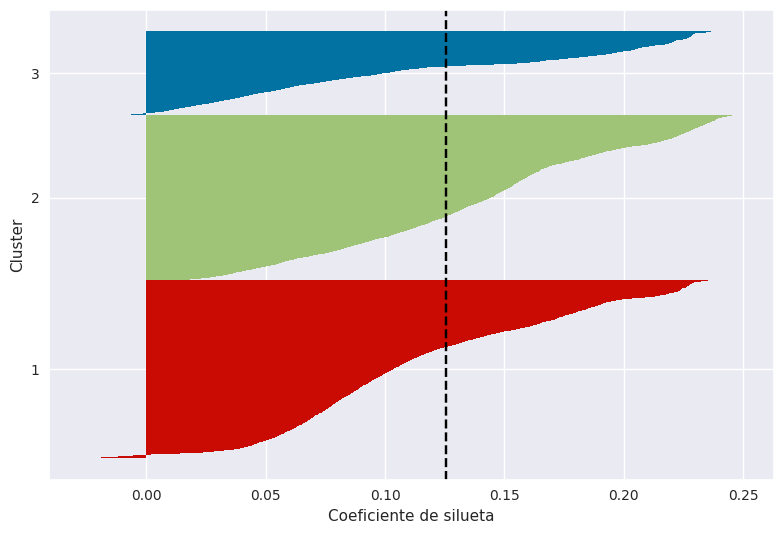

In [ ]:
k=3
kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
kmeans.fit(df_merge_std)
y_clusters = kmeans.labels_
cluster_labels = np.unique(y_clusters)

silueta_puntos= silhouette_samples(df_merge_std, y_clusters, metric='euclidean')

y_ax_lower, y_ax_upper = 0, 0
yticks = []
colores = ['r', 'g', 'b', 'y', 'o']
for i, c in enumerate(cluster_labels):
    silueta_puntos_c = silueta_puntos[y_clusters == c]
    silueta_puntos_c.sort()
    y_ax_upper += len(silueta_puntos_c)
    color = colores[i]
    plt.barh(range(y_ax_lower, y_ax_upper), silueta_puntos_c, height=1.0,
             edgecolor='none', color=color)

    yticks.append((y_ax_lower + y_ax_upper) / 2.)
    y_ax_lower += len(silueta_puntos_c)

silueta_promedio = np.mean(silueta_puntos)
plt.axvline(silueta_promedio, color="black", linestyle="--")

plt.yticks(yticks, cluster_labels + 1)
plt.ylabel('Cluster')
plt.xlabel('Coeficiente de silueta')

plt.tight_layout()
plt.show()

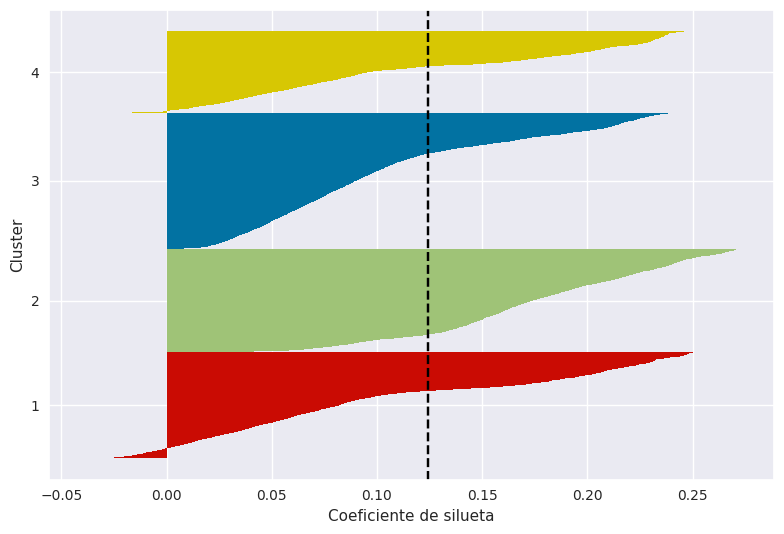

In [ ]:
k=4
kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
kmeans.fit(df_merge_std)
y_clusters = kmeans.labels_
cluster_labels = np.unique(y_clusters)

silueta_puntos= silhouette_samples(df_merge_std, y_clusters, metric='euclidean')

y_ax_lower, y_ax_upper = 0, 0
yticks = []
colores = ['r', 'g', 'b', 'y', 'o']
for i, c in enumerate(cluster_labels):
    silueta_puntos_c = silueta_puntos[y_clusters == c]
    silueta_puntos_c.sort()
    y_ax_upper += len(silueta_puntos_c)
    color = colores[i]
    plt.barh(range(y_ax_lower, y_ax_upper), silueta_puntos_c, height=1.0,
             edgecolor='none', color=color)

    yticks.append((y_ax_lower + y_ax_upper) / 2.)
    y_ax_lower += len(silueta_puntos_c)

silueta_promedio = np.mean(silueta_puntos)
plt.axvline(silueta_promedio, color="black", linestyle="--")

plt.yticks(yticks, cluster_labels + 1)
plt.ylabel('Cluster')
plt.xlabel('Coeficiente de silueta')

plt.tight_layout()
plt.show()

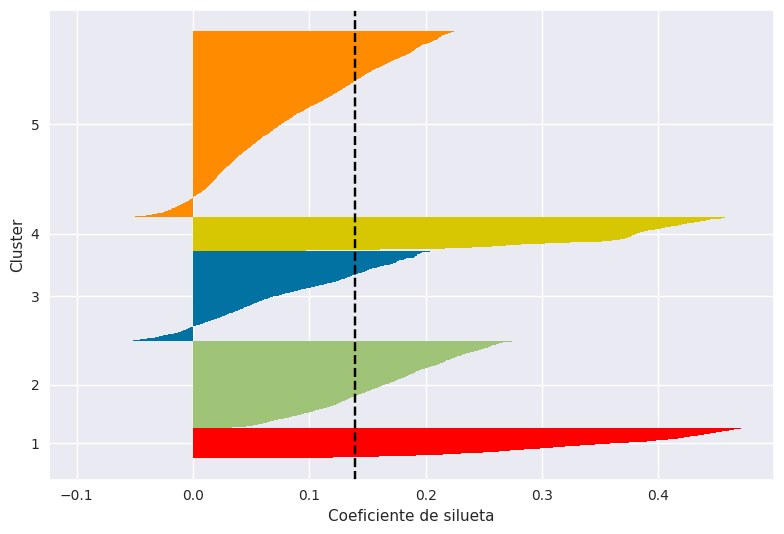

In [ ]:
k=5
kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
kmeans.fit(df_merge_std)
y_clusters = kmeans.labels_
cluster_labels = np.unique(y_clusters)

silueta_puntos= silhouette_samples(df_merge_std, y_clusters, metric='euclidean')

y_ax_lower, y_ax_upper = 0, 0
yticks = []
colores = ['red', 'g', 'b', 'y', 'darkorange','black','purple','pink','skyblue']
for i, c in enumerate(cluster_labels):
    silueta_puntos_c = silueta_puntos[y_clusters == c]
    silueta_puntos_c.sort()
    y_ax_upper += len(silueta_puntos_c)
    color = colores[i]
    plt.barh(range(y_ax_lower, y_ax_upper), silueta_puntos_c, height=1.0,
             edgecolor='none', color=color)

    yticks.append((y_ax_lower + y_ax_upper) / 2.)
    y_ax_lower += len(silueta_puntos_c)

silueta_promedio = np.mean(silueta_puntos)
plt.axvline(silueta_promedio, color="black", linestyle="--")

plt.yticks(yticks, cluster_labels + 1)
plt.ylabel('Cluster')
plt.xlabel('Coeficiente de silueta')

plt.tight_layout()
plt.show()

De acuerdo a las validaciónes de los diferentes k, podemos concluir que el k con el coeficiente de silueta más alto es k =2 con un coefeciente superior al 0.15

* Calinski Harabasz




In [ ]:
CHs = []
for i in range(2,5) :
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(df_merge_std)
    CH = calinski_harabasz_score(df_merge_std, km.labels_)
    CHs.append(CH)
CHs

[1496.49954009647, 1141.229981472275, 1024.424631809849]

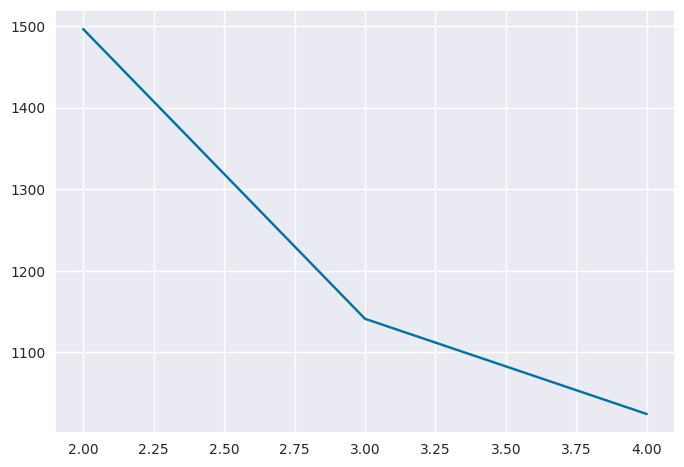

In [ ]:
plt.plot(range(2, 5), CHs)

Podemos observar que el k que maximiza la separación entre
clusters es aproximadamente 2.



**Conclusión k**

Dado que el método codo y Calinski Harabasz dieron un resultado de k=2, procedemos a evaluar con este valor.

In [ ]:
kmeans = KMeans(n_clusters=2, random_state=0, n_init=10)
kmeans.fit(df_merge_std)
clusters = kmeans.labels_

In [ ]:
df_merge_std['Cluster']= clusters
counter=Counter(clusters)
print(counter)

Counter({0: 6191, 1: 4460})


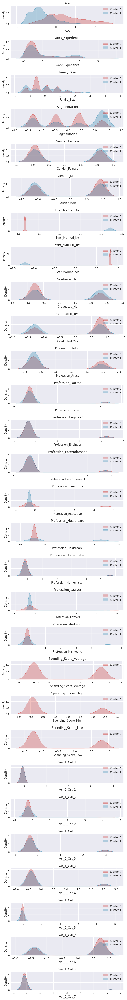

In [ ]:
fig = plt.figure(figsize=(8,70))
i=1
for var in columns_merge:
    ax = fig.add_subplot(math.ceil(len(columns_merge)), 1, i)
    sns.kdeplot(df_merge_std.loc[df_merge_std.Cluster==0][var], shade=True, color='r', ax=ax);
    sns.kdeplot(df_merge_std.loc[df_merge_std.Cluster==1][var], shade=True, color='b', ax=ax);
    plt.title(var)
    plt.subplots_adjust(hspace=0.9)
    plt.legend(['Cluster 0', 'Cluster 1'])
    i+=1

De acuerdo al plot anterior podemos observar que para las variables Ever_Married_Yes y Ever_Married_No, los dos clusters se distinguen con facilidad.

En las variables que representan el Spending_Score podemos observar que solo estan representadas en el cluster 0.

La variable "Age" se pueden identificar dos clusters, pero con cierta combinación entre ellos.

Para las demás variables los clusters no se pueden separar directamente del otro.